In [20]:
import yfinance as yf
import pandas as pd
import os
from datetime import datetime, timedelta
import logging
import requests
import time

# Setup logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

def setup_directory(directory_path):
    """Create directory if it doesn't exist"""
    if not os.path.exists(directory_path):
        os.makedirs(directory_path)
        logger.info(f"Created directory: {directory_path}")

def get_top_100_cryptos():
    """Get top 100 cryptocurrencies by market cap from CoinGecko API, excluding stablecoins, wrapped tokens, and staked tokens"""
    try:
        # Common stablecoins to exclude
        stablecoins = {
            'USDT', 'USDC', 'BUSD', 'DAI', 'FRAX', 'TUSD', 'USDP', 'USDD', 'GUSD', 
            'PYUSD', 'USDE', 'SUSDE-USD', 'LUSD', 'FDUSD', 'CRVUSD', 'USDK', 'USTC',
            'USDJ', 'DJED', 'USDN', 'RSR', 'USDR', 'USDX', 'EURS', 'EURT', 'XSGD',
            'USDS', 'USDB', 'USDT-TRX', 'USDC-TRX'
        }
        
        # Wrapped tokens and staked tokens to exclude
        wrapped_staked_tokens = {
            'WBTC', 'WETH', 'WBNB', 'WAVAX', 'WMATIC', 'WFTM', 'WSOL', 'WADA', 'WDOT',
            'STETH', 'WSTETH', 'RETH', 'CBETH', 'ANKR', 'SFRXETH', 'FRXETH', 'LIDO',
            'BETH', 'BETH', 'AAVE', 'COMP', 'MKR', 'SNX', 'YFI', 'CRV', 'CVX',
            'AETHC', 'AWETH', 'CDAI', 'CUSDC', 'CUSDT', 'CETH', 'CBTC', 'CLINK',
            'WEETH', 'SWETH', 'OSETH', 'EZETH', 'PUFETH', 'METH', 'RNDR', 'LDO',
            'STMATIC', 'STSOLANA', 'STADOT', 'STADA', 'STETH', 'BSTX', 'USTD',
            'STATERA', 'STAKED', 'LIQUID', 'WRAPPED', 'STAKE', 'ETHW', 'ETHF'
        }
        
        url = "https://api.coingecko.com/api/v3/coins/markets"
        params = {
            'vs_currency': 'usd',
            'order': 'market_cap_desc',
            'per_page': 250,  # Get more to account for filtering
            'page': 1,
            'sparkline': False
        }
        
        response = requests.get(url, params=params)
        response.raise_for_status()
        data = response.json()
        
        # Create mapping of coin symbols to Yahoo Finance tickers, excluding filtered tokens
        crypto_map = {}
        count = 0
        
        for coin in data:
            if count >= 100:  # Stop when we have 100 filtered cryptos
                break
                
            symbol = coin['symbol'].upper()
            name = coin['name']
            market_cap = coin['market_cap']
            
            # Skip stablecoins
            if symbol in stablecoins:
                continue
            
            # Skip wrapped and staked tokens
            if symbol in wrapped_staked_tokens:
                continue
            
            # Check name for stablecoin keywords
            name_lower = name.lower()
            if any(keyword in name_lower for keyword in ['usd', 'dollar', 'stable', 'usdt', 'usdc']):
                if not any(keyword in name_lower for keyword in ['bitcoin', 'ethereum', 'solana', 'cardano']):
                    continue
            
            # Check name for wrapped/staked keywords
            if any(keyword in name_lower for keyword in ['wrapped', 'staked', 'liquid staking', 'staking']):
                continue
            
            # Check for wrapped token patterns (starts with W)
            if symbol.startswith('W') and len(symbol) <= 5:
                if any(base in symbol[1:] for base in ['BTC', 'ETH', 'BNB', 'SOL', 'ADA', 'DOT', 'AVAX', 'MATIC']):
                    continue
            
            # Check for staked token patterns
            if (symbol.startswith('ST') or symbol.startswith('S') or 
                any(symbol.endswith(suffix) for suffix in ['ETH', 'STETH', 'RETH'])):
                if any(keyword in name_lower for keyword in ['staked', 'staking', 'liquid', 'stake']):
                    continue
            
            # Yahoo Finance uses -USD suffix for crypto pairs
            yahoo_ticker = f"{symbol}-USD"
            
            crypto_map[symbol] = {
                'name': name,
                'yahoo_ticker': yahoo_ticker,
                'market_cap': market_cap,
                'rank': coin['market_cap_rank'],
                'asset_type': 'crypto'
            }
            
            count += 1
            
        logger.info(f"Retrieved top {len(crypto_map)} cryptocurrencies from CoinGecko")
        return crypto_map
        
    except Exception as e:
        logger.error(f"Error fetching top 100 cryptos: {e}")
        return {}

def get_futures_tickers():
    """Get futures tickers and their descriptions"""
    
    futures_map = {
        'ES=F': {'name': 'S&P 500 E-mini', 'category': 'Index', 'asset_type': 'futures'},
        'YM=F': {'name': 'Dow Jones E-mini', 'category': 'Index', 'asset_type': 'futures'},
        'NQ=F': {'name': 'Nasdaq 100 E-mini', 'category': 'Index', 'asset_type': 'futures'},
        'RTY=F': {'name': 'Russell 2000 E-mini', 'category': 'Index', 'asset_type': 'futures'},
        'CL=F': {'name': 'Crude Oil (WTI)', 'category': 'Energy', 'asset_type': 'futures'},
        'BZ=F': {'name': 'Brent Crude Oil', 'category': 'Energy', 'asset_type': 'futures'},
        'NG=F': {'name': 'Natural Gas', 'category': 'Energy', 'asset_type': 'futures'},
        'GC=F': {'name': 'Gold', 'category': 'Metals', 'asset_type': 'futures'},
        'SI=F': {'name': 'Silver', 'category': 'Metals', 'asset_type': 'futures'},
        'PL=F': {'name': 'Platinum', 'category': 'Metals', 'asset_type': 'futures'},
        'PA=F': {'name': 'Palladium', 'category': 'Metals', 'asset_type': 'futures'},
        'HG=F': {'name': 'Copper', 'category': 'Metals', 'asset_type': 'futures'},
        'ZB=F': {'name': '30-Year Treasury Bond', 'category': 'Bonds', 'asset_type': 'futures'},
        'ZN=F': {'name': '10 Year Treasury Note', 'category': 'Bonds', 'asset_type': 'futures'},
        'ZF=F': {'name': '5-Year Treasury Note', 'category': 'Bonds', 'asset_type': 'futures'},
        'ZT=F': {'name': '2 Year Treasury Note', 'category': 'Bonds', 'asset_type': 'futures'},
        'DX=F': {'name': 'US Dollar Index', 'category': 'Currency', 'asset_type': 'futures'},
        'ZC=F': {'name': 'Corn', 'category': 'Agriculture', 'asset_type': 'futures'},
        'ZS=F': {'name': 'Soybeans', 'category': 'Agriculture', 'asset_type': 'futures'},
        'ZW=F': {'name': 'Wheat', 'category': 'Agriculture', 'asset_type': 'futures'},
        'LE=F': {'name': 'Live Cattle', 'category': 'Agriculture', 'asset_type': 'futures'},
        'HE=F': {'name': 'Lean Hogs', 'category': 'Agriculture', 'asset_type': 'futures'},
        'KC=F': {'name': 'Coffee', 'category': 'Agriculture', 'asset_type': 'futures'},
        'SB=F': {'name': 'Sugar', 'category': 'Agriculture', 'asset_type': 'futures'},
        'CT=F': {'name': 'Cotton', 'category': 'Agriculture', 'asset_type': 'futures'},
        'CC=F': {'name': 'Cocoa', 'category': 'Agriculture', 'asset_type': 'futures'},
        'OJ=F': {'name': 'Orange Juice', 'category': 'Agriculture', 'asset_type': 'futures'},
        'RB=F': {'name': 'RBOB Gasoline', 'category': 'Energy', 'asset_type': 'futures'},
        'HO=F': {'name': 'Heating Oil', 'category': 'Energy', 'asset_type': 'futures'}
    }
    
    logger.info(f"Retrieved {len(futures_map)} futures contracts")
    return futures_map

def get_sp500_stocks():
    """Get all S&P 500 stock symbols from datahub.io"""
    try:
        # URL for S&P 500 constituents data
        url = "https://datahub.io/core/s-and-p-500-companies/r/constituents.csv"
        
        # Read the CSV data
        logger.info("Fetching S&P 500 constituents from datahub.io...")
        sp500_df = pd.read_csv(url)
        logger.info(f"Downloaded S&P 500 constituents data with {len(sp500_df)} companies")
        
        stock_map = {}
        
        # Iterate through all companies in the S&P 500
        for _, row in sp500_df.iterrows():
            symbol = row['Symbol']
            company_name = row['Name']
            sector = row['Sector']
            
            stock_map[symbol] = {
                'name': company_name,
                'yahoo_ticker': symbol,
                'asset_type': 'stock',
                'category': 'S&P500',
                'sector': sector
            }
        
        logger.info(f"Retrieved {len(stock_map)} S&P 500 stocks")
        
        # Display summary by sector
        sector_counts = sp500_df['Sector'].value_counts()
        logger.info("S&P 500 sector breakdown:")
        for sector, count in sector_counts.items():
            logger.info(f"  {sector}: {count} companies")
        
        return stock_map
        
    except Exception as e:
        logger.error(f"Error fetching S&P 500 stocks from datahub.io: {e}")
        logger.info("Falling back to major S&P 500 stocks...")
        
        # Fallback to major stocks if the API fails
        major_stocks = [
            'AAPL', 'MSFT', 'GOOGL', 'AMZN', 'NVDA', 'TSLA', 'META', 'GOOG', 'BRK-B', 'UNH',
            'XOM', 'JNJ', 'JPM', 'V', 'PG', 'MA', 'CVX', 'HD', 'PFE', 'ABBV',
            'BAC', 'KO', 'AVGO', 'PEP', 'TMO', 'COST', 'WMT', 'DIS', 'ABT', 'DHR',
            'VZ', 'ADBE', 'CRM', 'NFLX', 'ORCL', 'MRK', 'INTC', 'T', 'CSCO', 'AMD',
            'ACN', 'TXN', 'NKE', 'LIN', 'QCOM', 'RTX', 'PM', 'HON', 'LOW', 'IBM'
        ]
        
        stock_map = {}
        for symbol in major_stocks:
            stock_map[symbol] = {
                'name': symbol,
                'yahoo_ticker': symbol,
                'asset_type': 'stock',
                'category': 'S&P500',
                'sector': 'Unknown'
            }
        
        logger.info(f"Using fallback list with {len(stock_map)} major S&P 500 stocks")
        return stock_map

def get_financial_data(ticker, asset_type, start_date=None, end_date=None):
    """Download financial data from Yahoo Finance"""
    try:
        instrument = yf.Ticker(ticker)
        
        if start_date and end_date:
            data = instrument.history(start=start_date, end=end_date)
        else:
            # Get all available historical data
            data = instrument.history(period="max")
        
        if data.empty:
            logger.warning(f"No data retrieved for {ticker}")
            return None
            
        # Reset index to make Date a column
        data.reset_index(inplace=True)
        
        # Clean up column names and convert Date to consistent format
        data['time'] = pd.to_datetime(data['Date']).dt.date
        
        # Select columns based on asset type
        if asset_type in ['futures', 'stock']:
            # Include volume for futures and stocks
            columns = ['time', 'Open', 'High', 'Low', 'Close', 'Volume']
            data = data[columns].copy()
            data.columns = ['time', 'open', 'high', 'low', 'close', 'volume']
        else:
            # Crypto - no volume for consistency
            columns = ['time', 'Open', 'High', 'Low', 'Close']
            data = data[columns].copy()
            data.columns = ['time', 'open', 'high', 'low', 'close']
            data['volume'] = 0  # Add volume column with 0 for consistency
        
        # Add metadata columns
        data['symbol'] = ticker
        data['asset_type'] = asset_type
        
        logger.info(f"Retrieved {len(data)} rows for {ticker} ({asset_type})")
        return data
        
    except Exception as e:
        logger.warning(f"Error downloading data for {ticker}: {e}")
        return None

def load_existing_data(file_path):
    """Load existing CSV data if it exists"""
    if os.path.exists(file_path):
        try:
            df = pd.read_csv(file_path)
            df['time'] = pd.to_datetime(df['time']).dt.date
            logger.info(f"Loaded existing data with {len(df)} rows")
            return df
        except Exception as e:
            logger.error(f"Error loading existing data: {e}")
            return None
    else:
        logger.info("No existing master data file found")
        return None

def get_last_date_for_symbol(df, symbol):
    """Get the last date from existing data for a specific symbol"""
    if df is not None and not df.empty:
        symbol_data = df[df['symbol'] == symbol]
        if not symbol_data.empty:
            return symbol_data['time'].max()
    return None

def merge_and_save_data(existing_df, new_data_list, file_path):
    """Merge existing and new data, remove duplicates, and save"""
    # Combine all new data
    if new_data_list:
        new_df = pd.concat(new_data_list, ignore_index=True)
    else:
        logger.info("No new data to save")
        return False
    
    if existing_df is not None:
        # Ensure both dataframes have consistent time column types
        existing_df['time'] = pd.to_datetime(existing_df['time']).dt.date
        new_df['time'] = pd.to_datetime(new_df['time']).dt.date
        
        # Combine dataframes
        combined_df = pd.concat([existing_df, new_df], ignore_index=True)
        
        # Remove duplicates based on time and symbol, keeping the latest entry
        combined_df = combined_df.drop_duplicates(subset=['time', 'symbol'], keep='last')
        
        # Convert time to string for sorting to avoid comparison issues
        combined_df['time_str'] = combined_df['time'].astype(str)
        combined_df = combined_df.sort_values(['asset_type', 'symbol', 'time_str']).reset_index(drop=True)
        combined_df = combined_df.drop('time_str', axis=1)  # Remove helper column
        
        logger.info(f"Merged data: {len(existing_df)} existing + {len(new_df)} new = {len(combined_df)} total rows")
    else:
        # Ensure consistent time column type
        new_df['time'] = pd.to_datetime(new_df['time']).dt.date
        
        # Sort new data
        new_df['time_str'] = new_df['time'].astype(str)
        combined_df = new_df.sort_values(['asset_type', 'symbol', 'time_str']).reset_index(drop=True)
        combined_df = combined_df.drop('time_str', axis=1)  # Remove helper column
        
        logger.info(f"New master file with {len(combined_df)} rows")
    
    # Save to CSV
    try:
        combined_df.to_csv(file_path, index=False)
        logger.info(f"Master data saved to: {file_path}")
        return True
    except Exception as e:
        logger.error(f"Error saving master data: {e}")
        return False

def download_asset_class_data(asset_map, asset_type, existing_data):
    """Download data for a specific asset class"""
    new_data_list = []
    successful_downloads = 0
    failed_downloads = 0
    
    logger.info(f"Starting to download {asset_type} data for {len(asset_map)} instruments...")
    
    for i, (symbol, info) in enumerate(asset_map.items(), 1):
        ticker = info.get('yahoo_ticker', symbol)
        name = info.get('name', symbol)
        
        logger.info(f"Processing {asset_type} {i}/{len(asset_map)}: {name} ({ticker})")
        
        # Check if we need to update this symbol
        last_date = get_last_date_for_symbol(existing_data, ticker)
        
        if last_date:
            # If we have existing data, get new data from the day after last date
            start_date = last_date + timedelta(days=1)
            end_date = datetime.now().date()
            
            if start_date > end_date:
                logger.info(f"Data for {ticker} is already up to date")
                continue
                
            new_data = get_financial_data(ticker, asset_type, start_date=start_date, end_date=end_date)
        else:
            # If no existing data, download all historical data
            new_data = get_financial_data(ticker, asset_type)
        
        if new_data is not None and not new_data.empty:
            new_data_list.append(new_data)
            successful_downloads += 1
        else:
            failed_downloads += 1
            
        # Add delay to avoid hitting API rate limits
        time.sleep(0.1)
        
        # Progress update
        if i % 10 == 0:
            logger.info(f"{asset_type.title()} Progress: {i}/{len(asset_map)} completed. Success: {successful_downloads}, Failed: {failed_downloads}")
    
    return new_data_list, successful_downloads, failed_downloads

def main():
    """Main function to download all financial data and create master file"""
    # Configuration
    base_directory = r"C:\Users\Chris\BTC_price_history\Master file"
    file_name = "master_financial_data.csv"
    file_path = os.path.join(base_directory, file_name)
    
    # Setup directory
    setup_directory(base_directory)
    
    # Load existing data
    existing_data = load_existing_data(file_path)
    
    # Get all asset mappings
    print("Fetching asset lists...")
    crypto_map = get_top_100_cryptos()
    futures_map = get_futures_tickers()
    stocks_map = get_sp500_stocks()
    
    # Track overall statistics
    all_new_data = []
    total_successful = 0
    total_failed = 0
    
    # Download each asset class
    asset_classes = [
        (crypto_map, 'crypto'),
        (futures_map, 'futures'),
        (stocks_map, 'stock')
    ]
    
    for asset_map, asset_type in asset_classes:
        if asset_map:  # Only process if we have data for this asset class
            new_data_list, successful, failed = download_asset_class_data(asset_map, asset_type, existing_data)
            all_new_data.extend(new_data_list)
            total_successful += successful
            total_failed += failed
        else:
            logger.warning(f"No {asset_type} data to download")
    
    # Save all the data
    if all_new_data:
        success = merge_and_save_data(existing_data, all_new_data, file_path)
        
        if success:
            # Display comprehensive summary
            final_data = pd.read_csv(file_path)
            
            print(f"\n{'='*80}")
            print(f"MASTER FINANCIAL DATA UPDATE COMPLETE")
            print(f"{'='*80}")
            print(f"File location: {file_path}")
            print(f"Total records: {len(final_data):,}")
            print(f"Successful downloads: {total_successful}")
            print(f"Failed downloads: {total_failed}")
            
            if not final_data.empty:
                print(f"Date range: {final_data['time'].min()} to {final_data['time'].max()}")
                
                # Summary by asset type
                asset_summary = final_data.groupby('asset_type').agg({
                    'symbol': 'nunique',
                    'time': ['min', 'max']
                }).round(2)
                
                print(f"\nSummary by Asset Type:")
                print("-" * 50)
                for asset_type in ['crypto', 'futures', 'stock']:
                    if asset_type in asset_summary.index:
                        count = asset_summary.loc[asset_type, ('symbol', 'nunique')]
                        min_date = asset_summary.loc[asset_type, ('time', 'min')]
                        max_date = asset_summary.loc[asset_type, ('time', 'max')]
                        print(f"{asset_type.title()}: {count} instruments, {min_date} to {max_date}")
                
                # Show latest prices for sample instruments
                latest_data = final_data.loc[final_data.groupby('symbol')['time'].idxmax()]
                
                print(f"\nSample Latest Prices:")
                print("-" * 30)
                
                # Sample from each asset type
                samples = {
                    'crypto': ['BTC-USD', 'ETH-USD', 'SOL-USD'],
                    'futures': ['ES=F', 'GC=F', 'CL=F'],
                    'stock': ['AAPL', 'MSFT', 'TSLA']
                }
                
                for asset_type, symbols in samples.items():
                    print(f"{asset_type.title()}:")
                    for symbol in symbols:
                        if symbol in latest_data['symbol'].values:
                            price = latest_data[latest_data['symbol']==symbol]['close'].iloc[0]
                            print(f"  {symbol}: ${price:.2f}")
                
            print(f"{'='*80}")
            return final_data
    else:
        logger.info("No new data was downloaded - all instruments up to date")
        if existing_data is not None:
            print(f"\nAll data is current. Master file contains {len(existing_data):,} records.")
            return existing_data
        else:
            print("No data available.")
            return None

if __name__ == "__main__":
    master_data = main()
    
    if master_data is not None:
        print(f"\nMaster data loaded successfully with {len(master_data):,} records")
        print("You can now use this data for your analysis!")
        
        # Optional: Create a global variable 'df' for compatibility with your existing code
        df = master_data
        print("Data is available as 'df' variable for your existing functions.")
    else:
        print("Failed to create master data file.")

2025-06-18 20:36:28,132 - INFO - Loaded existing data with 851773 rows


Fetching asset lists...


2025-06-18 20:36:28,597 - INFO - Retrieved top 100 cryptocurrencies from CoinGecko
2025-06-18 20:36:28,598 - INFO - Retrieved 29 futures contracts
2025-06-18 20:36:28,599 - INFO - Fetching S&P 500 constituents from datahub.io...
2025-06-18 20:36:29,249 - INFO - Downloaded S&P 500 constituents data with 503 companies
2025-06-18 20:36:29,250 - ERROR - Error fetching S&P 500 stocks from datahub.io: 'Name'
2025-06-18 20:36:29,251 - INFO - Falling back to major S&P 500 stocks...
2025-06-18 20:36:29,252 - INFO - Using fallback list with 50 major S&P 500 stocks
2025-06-18 20:36:29,253 - INFO - Starting to download crypto data for 100 instruments...
2025-06-18 20:36:29,254 - INFO - Processing crypto 1/100: Bitcoin (BTC-USD)
2025-06-18 20:36:29,283 - INFO - Data for BTC-USD is already up to date
2025-06-18 20:36:29,284 - INFO - Processing crypto 2/100: Ethereum (ETH-USD)
2025-06-18 20:36:29,313 - INFO - Data for ETH-USD is already up to date
2025-06-18 20:36:29,313 - INFO - Processing crypto 3/


MASTER FINANCIAL DATA UPDATE COMPLETE
File location: C:\Users\Chris\BTC_price_history\Master file\master_financial_data.csv
Total records: 851,773
Successful downloads: 14
Failed downloads: 5
Date range: 1962-01-02 to 2025-06-18

Summary by Asset Type:
--------------------------------------------------
Crypto: 98 instruments, 2014-09-17 to 2025-06-18
Futures: 29 instruments, 1997-10-29 to 2025-06-18
Stock: 50 instruments, 1962-01-02 to 2025-06-18

Sample Latest Prices:
------------------------------
Crypto:
  BTC-USD: $104188.99
  ETH-USD: $2488.15
  SOL-USD: $145.40
Futures:
  ES=F: $5995.50
  GC=F: $3405.40
  CL=F: $74.77
Stock:
  AAPL: $196.60
  MSFT: $479.53
  TSLA: $322.91

Master data loaded successfully with 851,773 records
You can now use this data for your analysis!
Data is available as 'df' variable for your existing functions.


Multi-Asset Regression Analysis Module Loaded
Found master dataset with 850,096 rows and 176 symbols
Starting automatic analysis with charts...
📊 Will display ALL available charts per section per asset class (up to 15)
💡 Sections: Best Trends | Undervalued Opportunities | Overvalued Warnings
📈 Chart type: Linear Regression on Log Scale (straight trend lines)
🔬 COMPREHENSIVE MULTI-ASSET REGRESSION ANALYSIS
Analyzing trend quality, growth rates, and valuation for all instruments...
Analyzing instruments by asset type...
  crypto: 97 instruments
  futures: 29 instruments
  stock: 50 instruments

Processing 97 crypto instruments...
  Progress: 25/97 crypto instruments processed
  Progress: 50/97 crypto instruments processed

Processing 29 futures instruments...
  Progress: 25/29 futures instruments processed

Processing 50 stock instruments...
  Progress: 25/50 stock instruments processed
  Progress: 50/50 stock instruments processed

Analysis complete: 170/176 instruments analyzed success

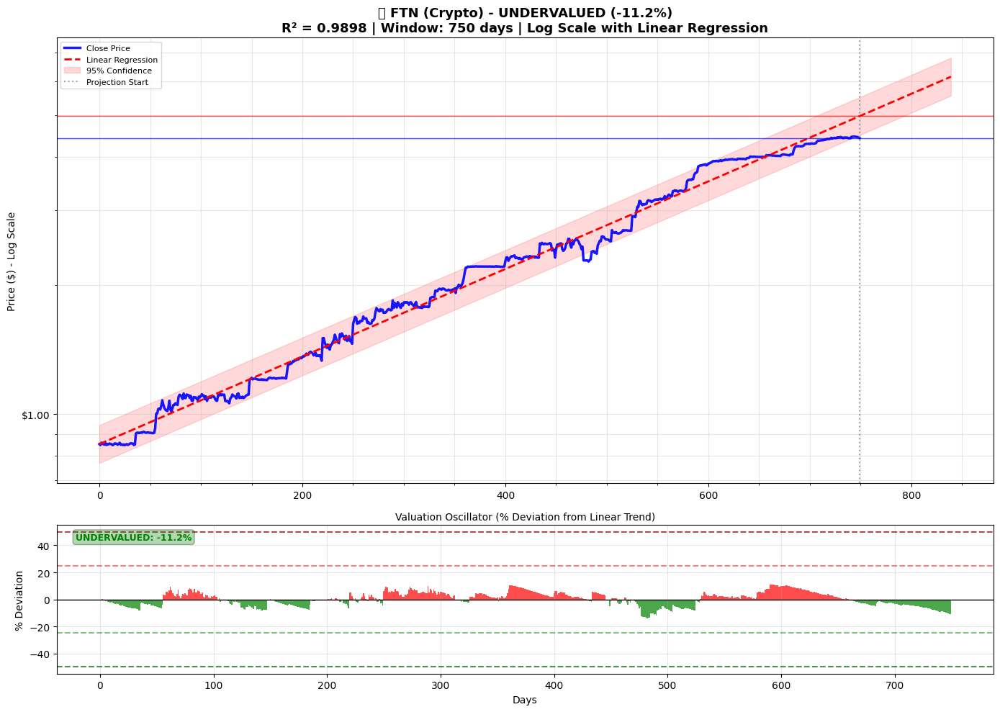


Chart 2: GT-USD (R² = 0.9501)

📊 PRICE PROJECTIONS (Linear Regression - 30 days):
   Current: $15.13
   +30d (1m): $11.53 ($10.83 - $12.28)
   +60d (2m): $8.26 ($7.59 - $8.99)
   Confidence: 95.0% | Valuation: FAIR VALUE
------------------------------------------------------------


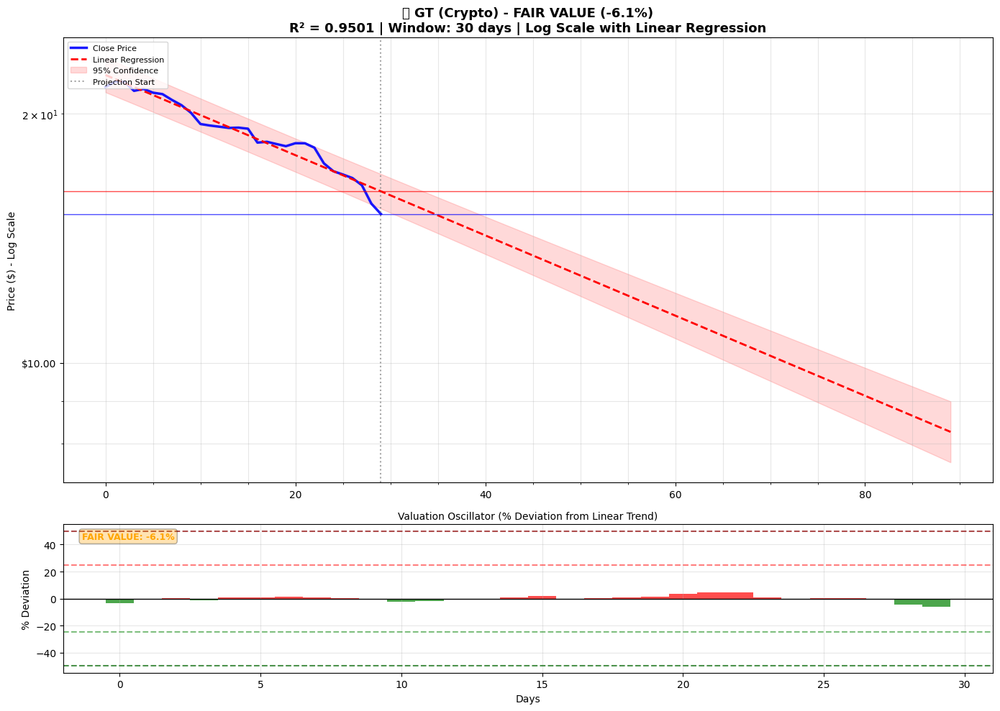


Chart 3: TRX-USD (R² = 0.9461)

📊 PRICE PROJECTIONS (Linear Regression - 1000 days):
   Current: $0.270681
   +30d (1m): $0.282663 ($0.224043 - $0.356621)
   +60d (2m): $0.297592 ($0.235865 - $0.375473)
   +90d (3m): $0.313310 ($0.248311 - $0.395323)
   90-day outlook: 📈 Bullish Trend (+15.7%)
   Confidence: 94.6% | Valuation: FAIR VALUE
------------------------------------------------------------


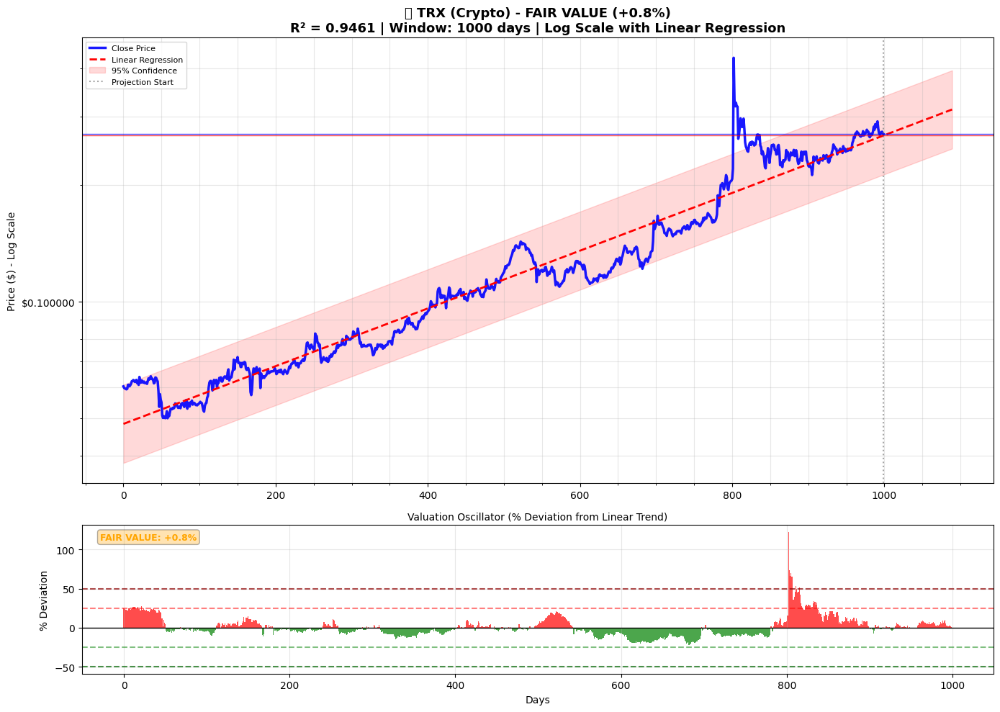


Chart 4: PAXG-USD (R² = 0.9452)

📊 PRICE PROJECTIONS (Linear Regression - 750 days):
   Current: $3.4K
   +30d (1m): $3.3K ($3.0K - $3.6K)
   +60d (2m): $3.4K ($3.1K - $3.7K)
   +90d (3m): $3.5K ($3.2K - $3.8K)
   90-day outlook: ➡️ Sideways Trend (+1.5%)
   Confidence: 94.5% | Valuation: FAIR VALUE
------------------------------------------------------------


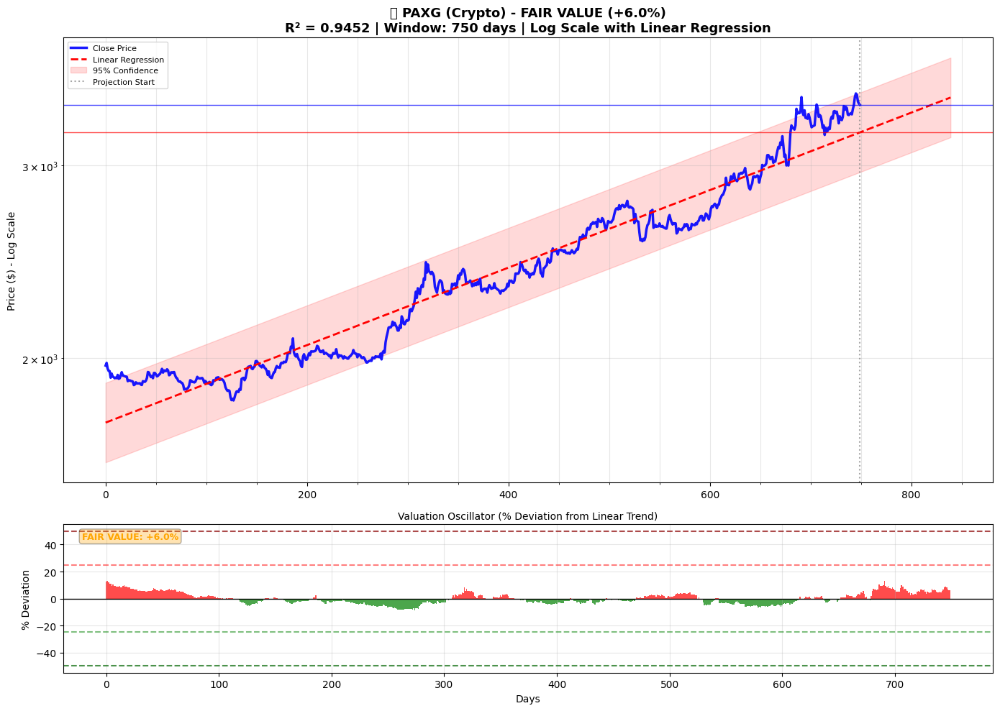


Chart 5: APT-USD (R² = 0.9442)

📊 PRICE PROJECTIONS (Linear Regression - 500 days):
   Current: $0.000131
   +30d (1m): $0.000081 ($0.000057 - $0.000115)
   +60d (2m): $0.000069 ($0.000049 - $0.000099)
   +90d (3m): $0.000060 ($0.000042 - $0.000085)
   90-day outlook: 📉 Bearish Trend (-54.6%)
   Confidence: 94.4% | Valuation: OVERVALUED
------------------------------------------------------------


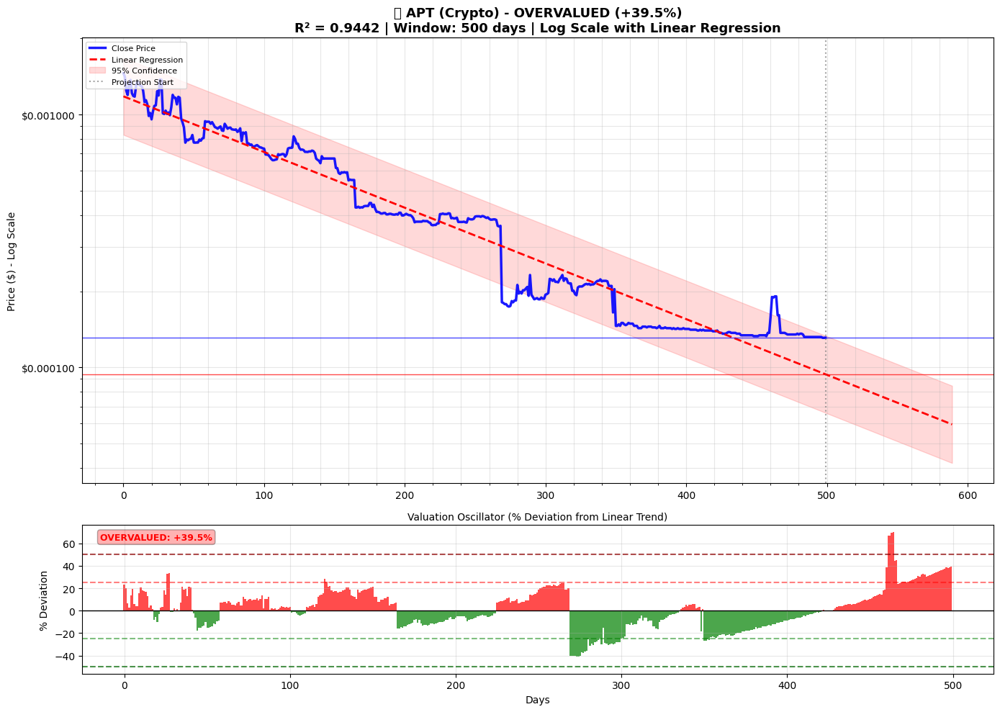


Chart 6: XAUT-USD (R² = 0.9440)

📊 PRICE PROJECTIONS (Linear Regression - 750 days):
   Current: $3.4K
   +30d (1m): $3.3K ($3.0K - $3.6K)
   +60d (2m): $3.4K ($3.1K - $3.6K)
   +90d (3m): $3.4K ($3.2K - $3.7K)
   90-day outlook: ➡️ Sideways Trend (+1.3%)
   Confidence: 94.4% | Valuation: FAIR VALUE
------------------------------------------------------------


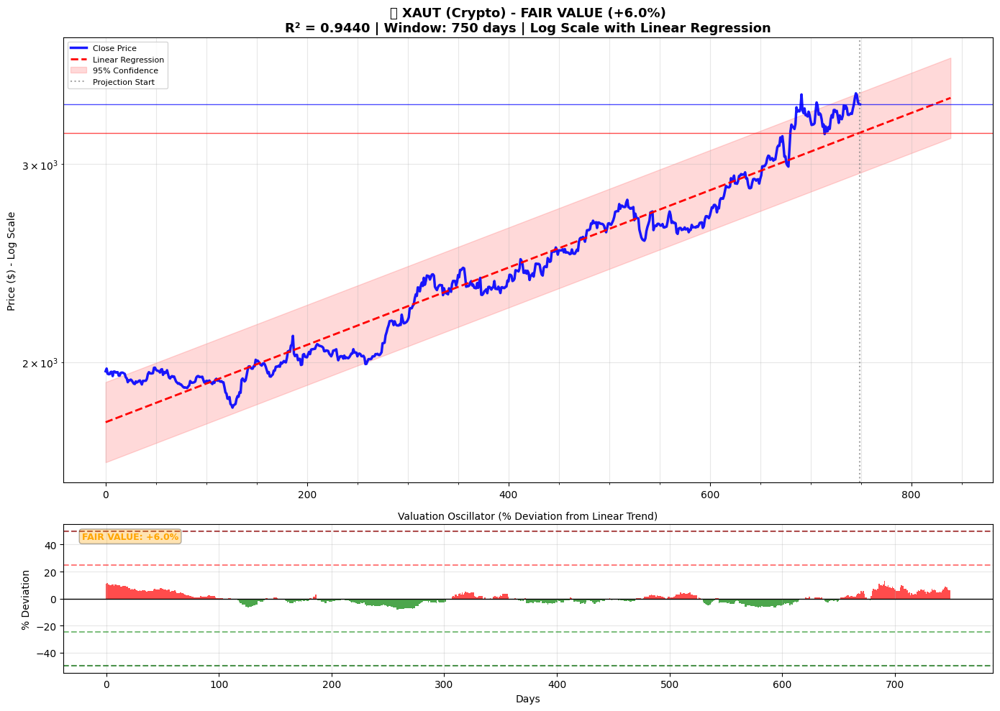


Chart 7: BTC-USD (R² = 0.9360)

📊 PRICE PROJECTIONS (Linear Regression - 1000 days):
   Current: $104.2K
   +30d (1m): $125.6K ($94.1K - $167.7K)
   +60d (2m): $133.2K ($99.8K - $177.7K)
   +90d (3m): $141.2K ($105.8K - $188.4K)
   90-day outlook: 📈 Bullish Trend (+35.5%)
   Confidence: 93.6% | Valuation: UNDERVALUED
------------------------------------------------------------


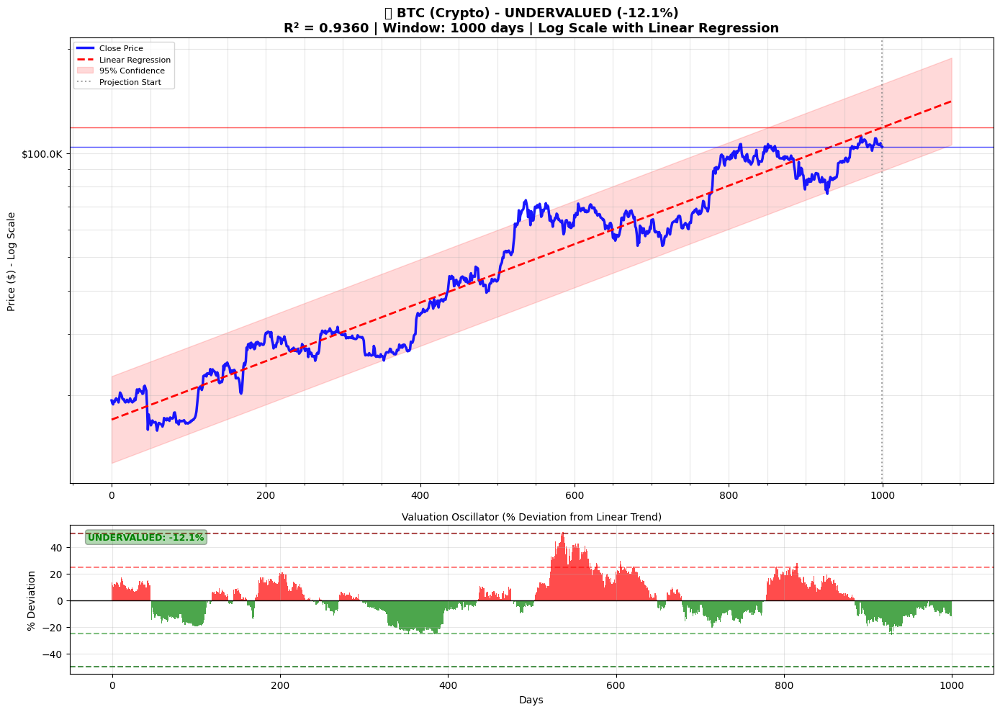


Chart 8: WBT-USD (R² = 0.9308)

📊 PRICE PROJECTIONS (Linear Regression - 750 days):
   Current: $48.73
   +30d (1m): $37.02 ($26.20 - $52.31)
   +60d (2m): $40.48 ($28.64 - $57.20)
   +90d (3m): $44.25 ($31.31 - $62.54)
   90-day outlook: 📉 Bearish Trend (-9.2%)
   Confidence: 93.1% | Valuation: OVERVALUED
------------------------------------------------------------


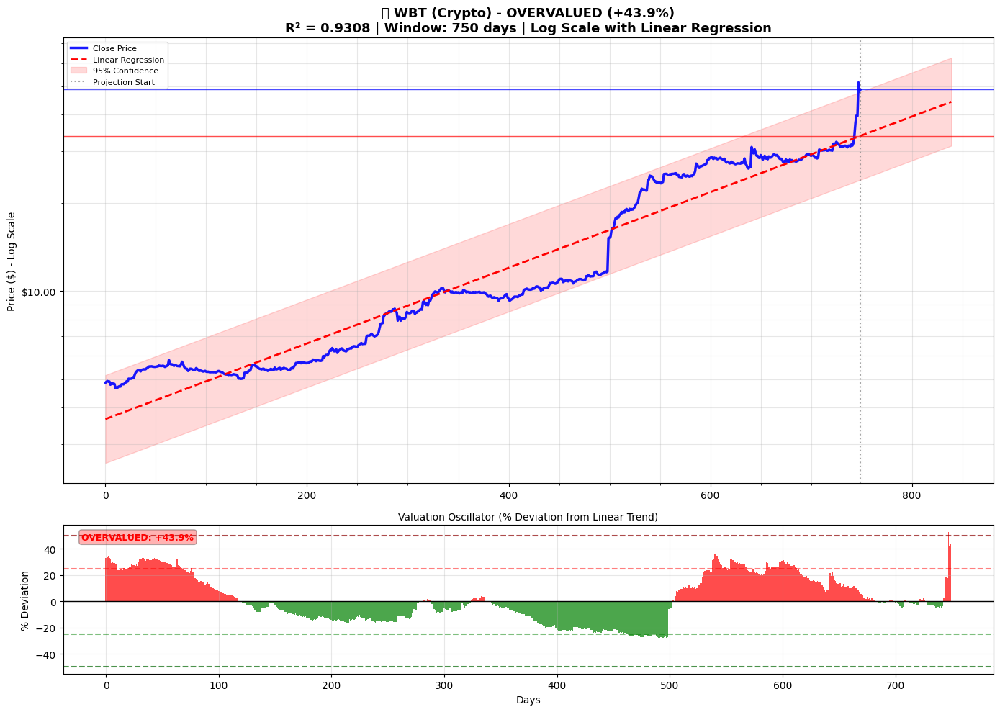


Chart 9: WAL-USD (R² = 0.9273)

📊 PRICE PROJECTIONS (Linear Regression - 1000 days):
   Current: $0.000088
   +30d (1m): $0.000021 ($0.000005 - $0.000082)
   +60d (2m): $0.000016 ($0.000004 - $0.000063)
   +90d (3m): $0.000013 ($0.000003 - $0.000049)
   90-day outlook: 📉 Bearish Trend (-85.7%)
   Confidence: 92.7% | Valuation: OVERVALUED
------------------------------------------------------------


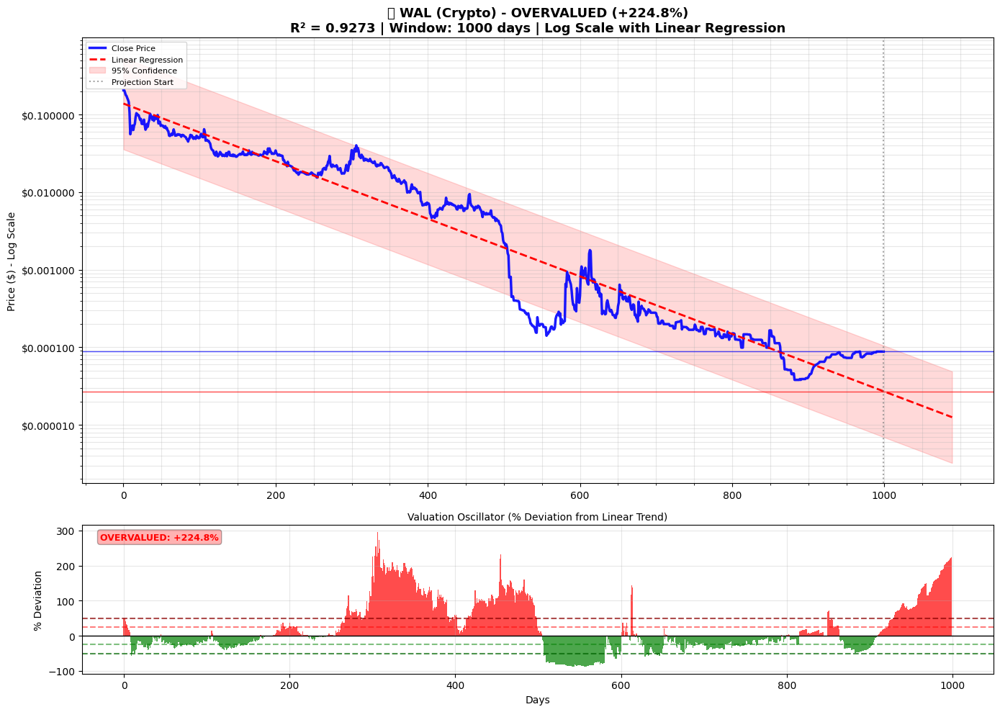


Chart 10: POL-USD (R² = 0.9109)

📊 PRICE PROJECTIONS (Linear Regression - 500 days):
   Current: $0.008241
   +30d (1m): $0.007129 ($0.005557 - $0.009145)
   +60d (2m): $0.006555 ($0.005109 - $0.008411)
   +90d (3m): $0.006028 ($0.004697 - $0.007736)
   90-day outlook: 📉 Bearish Trend (-26.9%)
   Confidence: 91.1% | Valuation: FAIR VALUE
------------------------------------------------------------


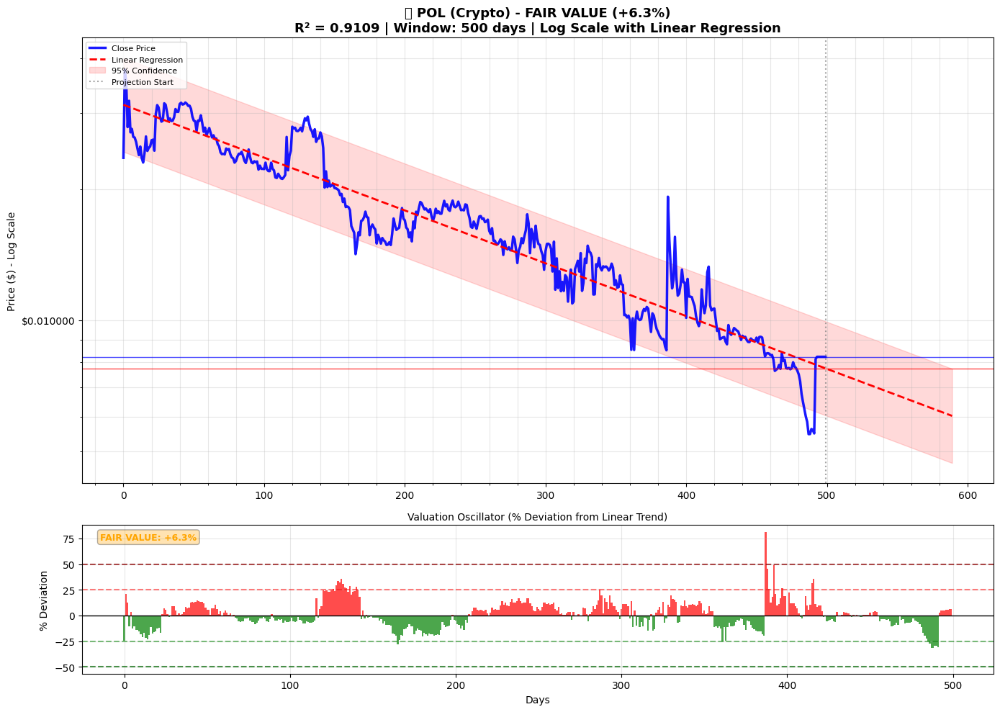


Chart 11: LEO-USD (R² = 0.8915)

📊 PRICE PROJECTIONS (Linear Regression - 750 days):
   Current: $9.19
   +30d (1m): $10.67 ($8.50 - $13.39)
   +60d (2m): $11.17 ($8.90 - $14.02)
   +90d (3m): $11.69 ($9.32 - $14.67)
   90-day outlook: 📈 Bullish Trend (+27.3%)
   Confidence: 89.1% | Valuation: FAIR VALUE
------------------------------------------------------------


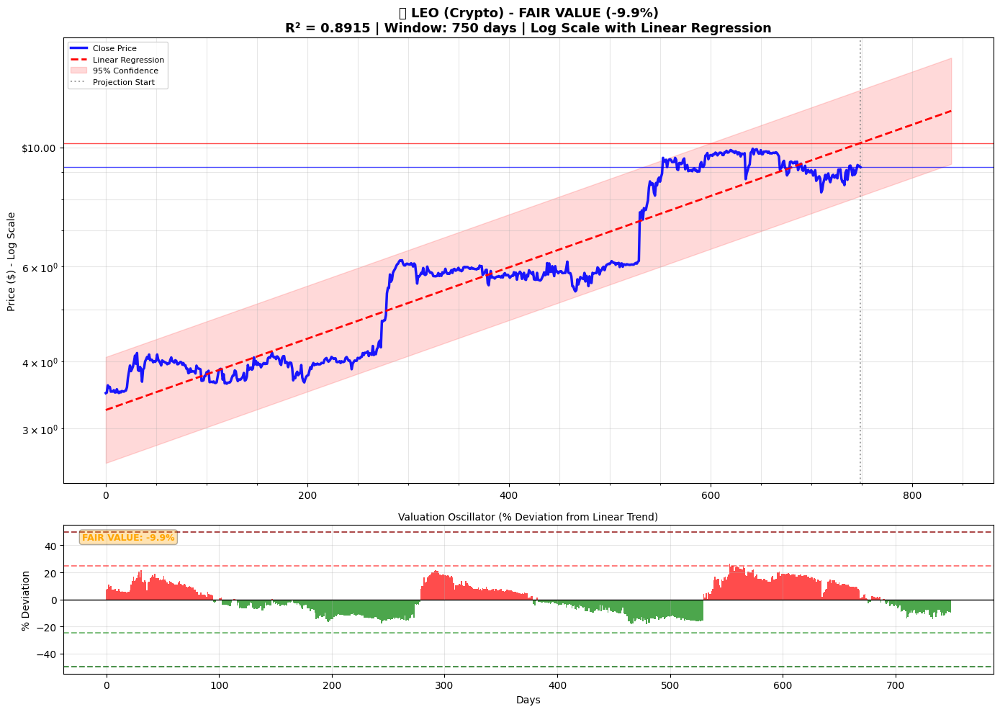


Chart 12: TIA-USD (R² = 0.8904)

📊 PRICE PROJECTIONS (Linear Regression - 30 days):
   Current: $1.68
   +30d (1m): $1.03 ($0.895460 - $1.19)
   +60d (2m): $0.625988 ($0.515141 - $0.760687)
   Confidence: 89.0% | Valuation: FAIR VALUE
------------------------------------------------------------


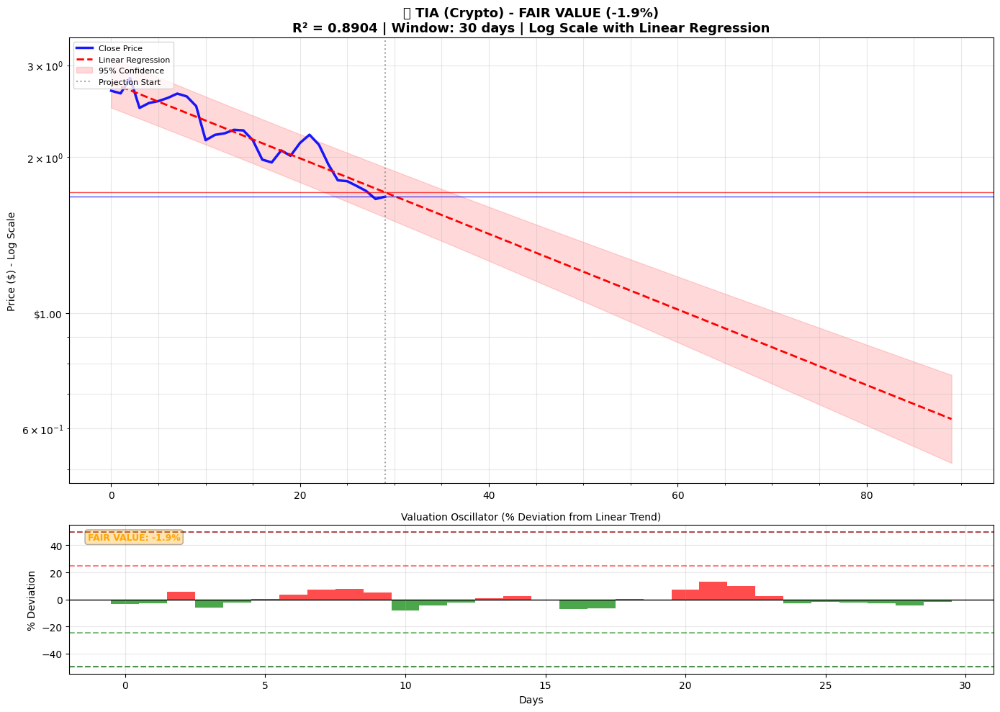


Chart 13: BGB-USD (R² = 0.8892)

📊 PRICE PROJECTIONS (Linear Regression - 1000 days):
   Current: $4.24
   +30d (1m): $5.11 ($2.58 - $10.10)
   +60d (2m): $5.66 ($2.86 - $11.19)
   +90d (3m): $6.26 ($3.17 - $12.39)
   90-day outlook: 📈 Bullish Trend (+47.8%)
   Confidence: 88.9% | Valuation: FAIR VALUE
------------------------------------------------------------


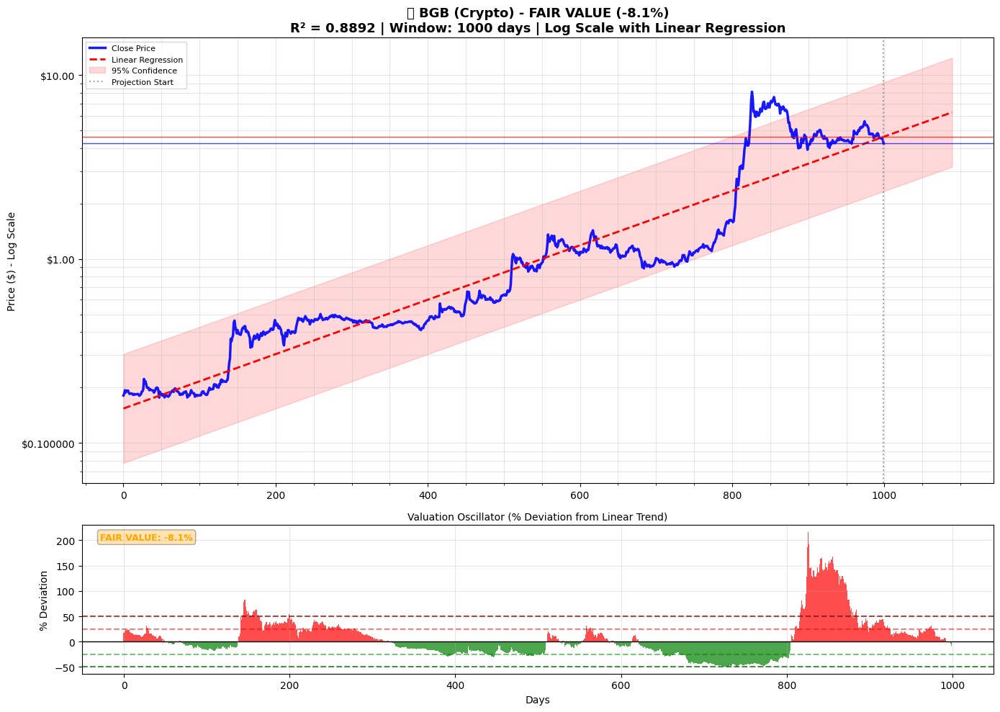


Chart 14: JASMY-USD (R² = 0.8829)

📊 PRICE PROJECTIONS (Linear Regression - 30 days):
   Current: $0.012317
   +30d (1m): $0.008368 ($0.007422 - $0.009435)
   +60d (2m): $0.005593 ($0.004756 - $0.006579)
   Confidence: 88.3% | Valuation: FAIR VALUE
------------------------------------------------------------


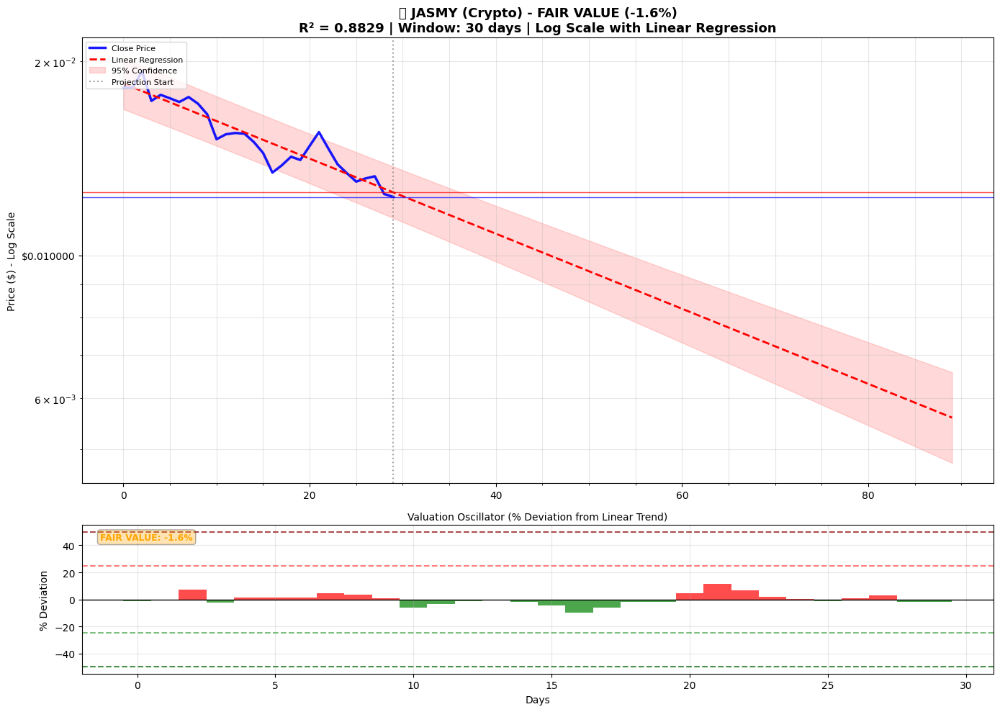


Chart 15: JLP-USD (R² = 0.8538)

📊 PRICE PROJECTIONS (Linear Regression - 500 days):
   Current: $4.36
   +30d (1m): $5.04 ($4.26 - $5.96)
   +60d (2m): $5.26 ($4.44 - $6.22)
   +90d (3m): $5.49 ($4.64 - $6.50)
   90-day outlook: 📈 Bullish Trend (+25.9%)
   Confidence: 85.4% | Valuation: FAIR VALUE
------------------------------------------------------------


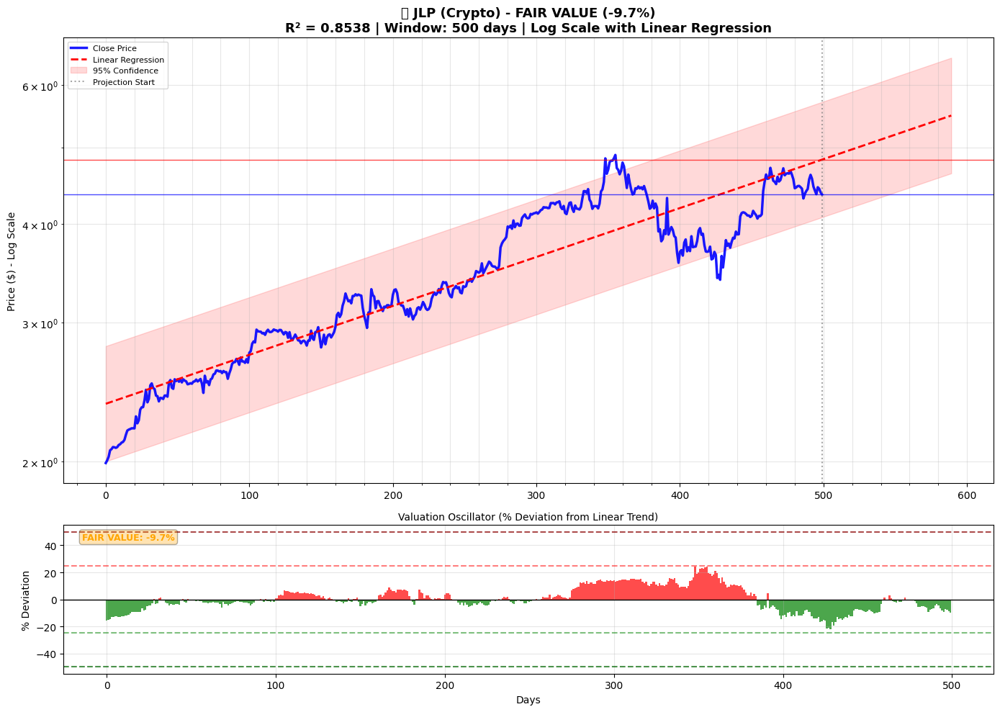


🟢 TOP 12 CRYPTO INSTRUMENTS - UNDERVALUED OPPORTUNITIES
Rank Symbol          Under%   R²         Growth%      Price           Upside%    Window  
------------------------------------------------------------------------------------------------------------------------
1    PENDLE-USD       69.0%  0.781882    456.4%   $3.69             222.5%  1000d
2    IMX-USD          63.8%  0.801302   -100.0%   $0.004143         176.3%  120 d
3    SOL-USD          51.2%  0.781825    203.3%   $145.40           104.9%  1000d
4    HYPE-USD         45.6%  0.831829    -97.1%   $0.000005          83.8%  1000d
5    XRP-USD          41.1%  0.724678    729.7%   $2.15              69.9%  365 d
6    VIRTUAL-USD      38.1%  0.722181  85919.4%   $1.66              61.6%  90  d
7    FARTCOIN-USD     37.0%  0.815053  31836.5%   $1.13              58.7%  120 d
8    TKX-USD          32.9%  0.740227    481.9%   $27.78             48.9%  365 d
9    BNB-USD          24.3%  0.767074     90.4%   $641.17            32.0%  

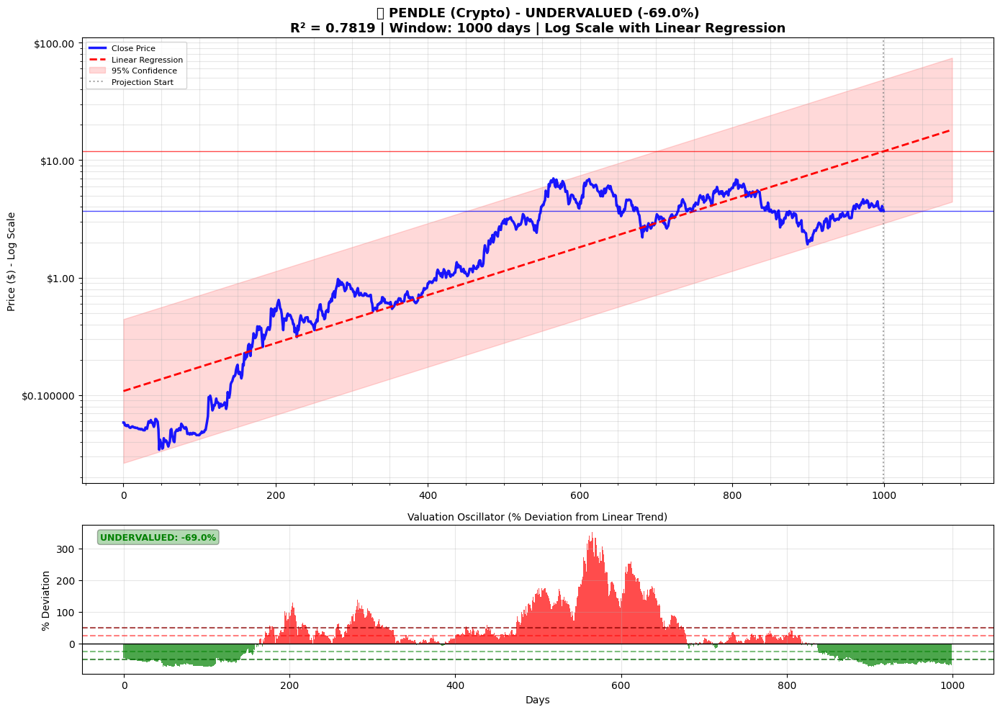


Chart 2: IMX-USD (Undervalued by 63.8%)
Error plotting IMX-USD: index 209 is out of bounds for axis 0 with size 180

Chart 3: SOL-USD (Undervalued by 51.2%)

📊 PRICE PROJECTIONS (Linear Regression - 1000 days):
   Current: $145.40
   +30d (1m): $326.34 ($131.13 - $812.11)
   +60d (2m): $357.50 ($143.63 - $889.82)
   +90d (3m): $391.63 ($157.31 - $974.97)
   90-day outlook: 📈 Bullish Trend (+169.3%)
   Confidence: 78.2% | Valuation: UNDERVALUED
------------------------------------------------------------


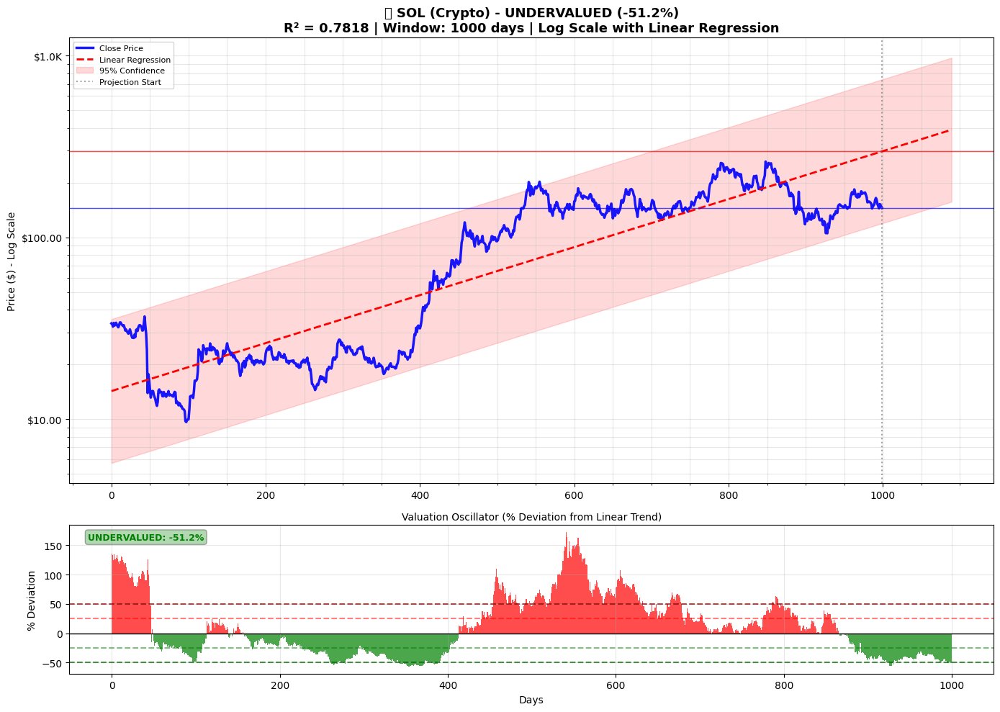


Chart 4: HYPE-USD (Undervalued by 45.6%)

📊 PRICE PROJECTIONS (Linear Regression - 1000 days):
   Current: $0.000005
   +30d (1m): $0.000007 ($0.000001 - $0.000082)
   +60d (2m): $0.000005 ($0.000000 - $0.000061)
   +90d (3m): $0.000004 ($0.000000 - $0.000046)
   90-day outlook: 📉 Bearish Trend (-23.4%)
   Confidence: 83.2% | Valuation: UNDERVALUED
------------------------------------------------------------


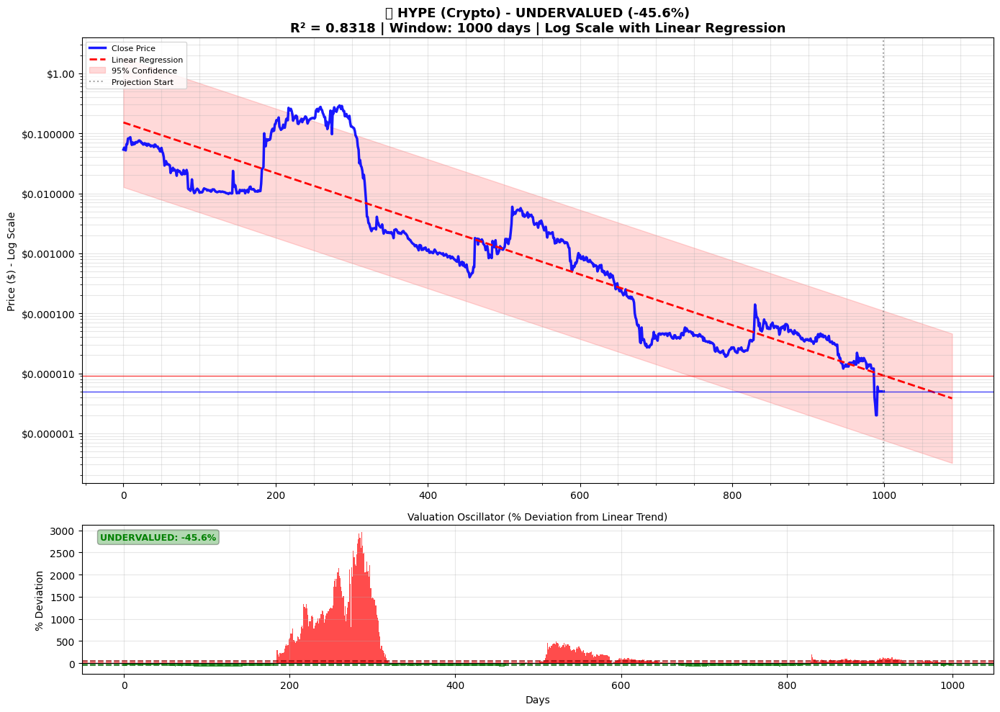


Chart 5: XRP-USD (Undervalued by 41.1%)

📊 PRICE PROJECTIONS (Linear Regression - 365 days):
   Current: $2.15
   +30d (1m): $4.34 ($2.06 - $9.14)
   +60d (2m): $5.16 ($2.45 - $10.90)
   +90d (3m): $6.14 ($2.91 - $12.98)
   90-day outlook: 📈 Bullish Trend (+186.3%)
   Confidence: 72.5% | Valuation: UNDERVALUED
------------------------------------------------------------


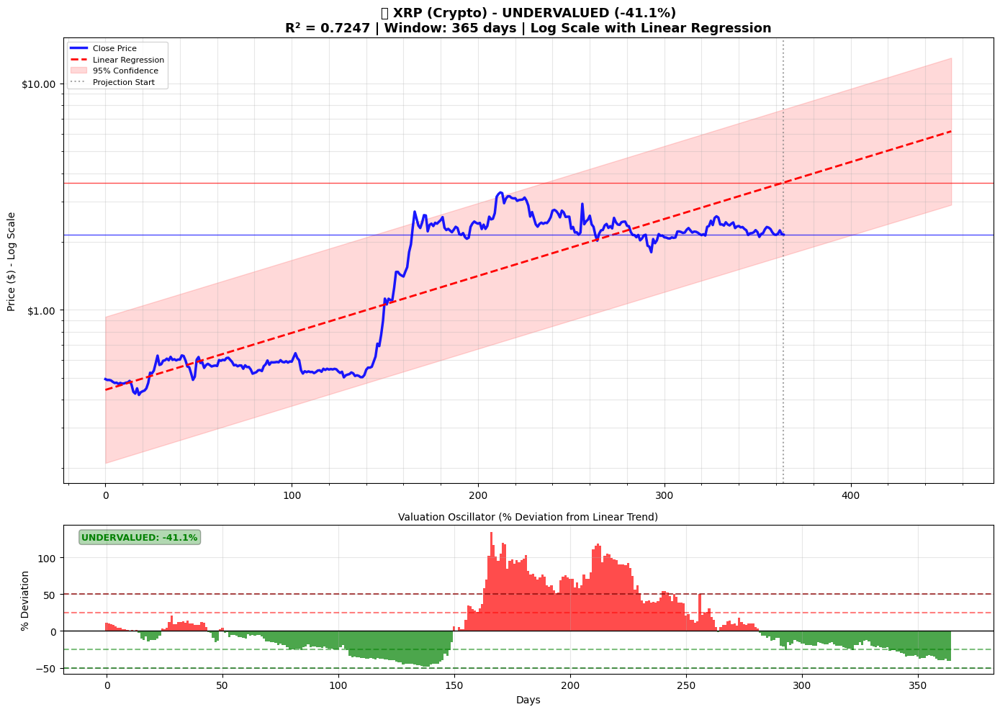


Chart 6: VIRTUAL-USD (Undervalued by 38.1%)
Error plotting VIRTUAL-USD: index 179 is out of bounds for axis 0 with size 150

Chart 7: FARTCOIN-USD (Undervalued by 37.0%)
Error plotting FARTCOIN-USD: index 209 is out of bounds for axis 0 with size 180

Chart 8: TKX-USD (Undervalued by 32.9%)

📊 PRICE PROJECTIONS (Linear Regression - 365 days):
   Current: $27.78
   +30d (1m): $47.82 ($26.34 - $86.81)
   +60d (2m): $55.27 ($30.41 - $100.43)
   +90d (3m): $63.87 ($35.11 - $116.21)
   90-day outlook: 📈 Bullish Trend (+129.9%)
   Confidence: 74.0% | Valuation: UNDERVALUED
------------------------------------------------------------


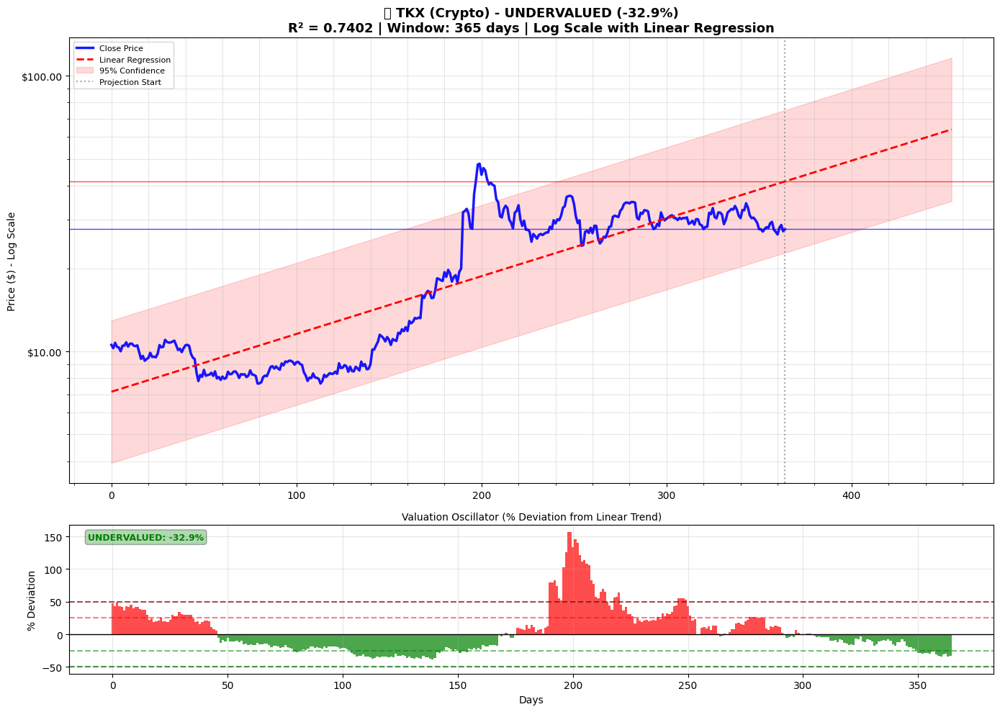


Chart 9: BNB-USD (Undervalued by 24.3%)

📊 PRICE PROJECTIONS (Linear Regression - 750 days):
   Current: $641.17
   +30d (1m): $892.56 ($589.74 - $1.4K)
   +60d (2m): $941.06 ($621.70 - $1.4K)
   +90d (3m): $992.21 ($655.38 - $1.5K)
   90-day outlook: 📈 Bullish Trend (+54.8%)
   Confidence: 76.7% | Valuation: UNDERVALUED
------------------------------------------------------------


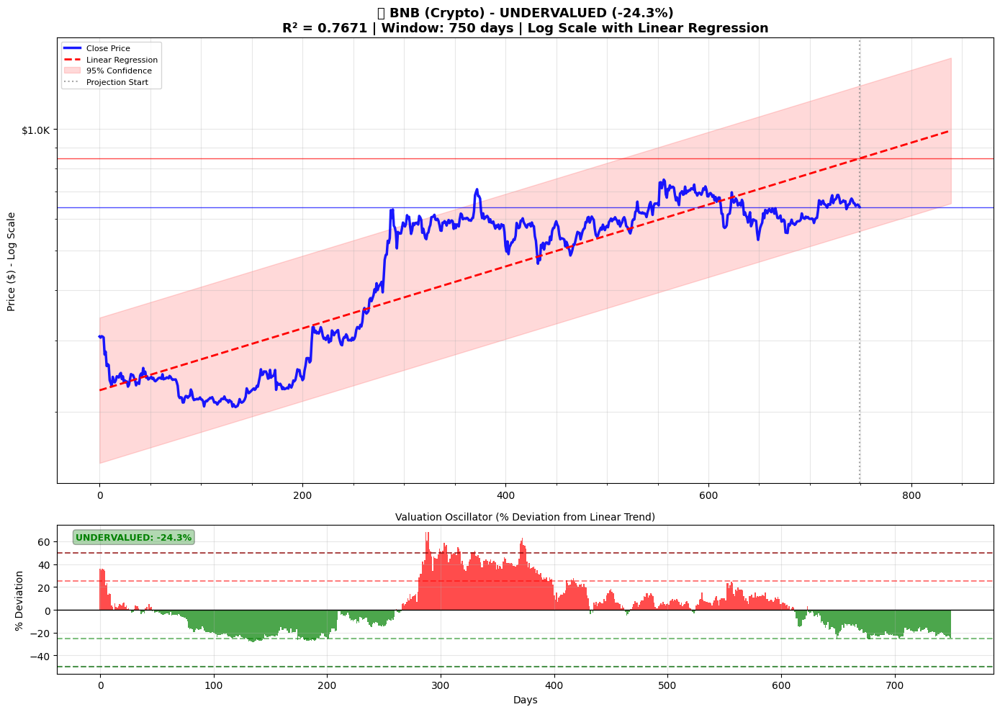


Chart 10: QNT-USD (Undervalued by 17.5%)
Error plotting QNT-USD: index 149 is out of bounds for axis 0 with size 120

Chart 11: BTC-USD (Undervalued by 12.1%)

📊 PRICE PROJECTIONS (Linear Regression - 1000 days):
   Current: $104.2K
   +30d (1m): $125.6K ($94.1K - $167.7K)
   +60d (2m): $133.2K ($99.8K - $177.7K)
   +90d (3m): $141.2K ($105.8K - $188.4K)
   90-day outlook: 📈 Bullish Trend (+35.5%)
   Confidence: 93.6% | Valuation: UNDERVALUED
------------------------------------------------------------


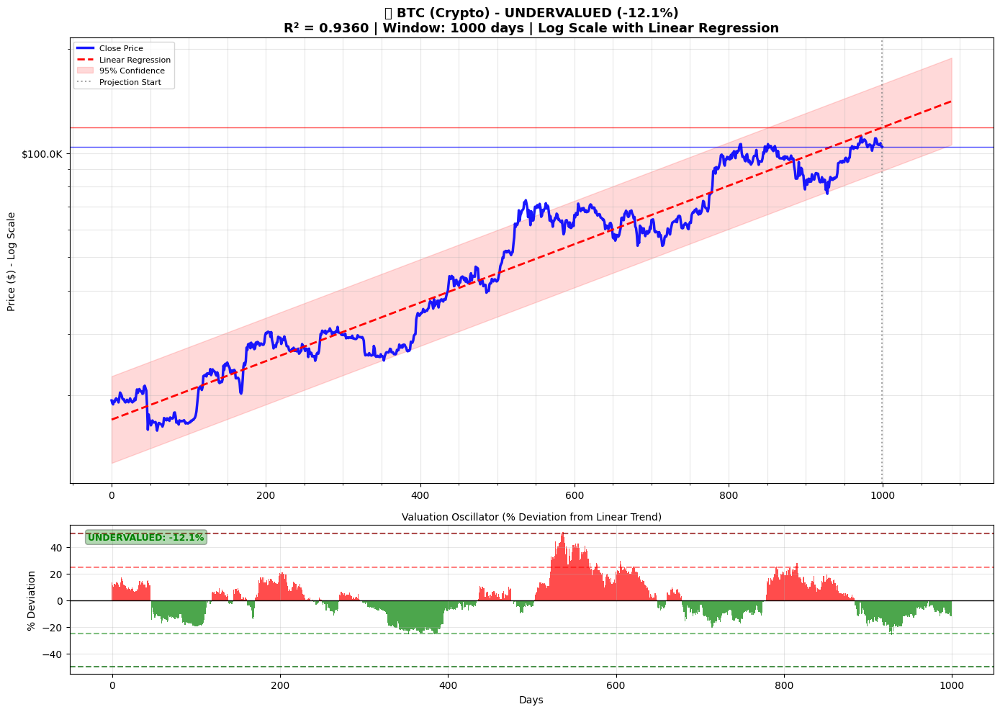


Chart 12: FTN-USD (Undervalued by 11.2%)

📊 PRICE PROJECTIONS (Linear Regression - 750 days):
   Current: $4.42
   +30d (1m): $5.34 ($4.82 - $5.91)
   +60d (2m): $5.73 ($5.17 - $6.34)
   +90d (3m): $6.15 ($5.55 - $6.81)
   90-day outlook: 📈 Bullish Trend (+39.1%)
   Confidence: 99.0% | Valuation: UNDERVALUED
------------------------------------------------------------


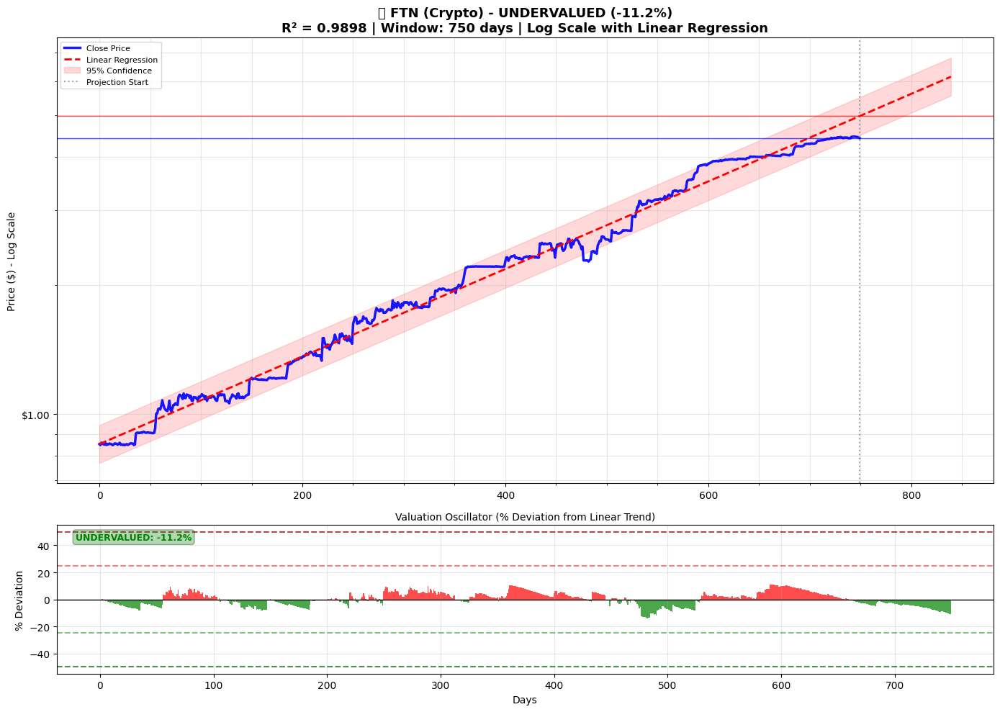


🔴 TOP 13 CRYPTO INSTRUMENTS - OVERVALUED WARNINGS
Rank Symbol          Over%    R²         Growth%      Price           Risk%      Window  
------------------------------------------------------------------------------------------------------------------------
1    WAL-USD         224.8%  0.927292    -95.6%   $0.000088          69.2%  1000d
2    TRUMP-USD        79.0%  0.818734    -94.9%   $0.000587          44.1%  365 d
3    WBT-USD          43.9%  0.930791    196.1%   $48.73             30.5%  750 d
4    APT-USD          39.5%  0.944235    -84.3%   $0.000131          28.3%  500 d
5    GRT-USD          32.4%  0.767153    -89.7%   $0.454301          24.5%  180 d
6    PEPE-USD         21.9%  0.780412    -98.3%   $0.000006          17.9%  90  d
7    STX-USD          21.8%  0.842782    -76.8%   $0.002834          17.9%  365 d
8    ICP-USD          18.7%  0.740342    -81.9%   $5.06              15.8%  180 d
9    THETA-USD        17.5%  0.785463    -93.1%   $0.676605          14.9%  180 d


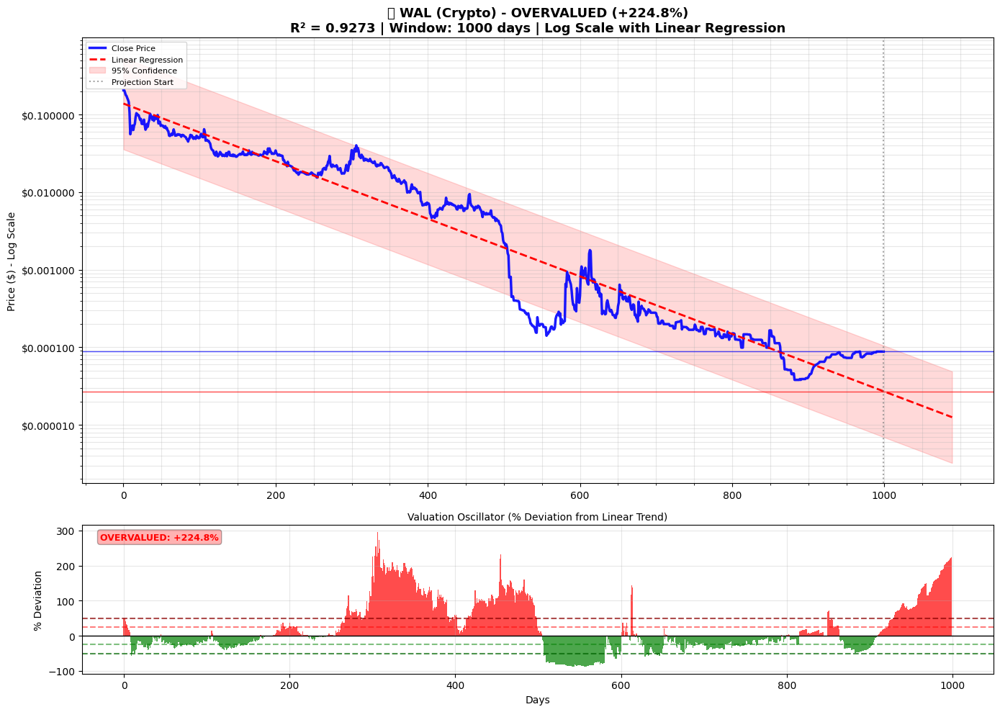


Chart 2: TRUMP-USD (Overvalued by 79.0%)

📊 PRICE PROJECTIONS (Linear Regression - 365 days):
   Current: $0.000587
   +30d (1m): $0.000256 ($0.000115 - $0.000572)
   +60d (2m): $0.000201 ($0.000090 - $0.000448)
   +90d (3m): $0.000157 ($0.000070 - $0.000351)
   90-day outlook: 📉 Bearish Trend (-73.2%)
   Confidence: 81.9% | Valuation: OVERVALUED
------------------------------------------------------------


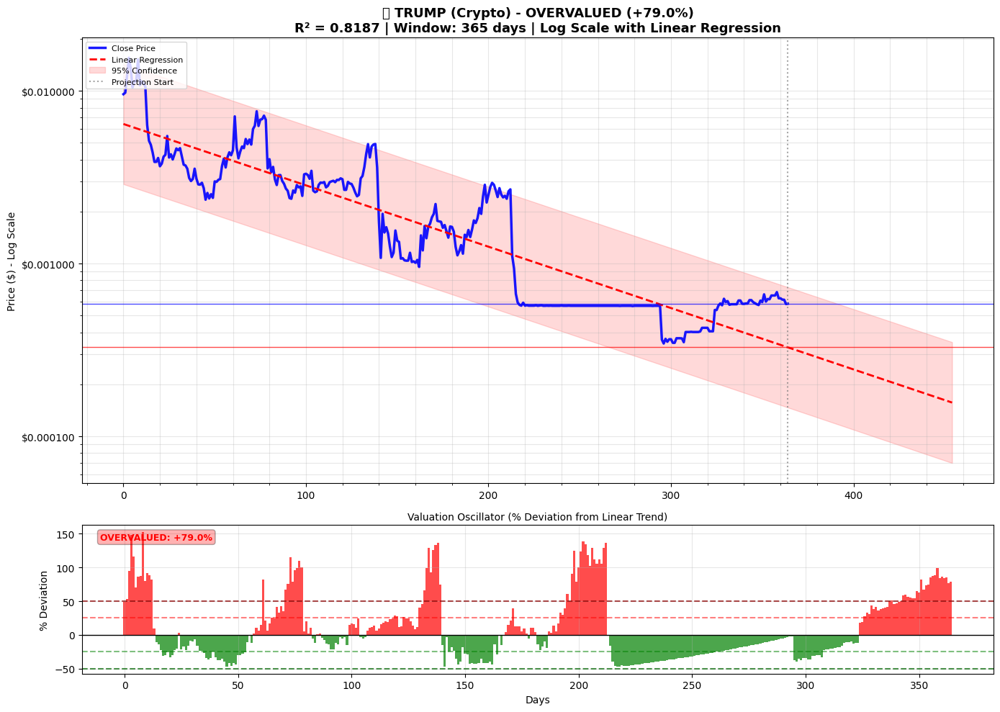


Chart 3: WBT-USD (Overvalued by 43.9%)

📊 PRICE PROJECTIONS (Linear Regression - 750 days):
   Current: $48.73
   +30d (1m): $37.02 ($26.20 - $52.31)
   +60d (2m): $40.48 ($28.64 - $57.20)
   +90d (3m): $44.25 ($31.31 - $62.54)
   90-day outlook: 📉 Bearish Trend (-9.2%)
   Confidence: 93.1% | Valuation: OVERVALUED
------------------------------------------------------------


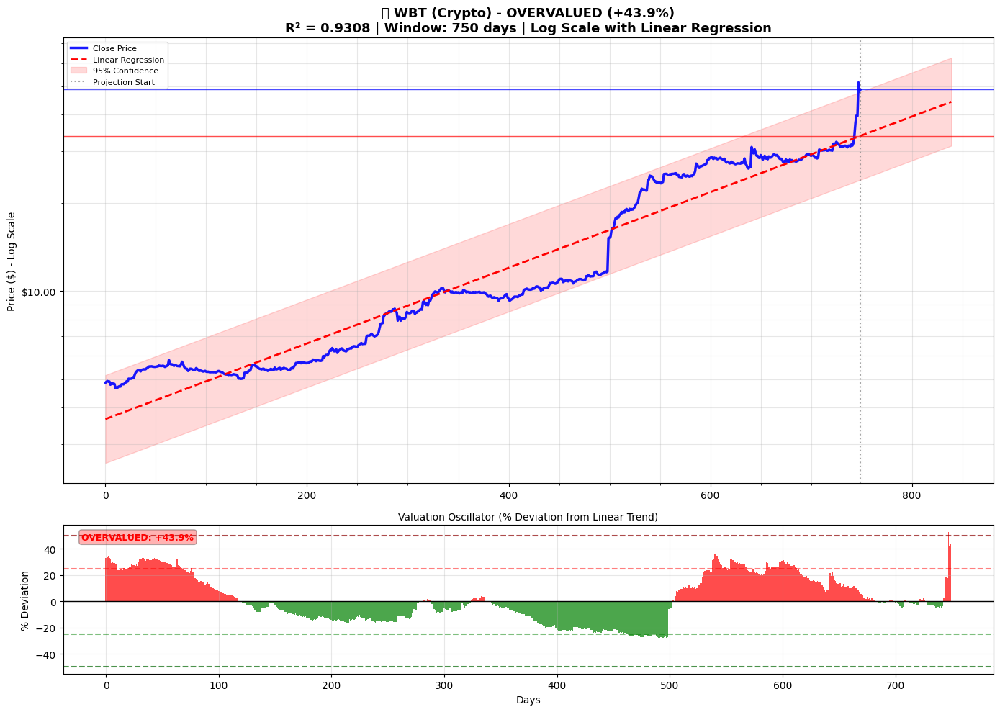


Chart 4: APT-USD (Overvalued by 39.5%)

📊 PRICE PROJECTIONS (Linear Regression - 500 days):
   Current: $0.000131
   +30d (1m): $0.000081 ($0.000057 - $0.000115)
   +60d (2m): $0.000069 ($0.000049 - $0.000099)
   +90d (3m): $0.000060 ($0.000042 - $0.000085)
   90-day outlook: 📉 Bearish Trend (-54.6%)
   Confidence: 94.4% | Valuation: OVERVALUED
------------------------------------------------------------


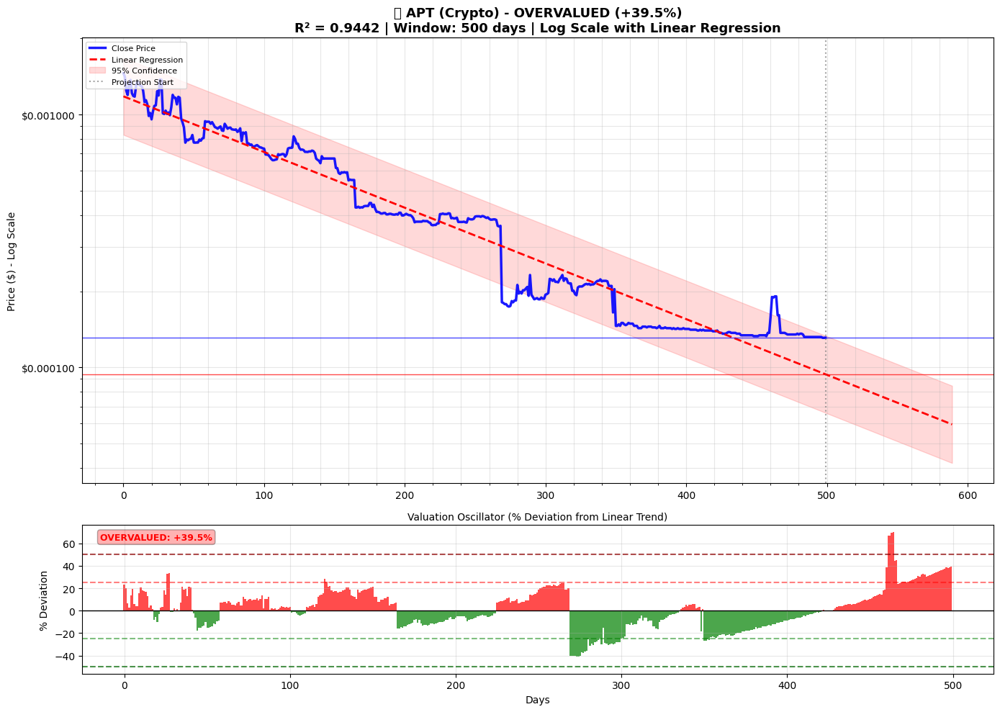


Chart 5: GRT-USD (Overvalued by 32.4%)

📊 PRICE PROJECTIONS (Linear Regression - 180 days):
   Current: $0.454301
   +30d (1m): $0.284660 ($0.199057 - $0.407076)
   +60d (2m): $0.236174 ($0.164680 - $0.338706)
   +90d (3m): $0.195947 ($0.136158 - $0.281989)
   90-day outlook: 📉 Bearish Trend (-56.9%)
   Confidence: 76.7% | Valuation: OVERVALUED
------------------------------------------------------------


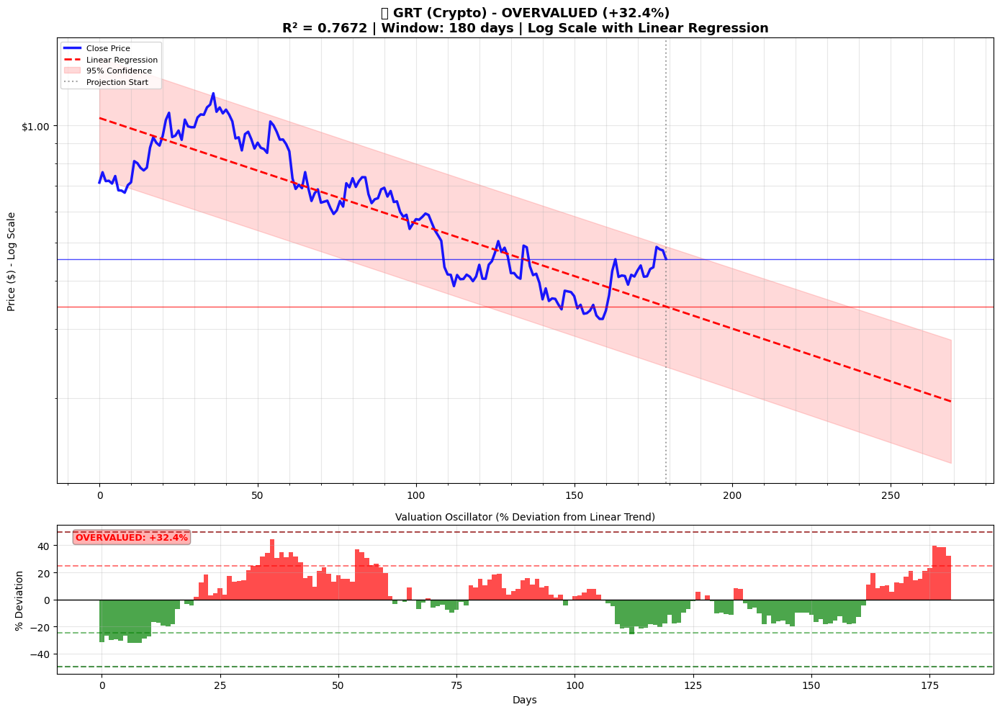


Chart 6: PEPE-USD (Overvalued by 21.9%)
Error plotting PEPE-USD: index 179 is out of bounds for axis 0 with size 150

Chart 7: STX-USD (Overvalued by 21.8%)

📊 PRICE PROJECTIONS (Linear Regression - 365 days):
   Current: $0.002834
   +30d (1m): $0.002063 ($0.001439 - $0.002958)
   +60d (2m): $0.001830 ($0.001276 - $0.002625)
   +90d (3m): $0.001623 ($0.001131 - $0.002330)
   90-day outlook: 📉 Bearish Trend (-42.7%)
   Confidence: 84.3% | Valuation: OVERVALUED
------------------------------------------------------------


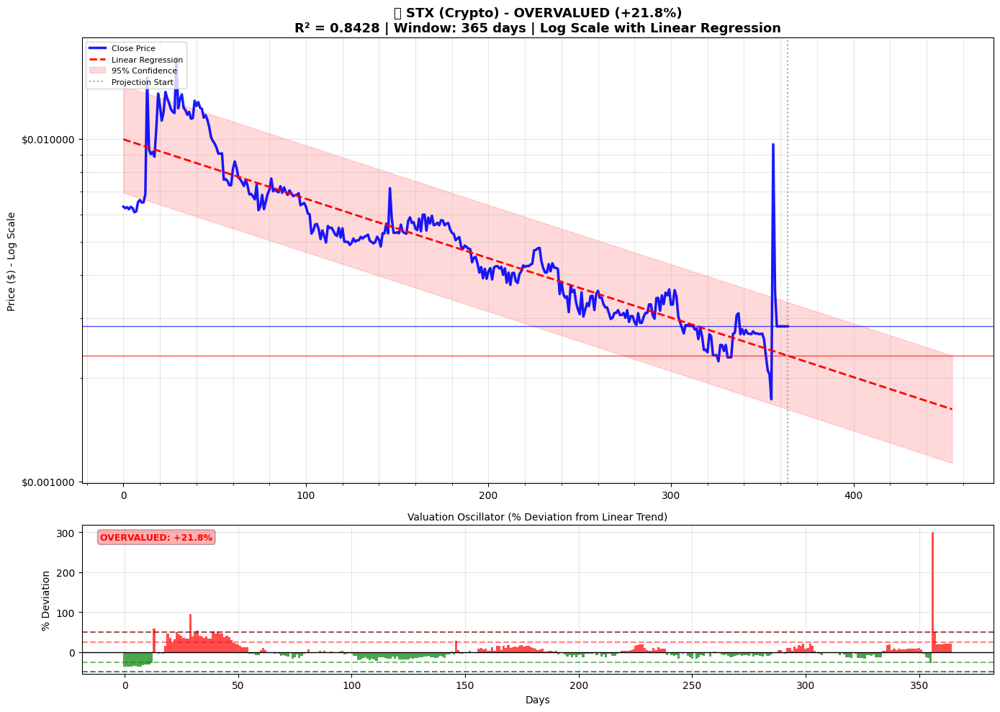


Chart 8: ICP-USD (Overvalued by 18.7%)

📊 PRICE PROJECTIONS (Linear Regression - 180 days):
   Current: $5.06
   +30d (1m): $3.70 ($2.78 - $4.94)
   +60d (2m): $3.22 ($2.41 - $4.31)
   +90d (3m): $2.80 ($2.09 - $3.75)
   90-day outlook: 📉 Bearish Trend (-44.7%)
   Confidence: 74.0% | Valuation: OVERVALUED
------------------------------------------------------------


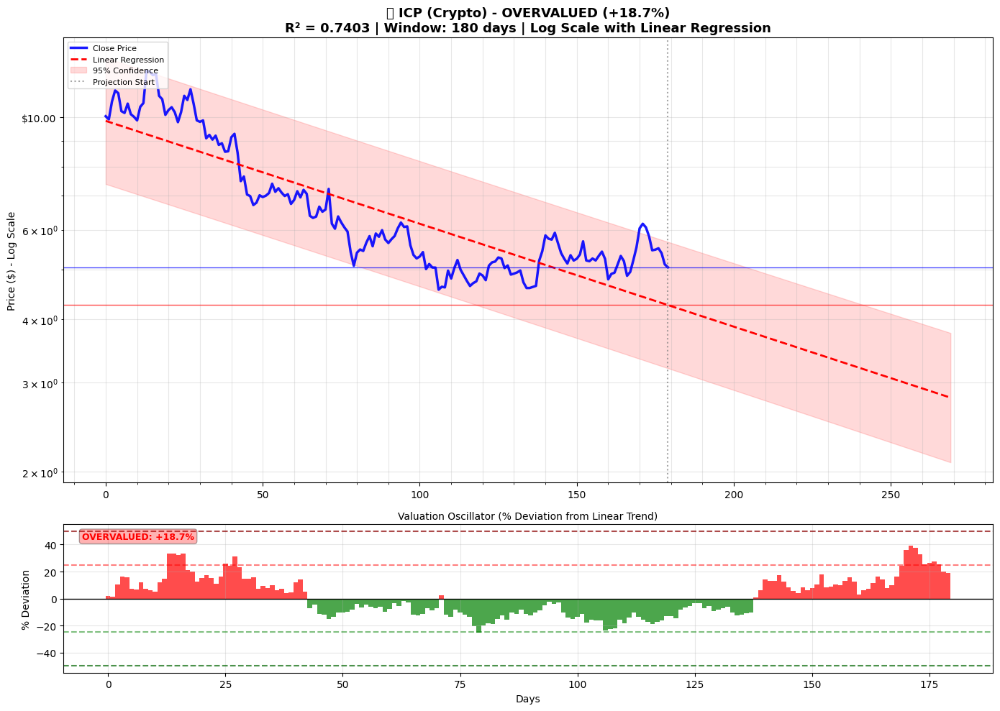


Chart 9: THETA-USD (Overvalued by 17.5%)

📊 PRICE PROJECTIONS (Linear Regression - 180 days):
   Current: $0.676605
   +30d (1m): $0.461974 ($0.309554 - $0.689444)
   +60d (2m): $0.370623 ($0.247549 - $0.554886)
   +90d (3m): $0.297336 ($0.197830 - $0.446893)
   90-day outlook: 📉 Bearish Trend (-56.1%)
   Confidence: 78.5% | Valuation: OVERVALUED
------------------------------------------------------------


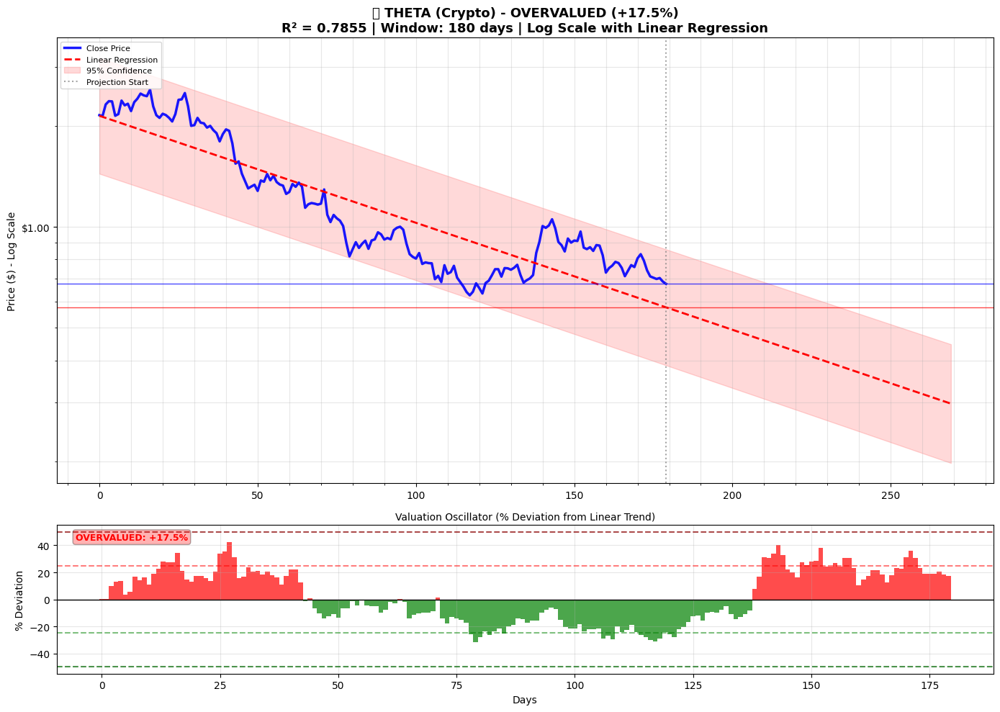


Chart 10: XMR-USD (Overvalued by 16.5%)

📊 PRICE PROJECTIONS (Linear Regression - 500 days):
   Current: $320.66
   +30d (1m): $289.78 ($226.64 - $370.51)
   +60d (2m): $305.15 ($238.61 - $390.25)
   +90d (3m): $321.35 ($251.22 - $411.05)
   90-day outlook: ➡️ Sideways Trend (+0.2%)
   Confidence: 80.0% | Valuation: OVERVALUED
------------------------------------------------------------


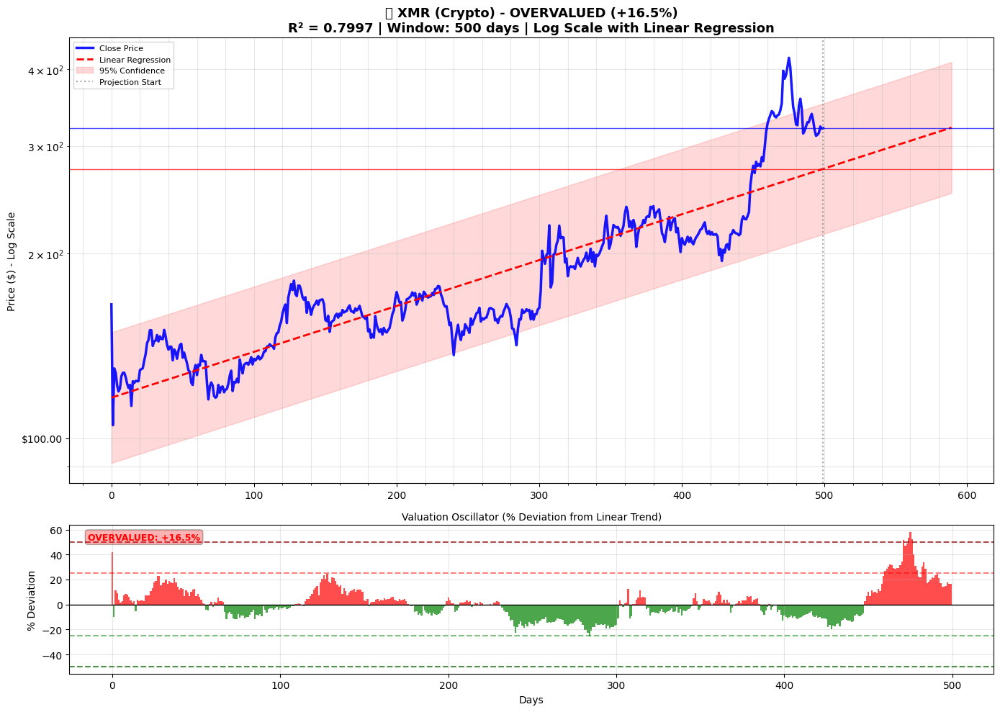


Chart 11: XTZ-USD (Overvalued by 14.7%)

📊 PRICE PROJECTIONS (Linear Regression - 180 days):
   Current: $0.533964
   +30d (1m): $0.393547 ($0.296461 - $0.522425)
   +60d (2m): $0.332650 ($0.250021 - $0.442587)
   +90d (3m): $0.281177 ($0.210754 - $0.375131)
   90-day outlook: 📉 Bearish Trend (-47.3%)
   Confidence: 81.0% | Valuation: OVERVALUED
------------------------------------------------------------


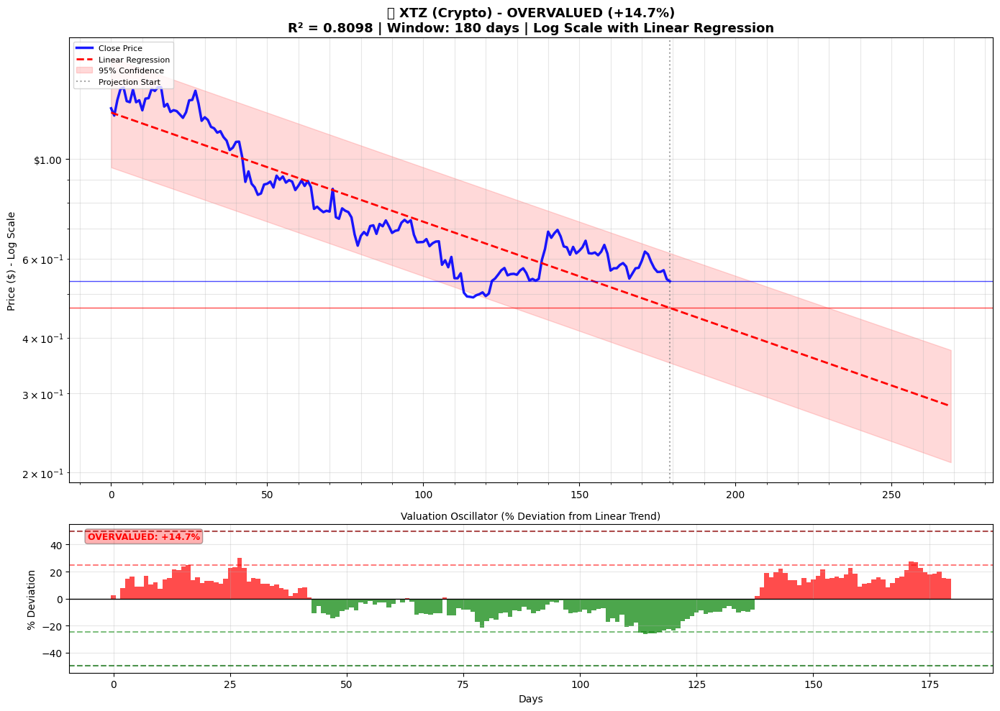


Chart 12: ENA-USD (Overvalued by 13.7%)

📊 PRICE PROJECTIONS (Linear Regression - 180 days):
   Current: $0.275694
   +30d (1m): $0.196660 ($0.124136 - $0.311556)
   +60d (2m): $0.159434 ($0.100269 - $0.253511)
   +90d (3m): $0.129255 ($0.080927 - $0.206442)
   90-day outlook: 📉 Bearish Trend (-53.1%)
   Confidence: 71.6% | Valuation: OVERVALUED
------------------------------------------------------------


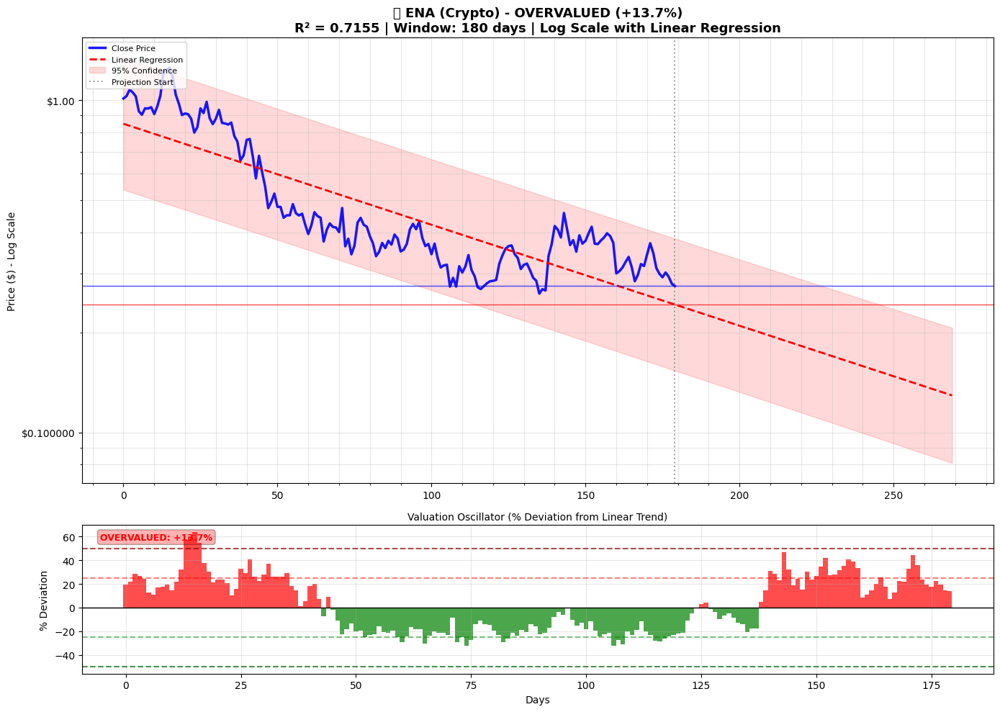


Chart 13: WLD-USD (Overvalued by 11.7%)

📊 PRICE PROJECTIONS (Linear Regression - 500 days):
   Current: $0.909377
   +30d (1m): $0.721371 ($0.349640 - $1.49)
   +60d (2m): $0.639383 ($0.309713 - $1.32)
   +90d (3m): $0.566713 ($0.274328 - $1.17)
   90-day outlook: 📉 Bearish Trend (-37.7%)
   Confidence: 71.5% | Valuation: OVERVALUED
------------------------------------------------------------


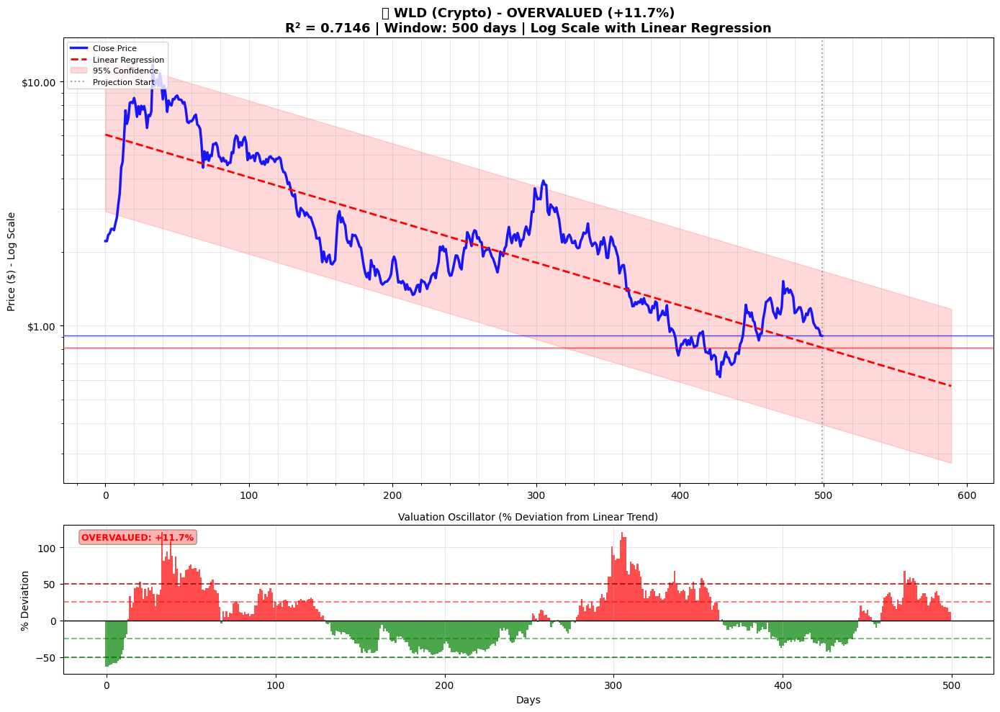


CRYPTO STATISTICS:
------------------------------------------------------------
Total crypto instruments analyzed: 91
Average R-squared: 0.7382
Best R-squared: 0.989828
Average annual growth: 838857.3%

Valuation breakdown:
  🟡 FAIR_VALUE: 35 (38.5%) - Hold/Monitor
  🔴 OVERVALUED: 13 (14.3%) - Sell Warnings
  🟢 UNDERVALUED: 12 (13.2%) - Buy Opportunities

Optimal window distribution:
  30 days: 29 instruments (31.9%)
  60 days: 5 instruments (5.5%)
  90 days: 8 instruments (8.8%)
  120 days: 4 instruments (4.4%)
  180 days: 16 instruments (17.6%)

📊 CRYPTO TRADING SUMMARY:
  🟢 High-quality undervalued opportunities: 12
  🔴 High-quality overvalued warnings: 13
  📈 Top trend performers displayed: 15
  💡 Consider buying undervalued cryptos with strong trends
  ⚠️  Consider reducing overvalued crypto positions

🔥 TOP 15 FUTURES INSTRUMENTS - BEST TREND ANALYSIS
Rank Symbol          R²         Window   Growth%      Price           Valuation    Deviation%
-----------------------------------

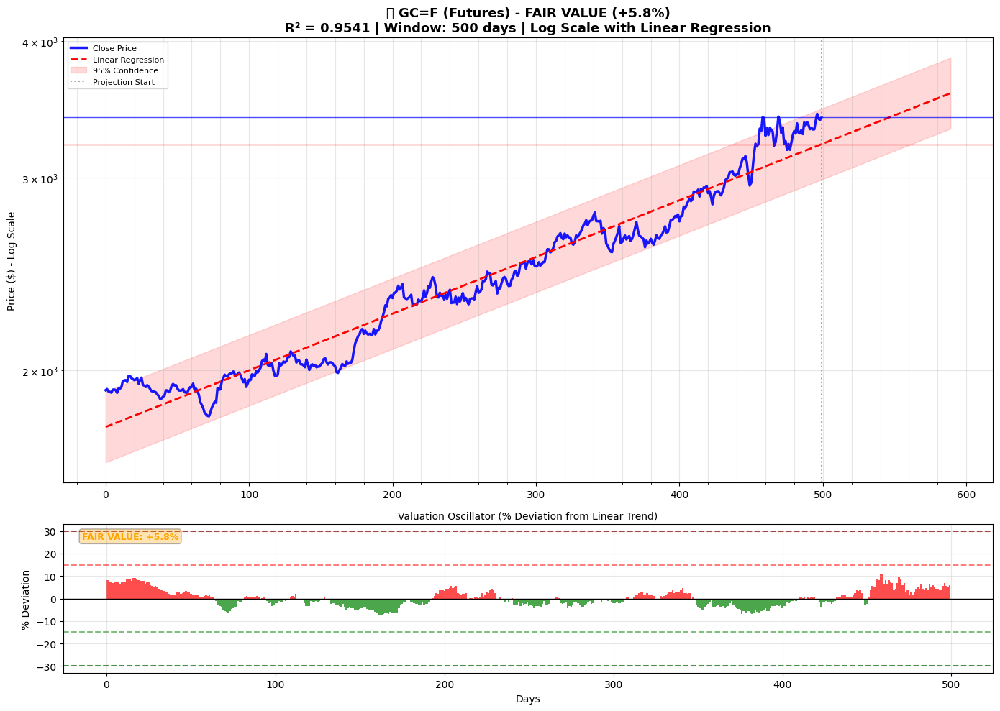


Chart 2: KC=F (R² = 0.9319)

📊 PRICE PROJECTIONS (Linear Regression - 500 days):
   Current: $319.45
   +30d (1m): $426.63 ($362.68 - $501.85)
   +60d (2m): $454.48 ($386.31 - $534.69)
   +90d (3m): $484.15 ($411.47 - $569.68)
   90-day outlook: 📈 Bullish Trend (+51.6%)
   Confidence: 93.2% | Valuation: UNDERVALUED
------------------------------------------------------------


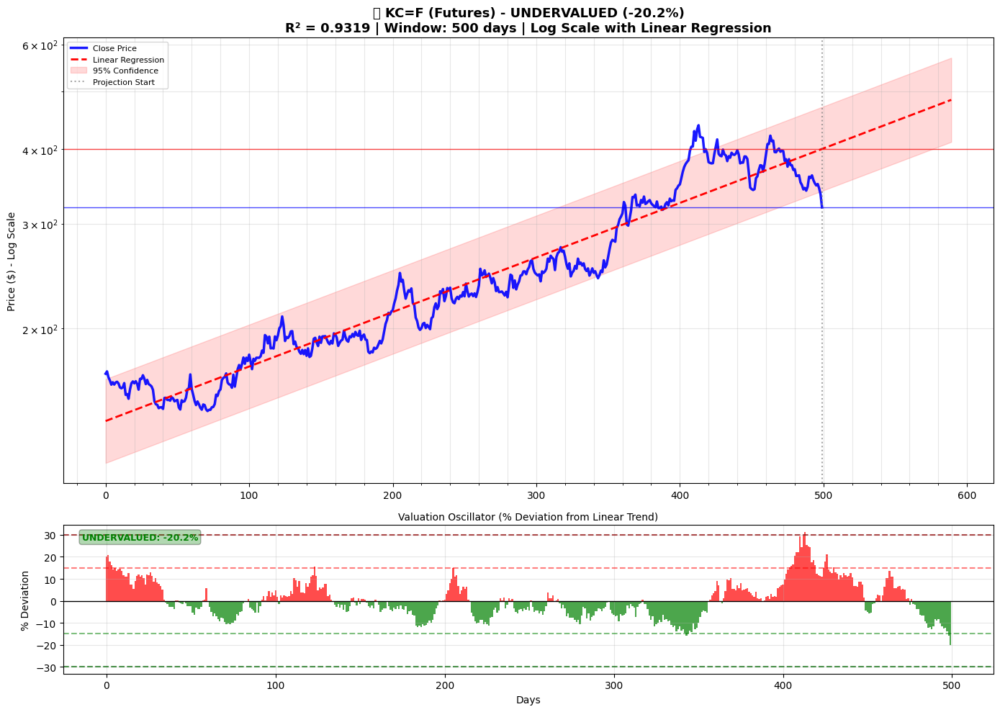


Chart 3: ES=F (R² = 0.9107)

📊 PRICE PROJECTIONS (Linear Regression - 750 days):
   Current: $6.0K
   +30d (1m): $6.4K ($5.8K - $7.0K)
   +60d (2m): $6.5K ($5.9K - $7.2K)
   +90d (3m): $6.6K ($6.1K - $7.3K)
   90-day outlook: 📈 Bullish Trend (+10.9%)
   Confidence: 91.1% | Valuation: FAIR VALUE
------------------------------------------------------------


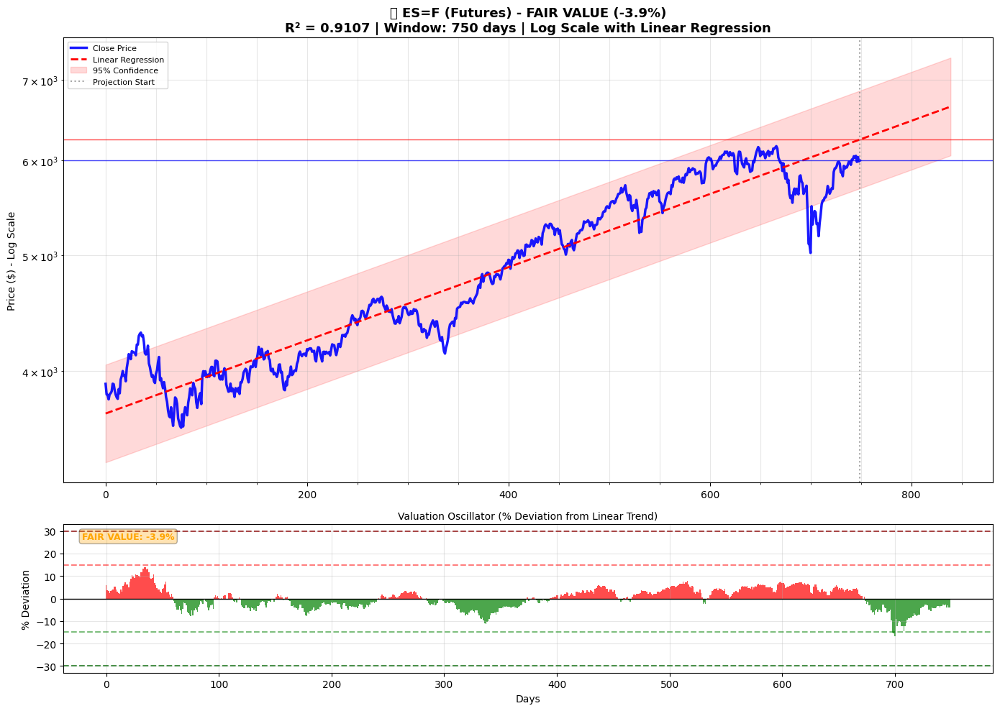


Chart 4: DX=F (R² = 0.9106)
Error plotting DX=F: index 209 is out of bounds for axis 0 with size 180

Chart 5: NQ=F (R² = 0.9024)

📊 PRICE PROJECTIONS (Linear Regression - 750 days):
   Current: $21.7K
   +30d (1m): $23.8K ($20.8K - $27.2K)
   +60d (2m): $24.5K ($21.4K - $28.0K)
   +90d (3m): $25.2K ($22.0K - $28.8K)
   90-day outlook: 📈 Bullish Trend (+15.9%)
   Confidence: 90.2% | Valuation: FAIR VALUE
------------------------------------------------------------


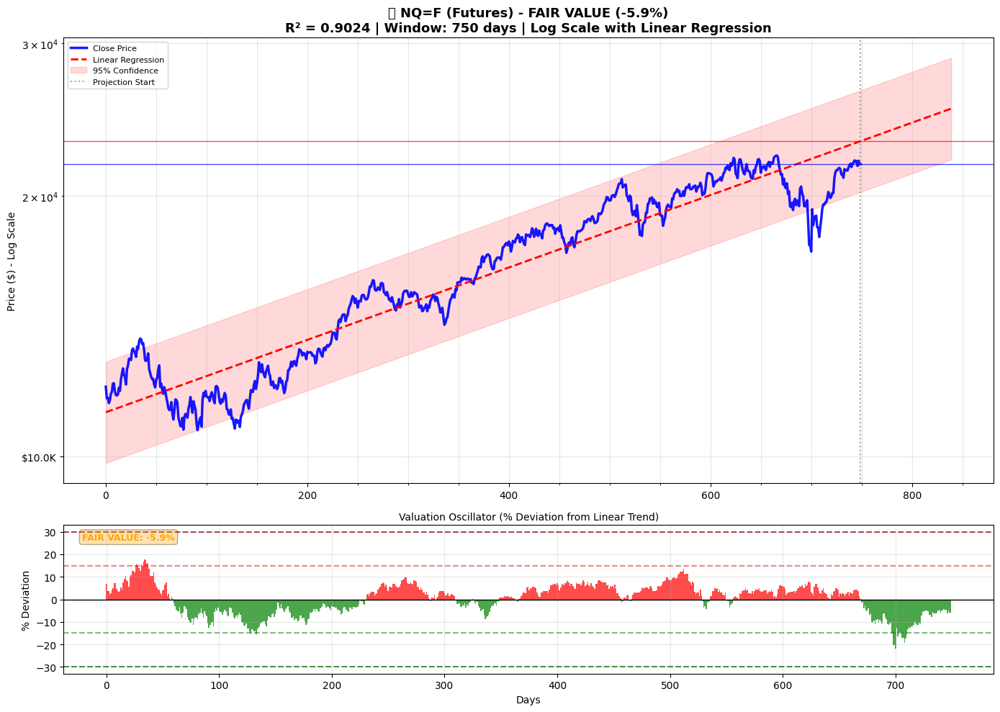


Chart 6: PL=F (R² = 0.8945)

📊 PRICE PROJECTIONS (Linear Regression - 30 days):
   Current: $1.3K
   +30d (1m): $1.7K ($1.6K - $1.9K)
   +60d (2m): $2.3K ($2.1K - $2.6K)
   Confidence: 89.4% | Valuation: FAIR VALUE
------------------------------------------------------------


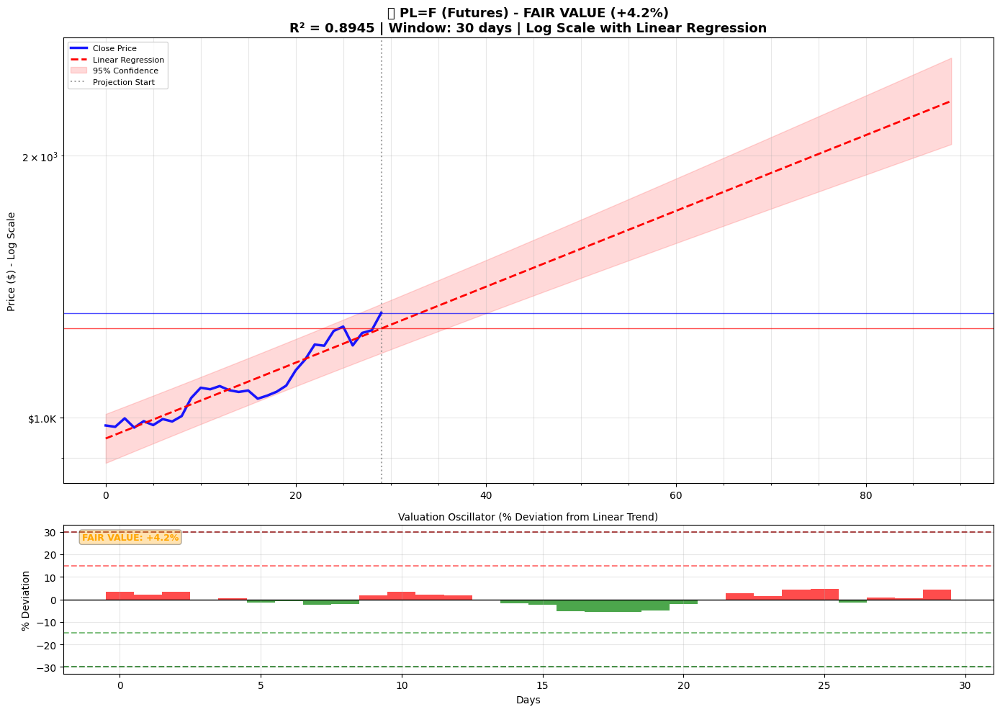


Chart 7: CC=F (R² = 0.8842)

📊 PRICE PROJECTIONS (Linear Regression - 750 days):
   Current: $8.8K
   +30d (1m): $13.4K ($9.1K - $19.6K)
   +60d (2m): $14.4K ($9.8K - $21.1K)
   +90d (3m): $15.5K ($10.6K - $22.8K)
   90-day outlook: 📈 Bullish Trend (+77.5%)
   Confidence: 88.4% | Valuation: UNDERVALUED
------------------------------------------------------------


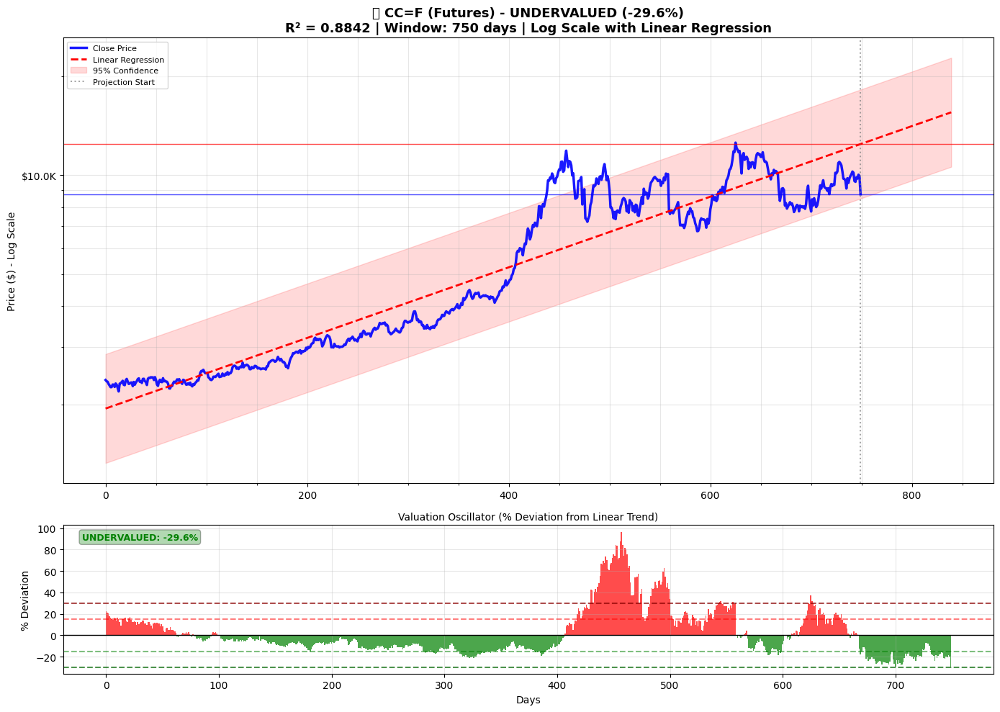


Chart 8: LE=F (R² = 0.8811)

📊 PRICE PROJECTIONS (Linear Regression - 180 days):
   Current: $211.07
   +30d (1m): $226.13 ($217.37 - $235.24)
   +60d (2m): $233.23 ($224.12 - $242.70)
   +90d (3m): $240.55 ($231.07 - $250.42)
   90-day outlook: 📈 Bullish Trend (+14.0%)
   Confidence: 88.1% | Valuation: FAIR VALUE
------------------------------------------------------------


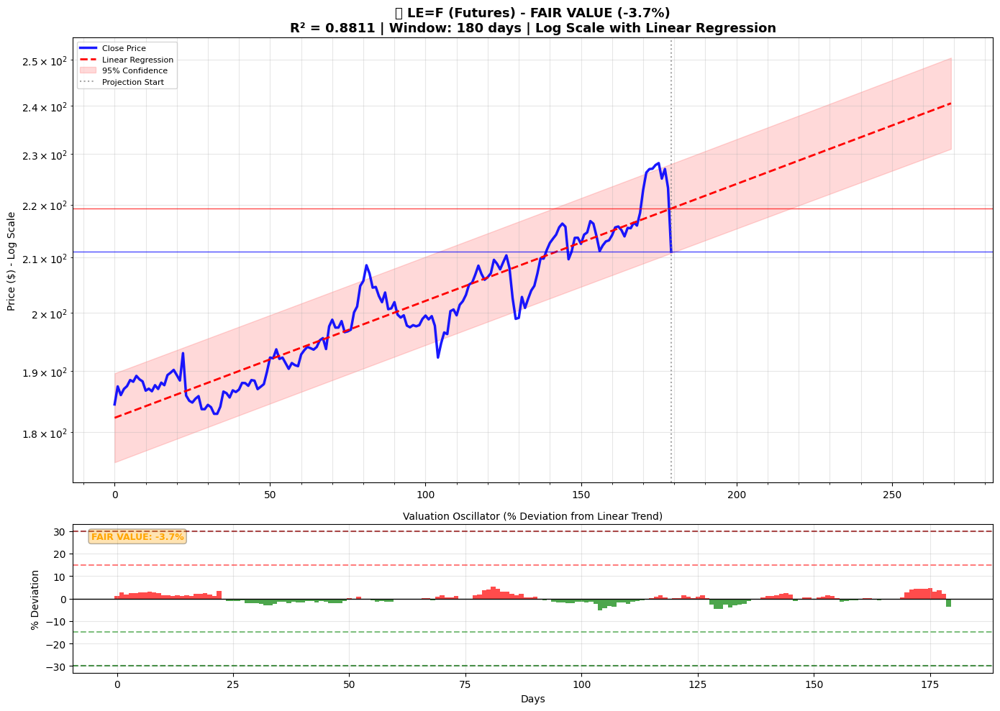


Chart 9: YM=F (R² = 0.8798)

📊 PRICE PROJECTIONS (Linear Regression - 750 days):
   Current: $42.3K
   +30d (1m): $45.2K ($41.8K - $48.8K)
   +60d (2m): $45.8K ($42.4K - $49.5K)
   +90d (3m): $46.5K ($43.0K - $50.3K)
   90-day outlook: 📈 Bullish Trend (+9.9%)
   Confidence: 88.0% | Valuation: FAIR VALUE
------------------------------------------------------------


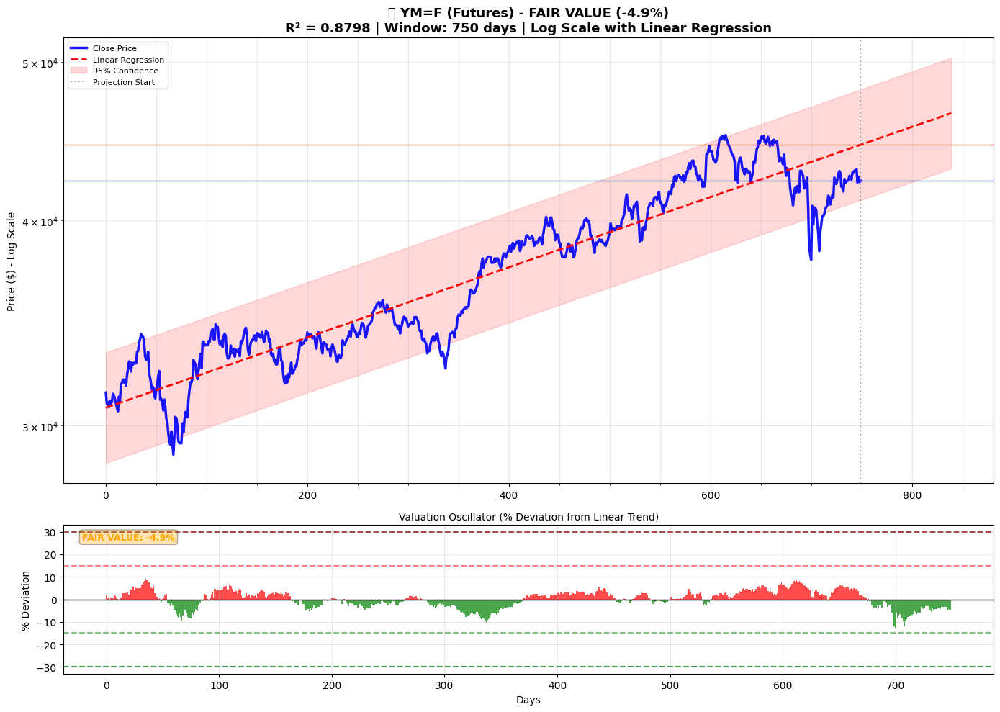


Chart 10: HE=F (R² = 0.8699)
Error plotting HE=F: index 149 is out of bounds for axis 0 with size 120

Chart 11: ZS=F (R² = 0.8690)

📊 PRICE PROJECTIONS (Linear Regression - 750 days):
   Current: $1.1K
   +30d (1m): $940.97 ($838.60 - $1.1K)
   +60d (2m): $921.53 ($821.24 - $1.0K)
   +90d (3m): $902.49 ($804.24 - $1.0K)
   90-day outlook: 📉 Bearish Trend (-15.5%)
   Confidence: 86.9% | Valuation: OVERVALUED
------------------------------------------------------------


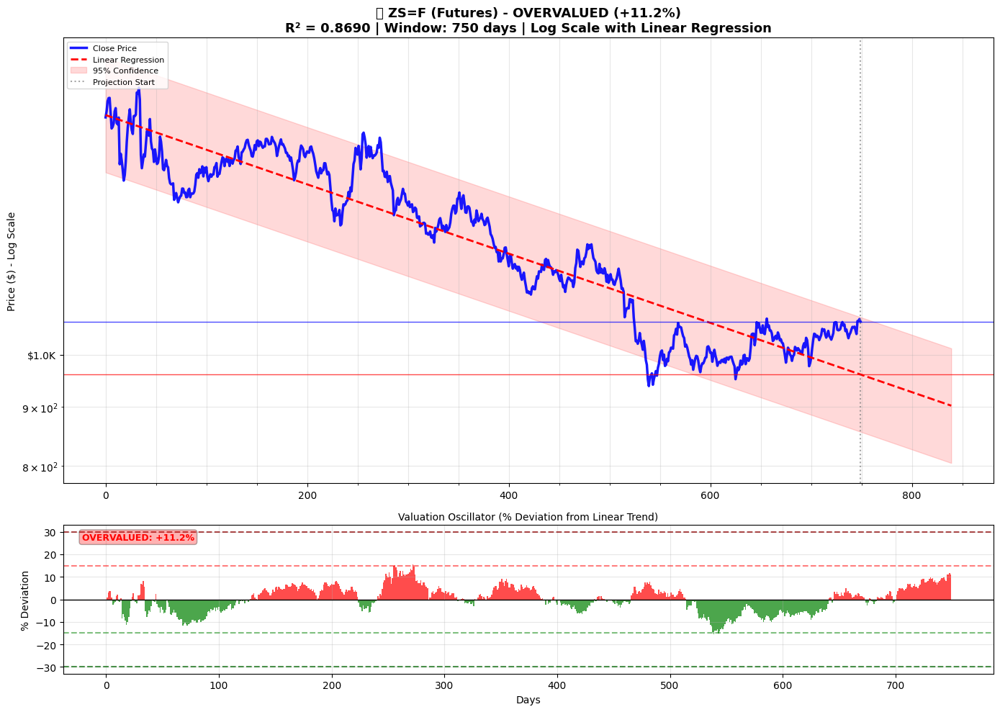


Chart 12: SI=F (R² = 0.8622)

📊 PRICE PROJECTIONS (Linear Regression - 30 days):
   Current: $36.90
   +30d (1m): $43.20 ($41.01 - $45.51)
   +60d (2m): $50.65 ($47.21 - $54.34)
   Confidence: 86.2% | Valuation: FAIR VALUE
------------------------------------------------------------


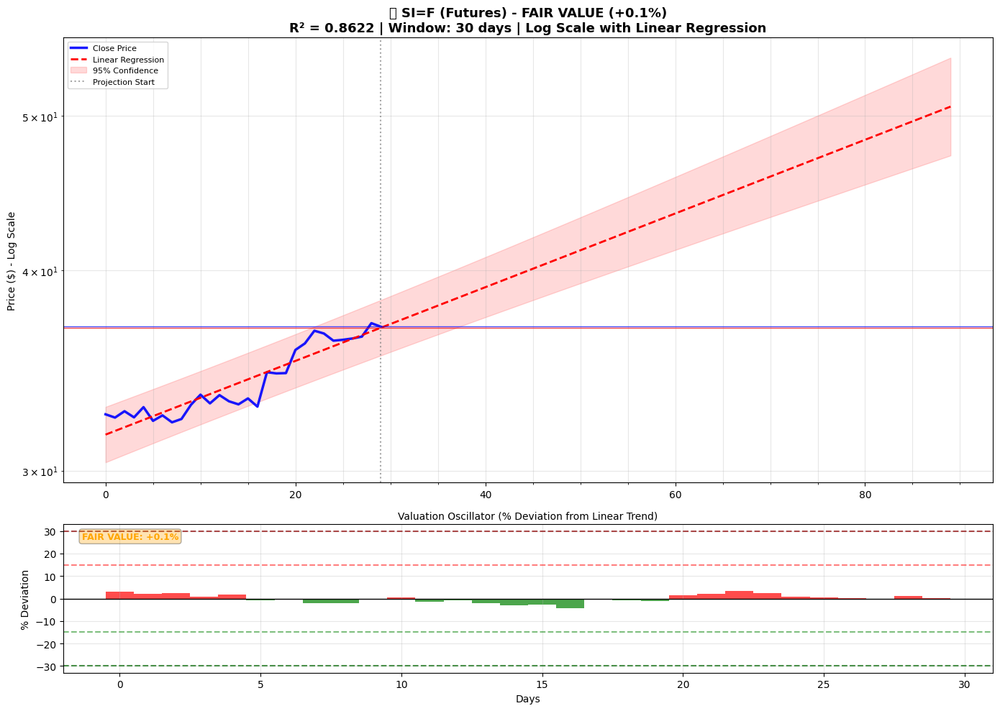


Chart 13: SB=F (R² = 0.8469)
Error plotting SB=F: index 149 is out of bounds for axis 0 with size 120

Chart 14: PA=F (R² = 0.7902)

📊 PRICE PROJECTIONS (Linear Regression - 750 days):
   Current: $1.1K
   +30d (1m): $764.62 ($593.38 - $985.28)
   +60d (2m): $738.60 ($573.13 - $951.84)
   +90d (3m): $713.46 ($553.57 - $919.54)
   90-day outlook: 📉 Bearish Trend (-32.7%)
   Confidence: 79.0% | Valuation: OVERVALUED
------------------------------------------------------------


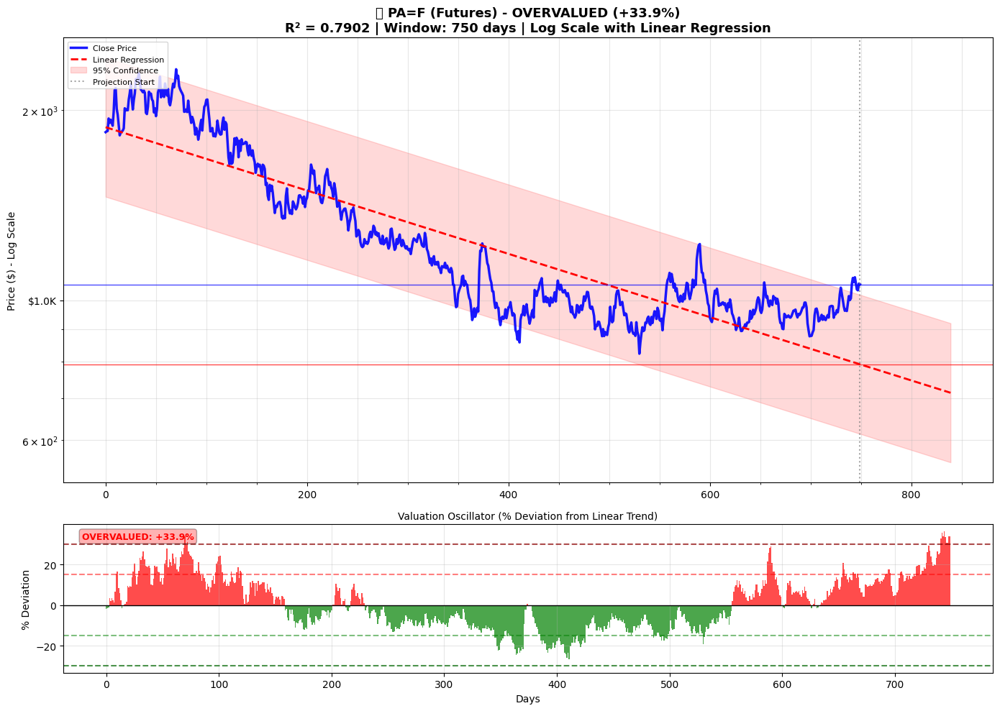


Chart 15: OJ=F (R² = 0.7762)

📊 PRICE PROJECTIONS (Linear Regression - 180 days):
   Current: $237.60
   +30d (1m): $201.31 ($151.25 - $267.93)
   +60d (2m): $172.73 ($129.49 - $230.42)
   +90d (3m): $148.21 ($110.80 - $198.26)
   90-day outlook: 📉 Bearish Trend (-37.6%)
   Confidence: 77.6% | Valuation: FAIR VALUE
------------------------------------------------------------


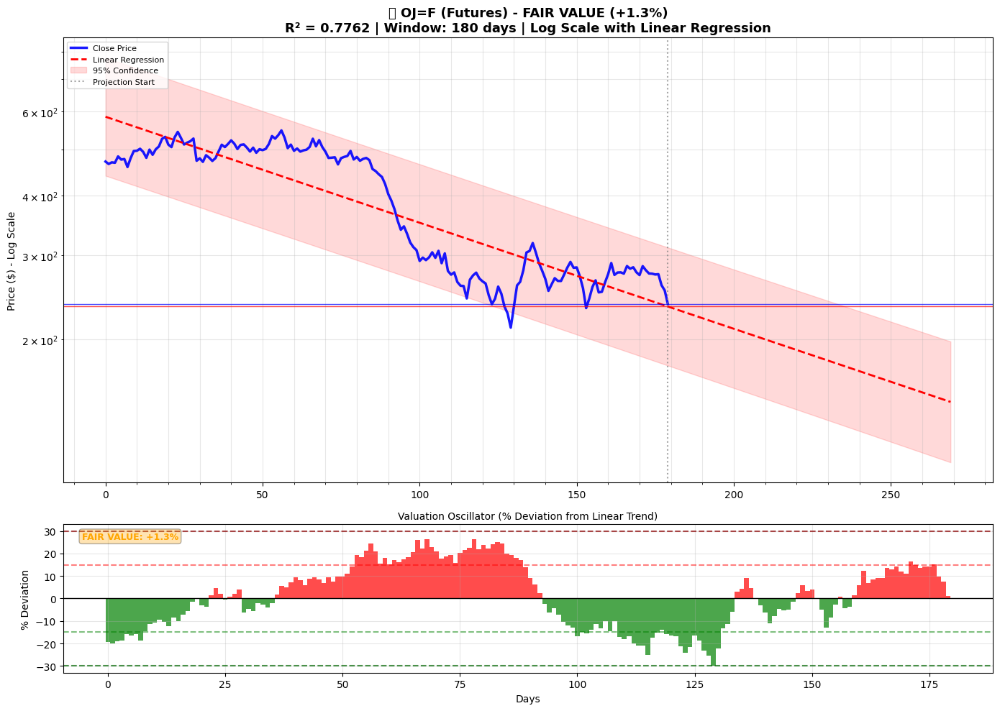


🟢 TOP 2 FUTURES INSTRUMENTS - UNDERVALUED OPPORTUNITIES
Rank Symbol          Under%   R²         Growth%      Price           Upside%    Window  
------------------------------------------------------------------------------------------------------------------------
1    CC=F             29.6%  0.884219     86.5%   $8.8K              42.1%  750 d
2    KC=F             20.2%  0.931892     70.1%   $319.45            25.4%  500 d

📊 DISPLAYING ALL 2 UNDERVALUED FUTURES OPPORTUNITY CHARTS:
--------------------------------------------------------------------------------

Chart 1: CC=F (Undervalued by 29.6%)

📊 PRICE PROJECTIONS (Linear Regression - 750 days):
   Current: $8.8K
   +30d (1m): $13.4K ($9.1K - $19.6K)
   +60d (2m): $14.4K ($9.8K - $21.1K)
   +90d (3m): $15.5K ($10.6K - $22.8K)
   90-day outlook: 📈 Bullish Trend (+77.5%)
   Confidence: 88.4% | Valuation: UNDERVALUED
------------------------------------------------------------


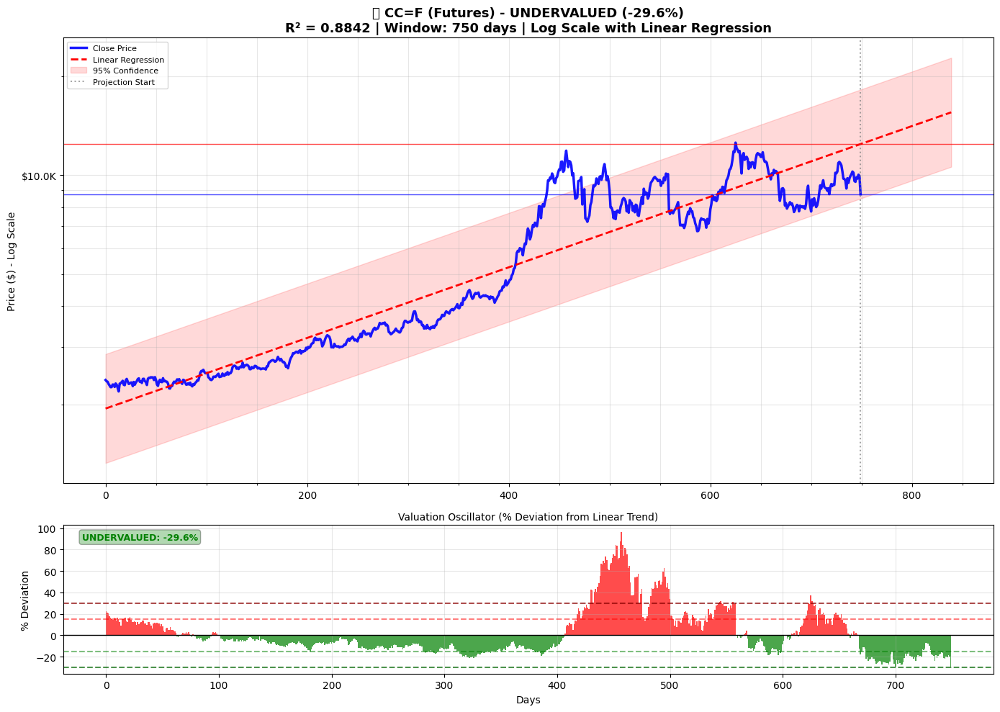


Chart 2: KC=F (Undervalued by 20.2%)

📊 PRICE PROJECTIONS (Linear Regression - 500 days):
   Current: $319.45
   +30d (1m): $426.63 ($362.68 - $501.85)
   +60d (2m): $454.48 ($386.31 - $534.69)
   +90d (3m): $484.15 ($411.47 - $569.68)
   90-day outlook: 📈 Bullish Trend (+51.6%)
   Confidence: 93.2% | Valuation: UNDERVALUED
------------------------------------------------------------


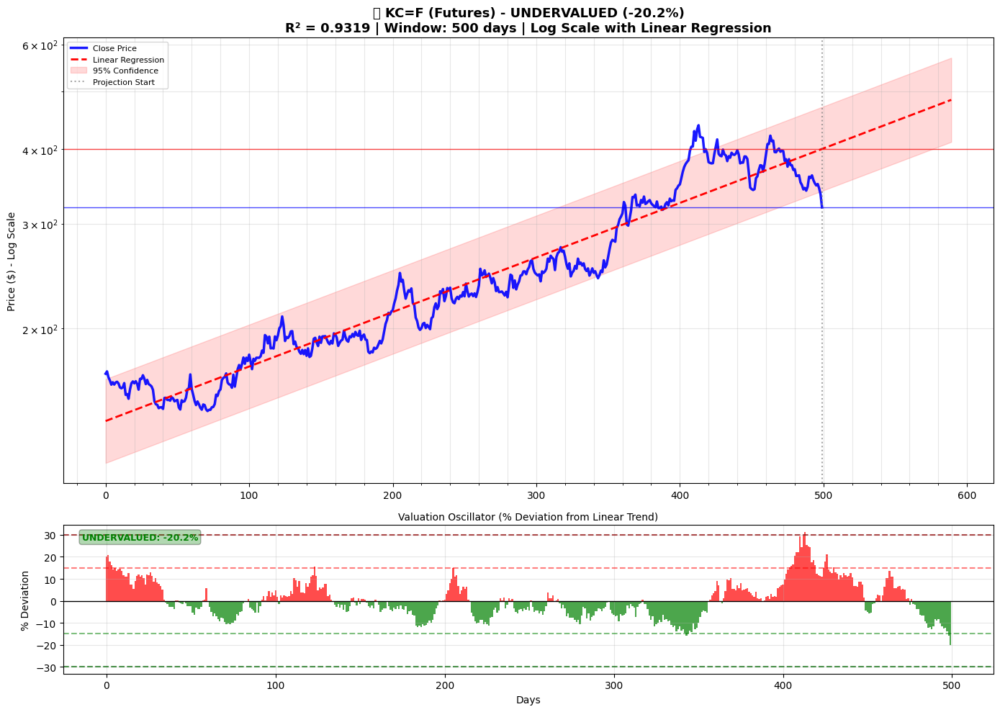


🔴 TOP 3 FUTURES INSTRUMENTS - OVERVALUED WARNINGS
Rank Symbol          Over%    R²         Growth%      Price           Risk%      Window  
------------------------------------------------------------------------------------------------------------------------
1    PA=F             33.9%  0.790151    -25.2%   $1.1K              25.3%  750 d
2    ZW=F             18.5%  0.742001    -14.4%   $590.00            15.6%  750 d
3    ZS=F             11.2%  0.869029    -16.1%   $1.1K              10.1%  750 d

📊 DISPLAYING ALL 3 OVERVALUED FUTURES WARNING CHARTS:
--------------------------------------------------------------------------------

Chart 1: PA=F (Overvalued by 33.9%)

📊 PRICE PROJECTIONS (Linear Regression - 750 days):
   Current: $1.1K
   +30d (1m): $764.62 ($593.38 - $985.28)
   +60d (2m): $738.60 ($573.13 - $951.84)
   +90d (3m): $713.46 ($553.57 - $919.54)
   90-day outlook: 📉 Bearish Trend (-32.7%)
   Confidence: 79.0% | Valuation: OVERVALUED
---------------------------------

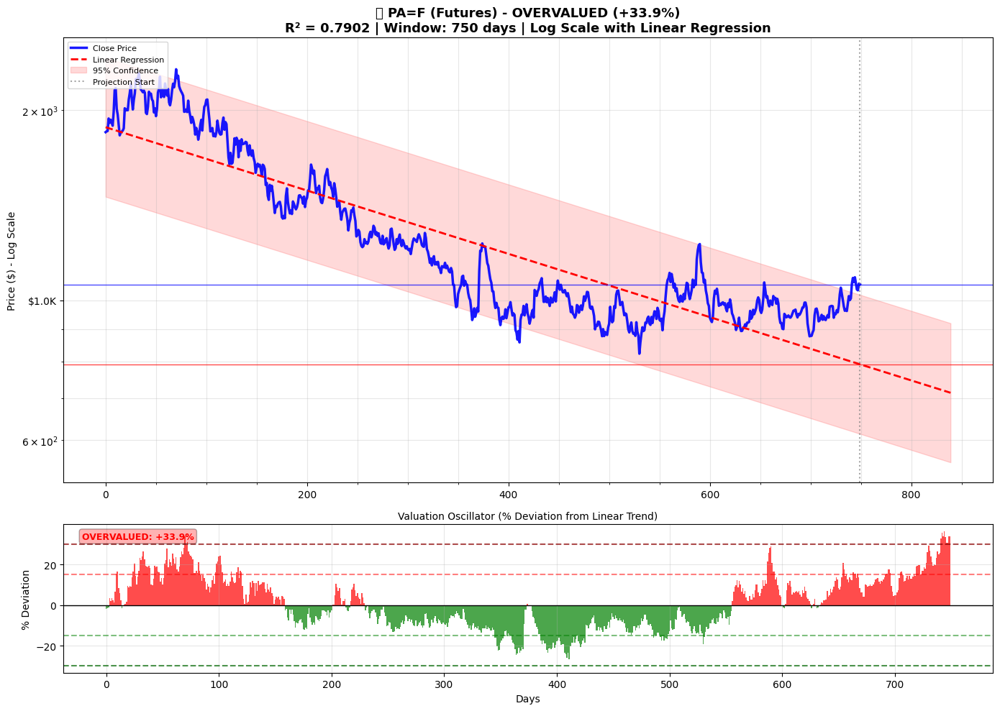


Chart 2: ZW=F (Overvalued by 18.5%)

📊 PRICE PROJECTIONS (Linear Regression - 750 days):
   Current: $590.00
   +30d (1m): $488.62 ($418.49 - $570.49)
   +60d (2m): $479.67 ($410.81 - $560.07)
   +90d (3m): $470.88 ($403.26 - $549.85)
   90-day outlook: 📉 Bearish Trend (-20.2%)
   Confidence: 74.2% | Valuation: OVERVALUED
------------------------------------------------------------


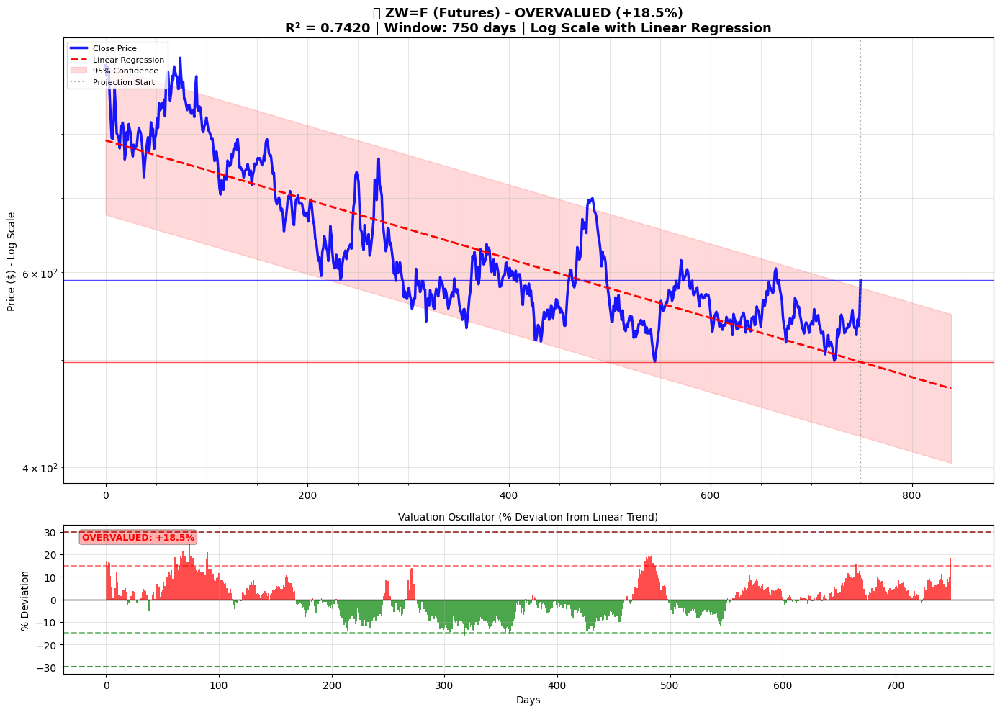


Chart 3: ZS=F (Overvalued by 11.2%)

📊 PRICE PROJECTIONS (Linear Regression - 750 days):
   Current: $1.1K
   +30d (1m): $940.97 ($838.60 - $1.1K)
   +60d (2m): $921.53 ($821.24 - $1.0K)
   +90d (3m): $902.49 ($804.24 - $1.0K)
   90-day outlook: 📉 Bearish Trend (-15.5%)
   Confidence: 86.9% | Valuation: OVERVALUED
------------------------------------------------------------


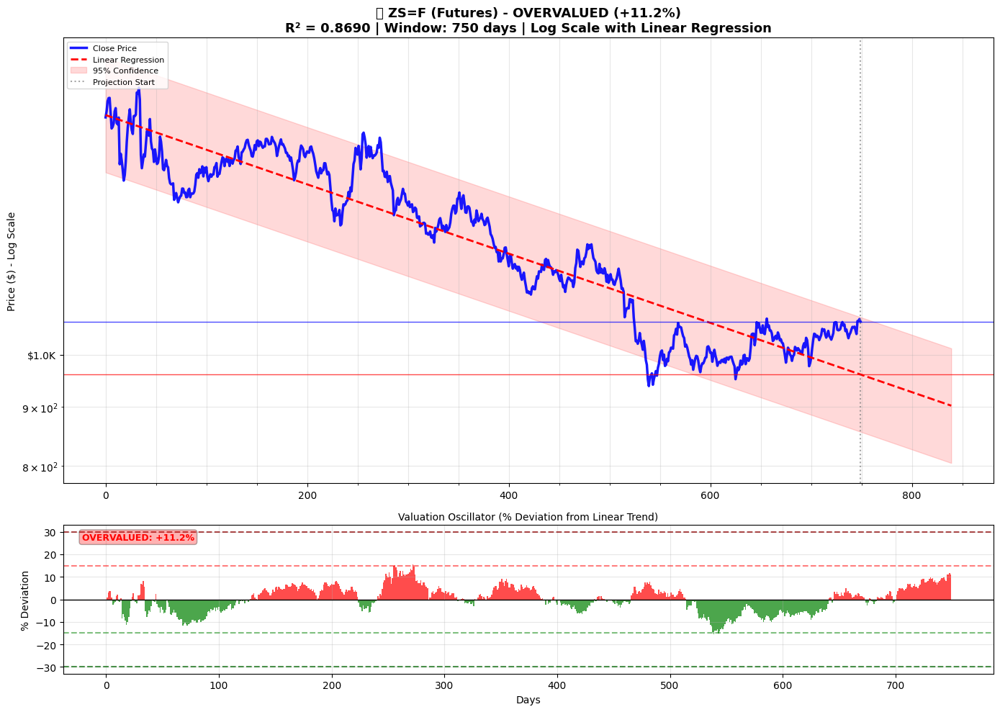


FUTURES STATISTICS:
------------------------------------------------------------
Total futures instruments analyzed: 29
Average R-squared: 0.7553
Best R-squared: 0.954094
Average annual growth: 73.6%

Valuation breakdown:
  🟡 FAIR_VALUE: 11 (37.9%) - Hold/Monitor
  🔴 OVERVALUED: 3 (10.3%) - Sell Warnings
  🟢 UNDERVALUED: 2 (6.9%) - Buy Opportunities

Optimal window distribution:
  30 days: 4 instruments (13.8%)
  60 days: 2 instruments (6.9%)
  120 days: 3 instruments (10.3%)
  180 days: 2 instruments (6.9%)
  250 days: 1 instruments (3.4%)

📊 FUTURES TRADING SUMMARY:
  🟢 High-quality undervalued opportunities: 2
  🔴 High-quality overvalued warnings: 3
  📈 Top trend performers displayed: 15
  💡 Consider buying undervalued futuress with strong trends
  ⚠️  Consider reducing overvalued futures positions

🔥 TOP 15 STOCK INSTRUMENTS - BEST TREND ANALYSIS
Rank Symbol          R²         Window   Growth%      Price           Valuation    Deviation%
------------------------------------------

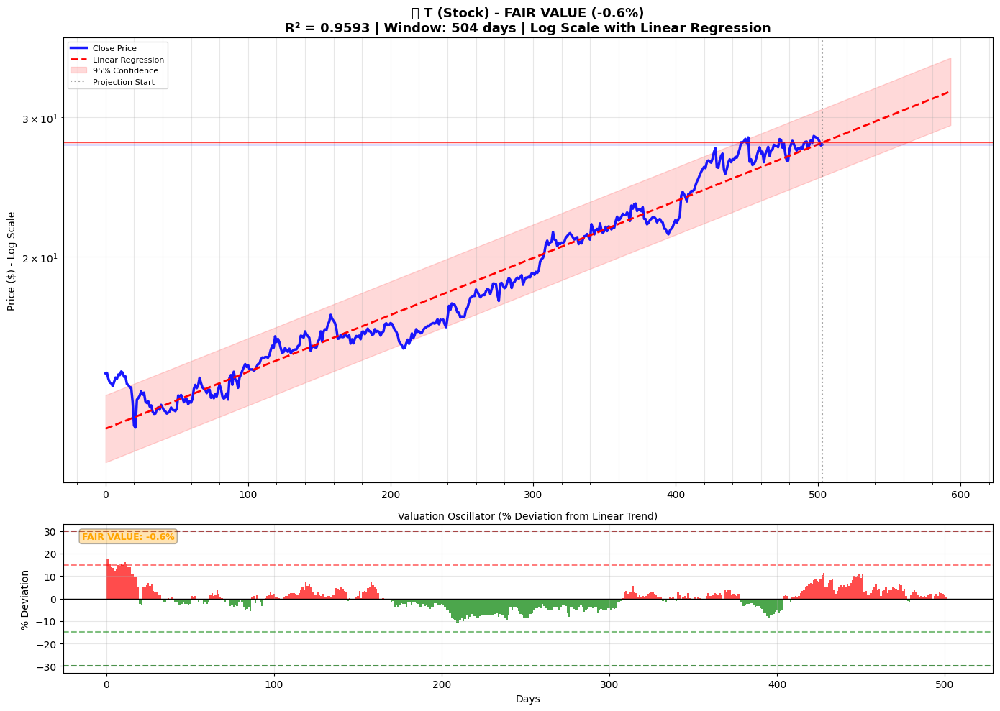


Chart 2: NFLX (R² = 0.9435)

📊 PRICE PROJECTIONS (Linear Regression - 504 days):
   Current: $1.2K
   +30d (1m): $1.2K ($1.0K - $1.4K)
   +60d (2m): $1.3K ($1.1K - $1.5K)
   +90d (3m): $1.4K ($1.2K - $1.6K)
   90-day outlook: 📈 Bullish Trend (+13.2%)
   Confidence: 94.3% | Valuation: FAIR VALUE
------------------------------------------------------------


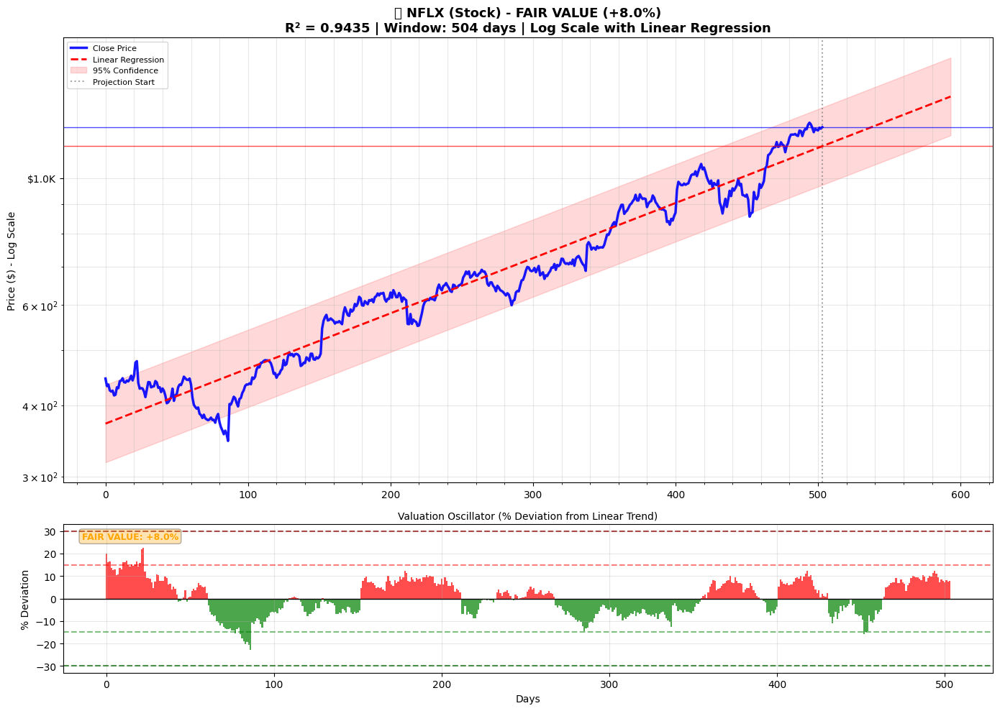


Chart 3: PM (R² = 0.9410)

📊 PRICE PROJECTIONS (Linear Regression - 378 days):
   Current: $184.10
   +30d (1m): $182.80 ($163.38 - $204.52)
   +60d (2m): $194.55 ($173.85 - $217.70)
   +90d (3m): $207.05 ($184.99 - $231.74)
   90-day outlook: 📈 Bullish Trend (+12.5%)
   Confidence: 94.1% | Valuation: FAIR VALUE
------------------------------------------------------------


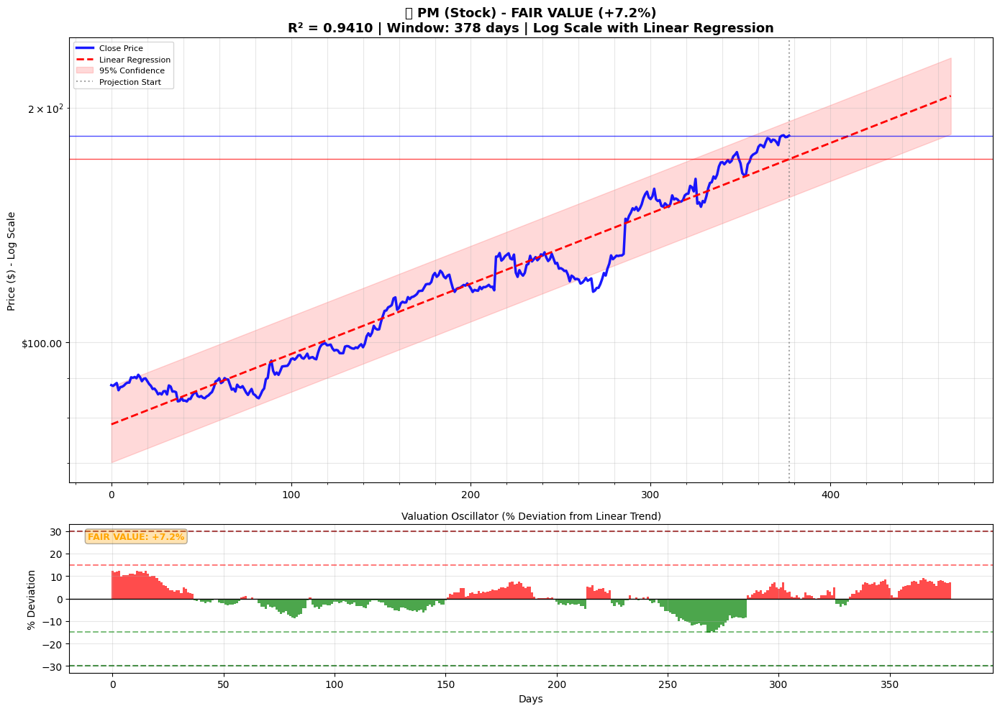


Chart 4: BRK-B (R² = 0.9368)

📊 PRICE PROJECTIONS (Linear Regression - 504 days):
   Current: $485.33
   +30d (1m): $540.31 ($505.01 - $578.07)
   +60d (2m): $555.18 ($518.89 - $594.02)
   +90d (3m): $570.47 ($533.14 - $610.41)
   90-day outlook: 📈 Bullish Trend (+17.5%)
   Confidence: 93.7% | Valuation: FAIR VALUE
------------------------------------------------------------


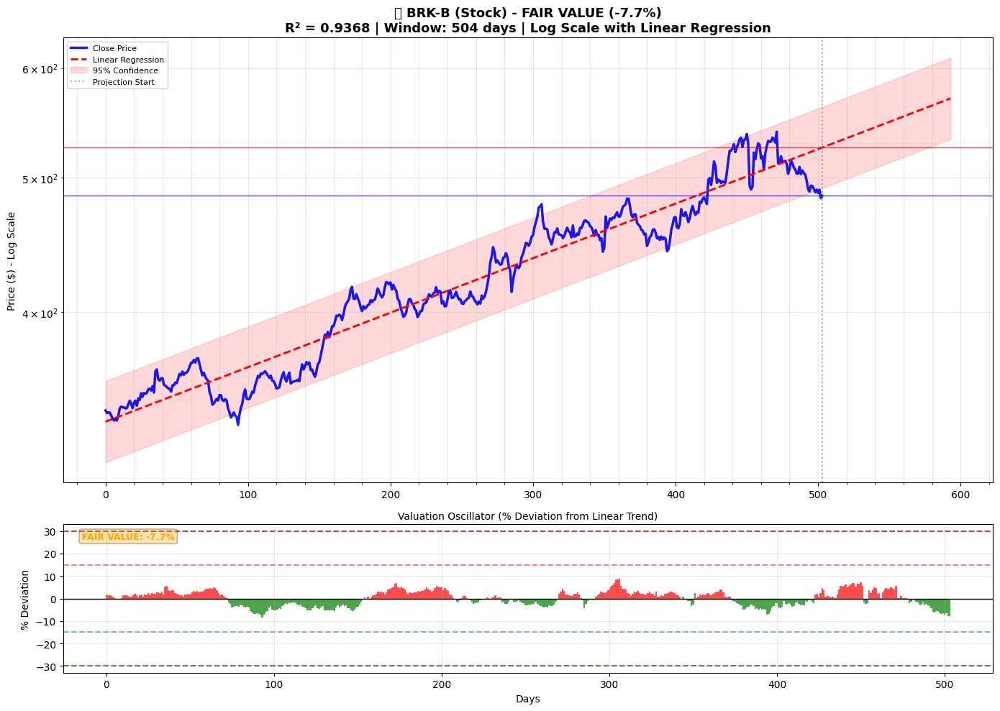


Chart 5: JPM (R² = 0.9344)

📊 PRICE PROJECTIONS (Linear Regression - 504 days):
   Current: $274.74
   +30d (1m): $290.18 ($259.83 - $324.09)
   +60d (2m): $303.11 ($271.37 - $338.55)
   +90d (3m): $316.60 ($283.43 - $353.66)
   90-day outlook: 📈 Bullish Trend (+15.2%)
   Confidence: 93.4% | Valuation: FAIR VALUE
------------------------------------------------------------


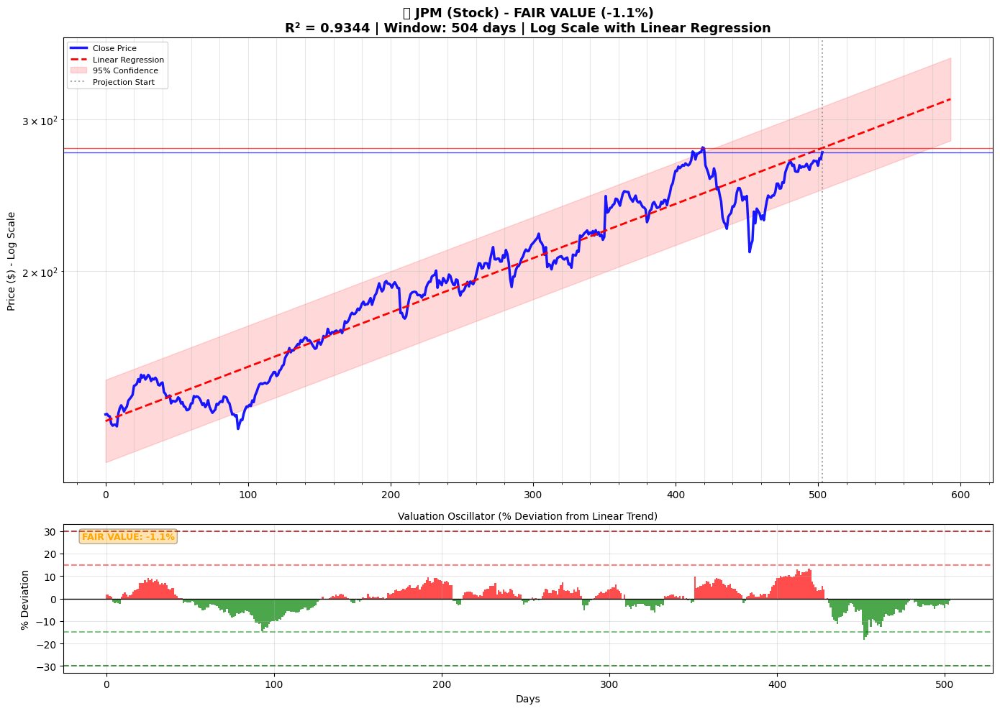


Chart 6: IBM (R² = 0.9327)

📊 PRICE PROJECTIONS (Linear Regression - 504 days):
   Current: $285.49
   +30d (1m): $281.29 ($250.06 - $316.43)
   +60d (2m): $294.47 ($261.74 - $331.28)
   +90d (3m): $308.26 ($273.97 - $346.84)
   90-day outlook: 📈 Bullish Trend (+8.0%)
   Confidence: 93.3% | Valuation: FAIR VALUE
------------------------------------------------------------


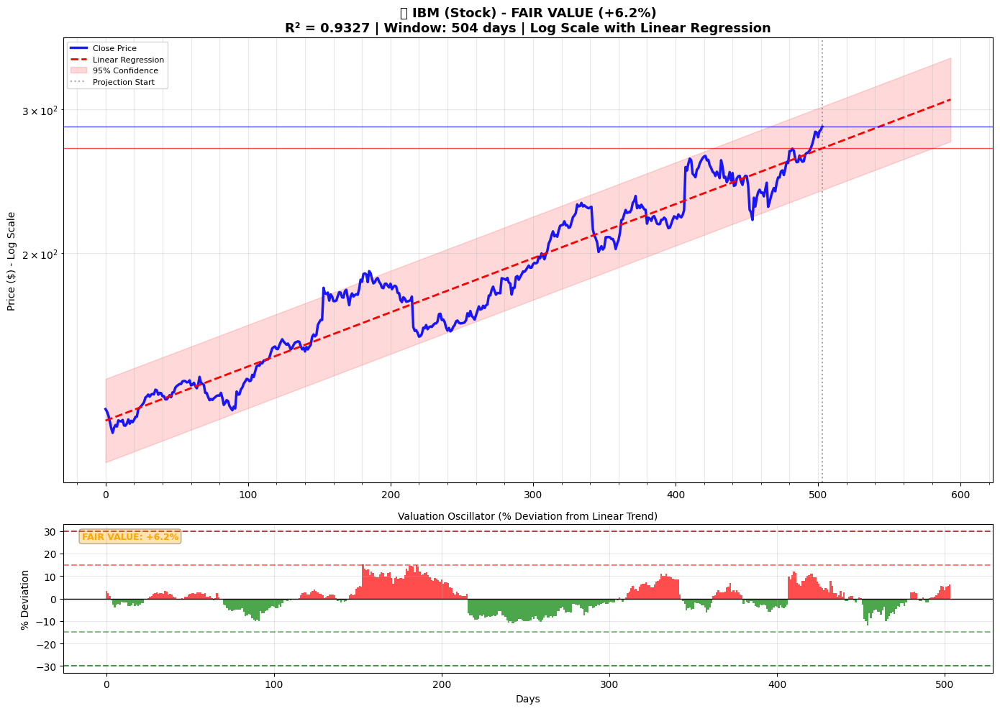


Chart 7: MRK (R² = 0.9288)

📊 PRICE PROJECTIONS (Linear Regression - 252 days):
   Current: $79.43
   +30d (1m): $71.50 ($66.06 - $77.39)
   +60d (2m): $67.39 ($62.24 - $72.96)
   +90d (3m): $63.51 ($58.64 - $68.79)
   90-day outlook: 📉 Bearish Trend (-20.0%)
   Confidence: 92.9% | Valuation: FAIR VALUE
------------------------------------------------------------


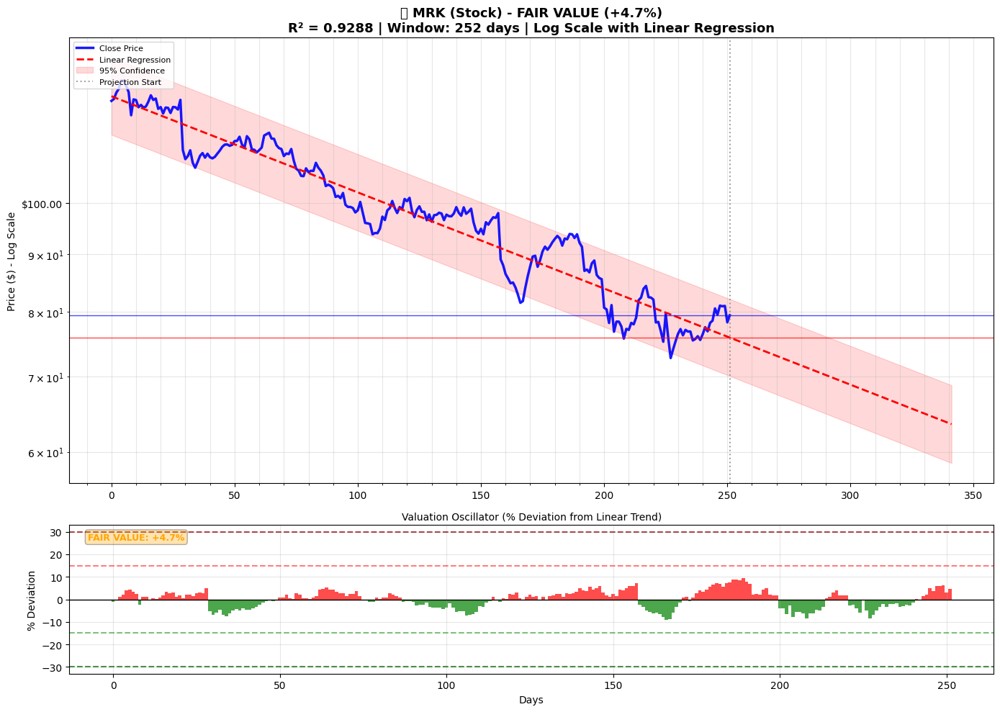


Chart 8: WMT (R² = 0.9266)

📊 PRICE PROJECTIONS (Linear Regression - 504 days):
   Current: $95.12
   +30d (1m): $107.50 ($94.36 - $122.48)
   +60d (2m): $112.84 ($99.03 - $128.56)
   +90d (3m): $118.43 ($103.93 - $134.96)
   90-day outlook: 📈 Bullish Trend (+24.5%)
   Confidence: 92.7% | Valuation: FAIR VALUE
------------------------------------------------------------


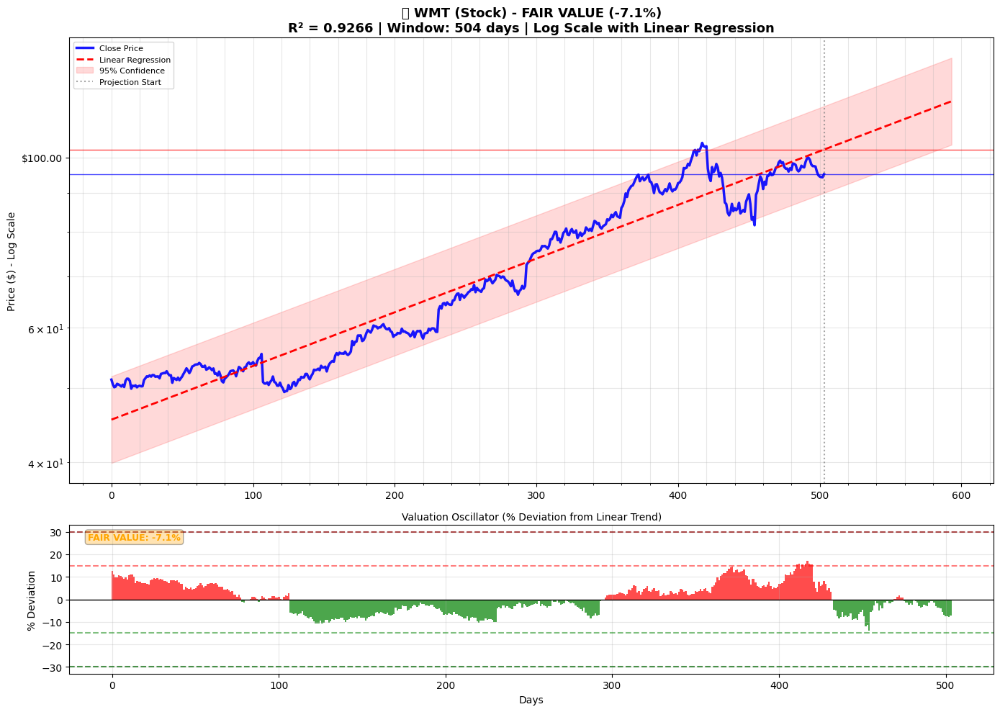


Chart 9: COST (R² = 0.9251)

📊 PRICE PROJECTIONS (Linear Regression - 504 days):
   Current: $981.34
   +30d (1m): $1.2K ($1.0K - $1.3K)
   +60d (2m): $1.2K ($1.1K - $1.4K)
   +90d (3m): $1.3K ($1.1K - $1.5K)
   90-day outlook: 📈 Bullish Trend (+31.6%)
   Confidence: 92.5% | Valuation: UNDERVALUED
------------------------------------------------------------


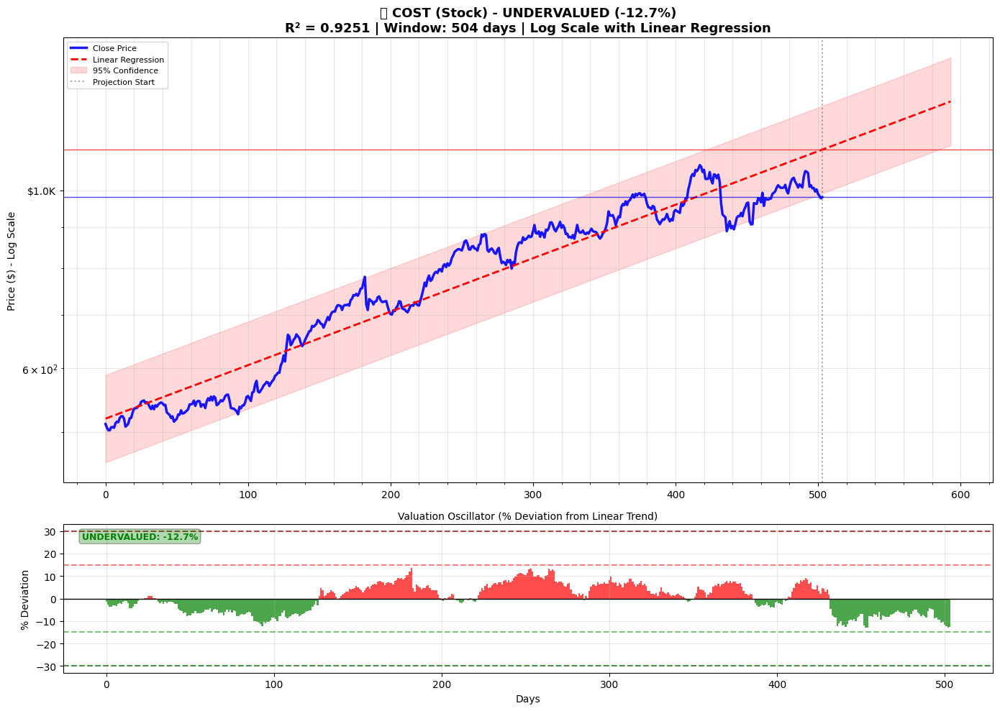


Chart 10: MSFT (R² = 0.9206)

📊 PRICE PROJECTIONS (Linear Regression - 21 days):
   Current: $479.53
   +30d (1m): $526.91 ($516.35 - $537.67)
   +60d (2m): $577.81 ($560.09 - $596.09)
   Confidence: 92.1% | Valuation: FAIR VALUE
------------------------------------------------------------


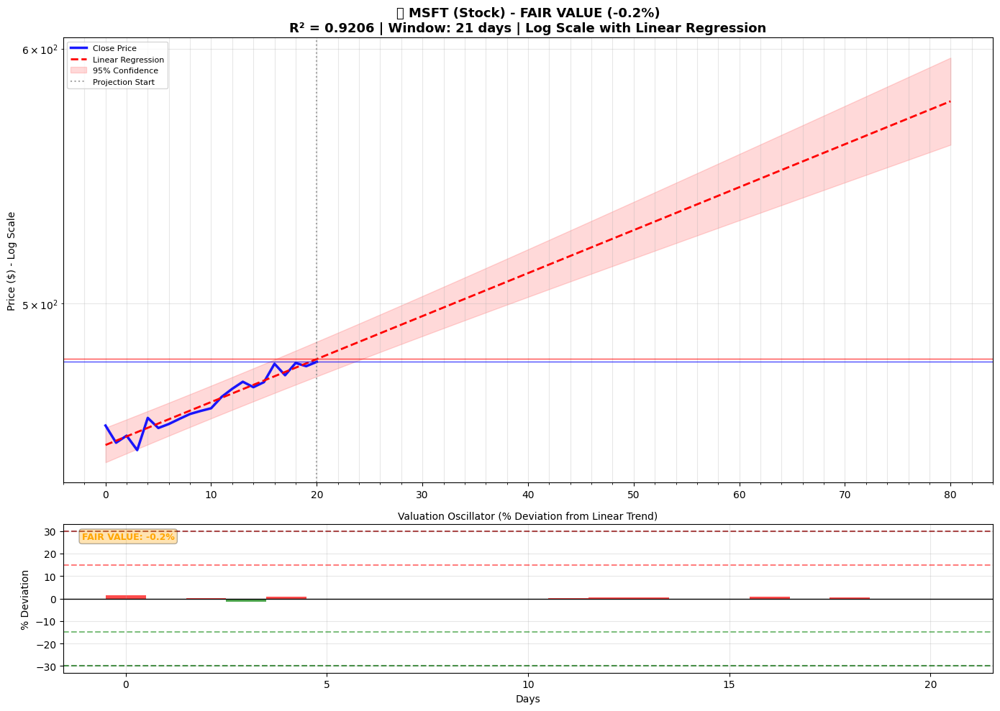


Chart 11: AVGO (R² = 0.9050)

📊 PRICE PROJECTIONS (Linear Regression - 504 days):
   Current: $251.07
   +30d (1m): $263.53 ($213.49 - $325.29)
   +60d (2m): $282.04 ($228.45 - $348.20)
   +90d (3m): $301.85 ($244.45 - $372.73)
   90-day outlook: 📈 Bullish Trend (+20.2%)
   Confidence: 90.5% | Valuation: FAIR VALUE
------------------------------------------------------------


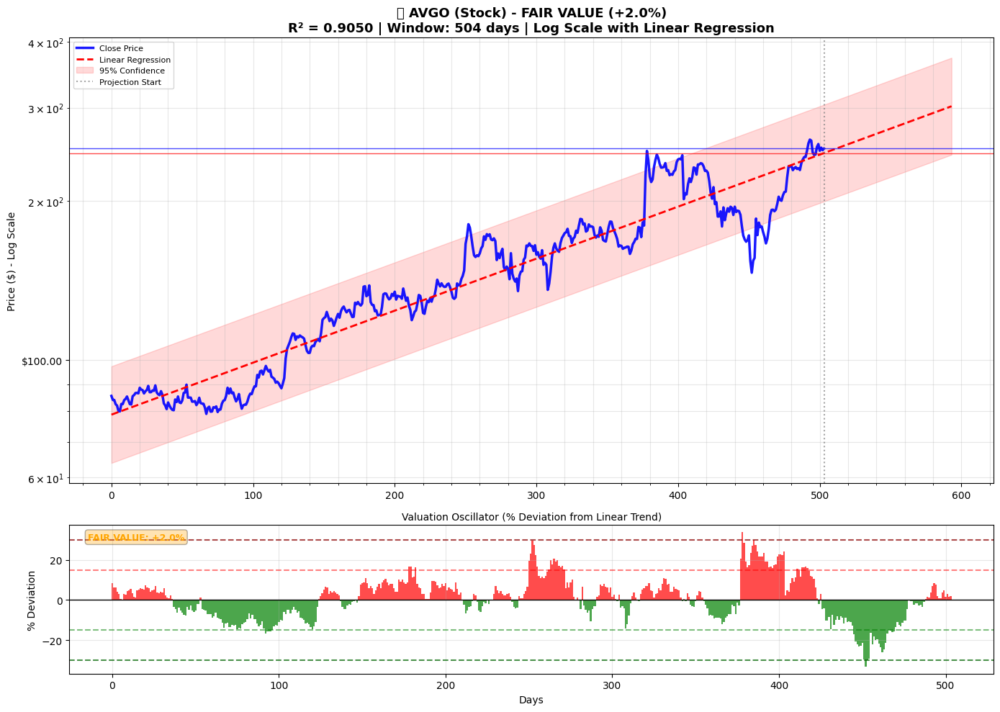


Chart 12: RTX (R² = 0.8980)
Error plotting RTX: index 131 is out of bounds for axis 0 with size 102

Chart 13: MA (R² = 0.8979)

📊 PRICE PROJECTIONS (Linear Regression - 504 days):
   Current: $550.02
   +30d (1m): $586.97 ($541.69 - $636.04)
   +60d (2m): $601.75 ($555.29 - $652.09)
   +90d (3m): $616.90 ($569.22 - $668.56)
   90-day outlook: 📈 Bullish Trend (+12.2%)
   Confidence: 89.8% | Valuation: FAIR VALUE
------------------------------------------------------------


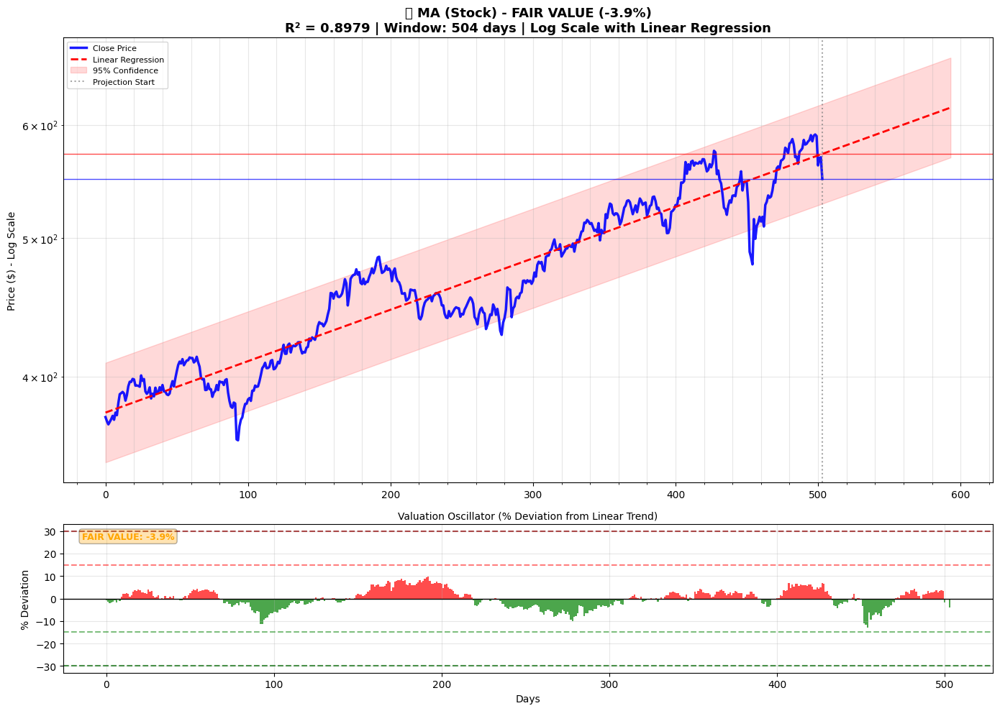


Chart 14: V (R² = 0.8940)

📊 PRICE PROJECTIONS (Linear Regression - 252 days):
   Current: $347.31
   +30d (1m): $387.85 ($360.36 - $417.43)
   +60d (2m): $405.38 ($376.54 - $436.42)
   +90d (3m): $423.70 ($393.44 - $456.30)
   90-day outlook: 📈 Bullish Trend (+22.0%)
   Confidence: 89.4% | Valuation: FAIR VALUE
------------------------------------------------------------


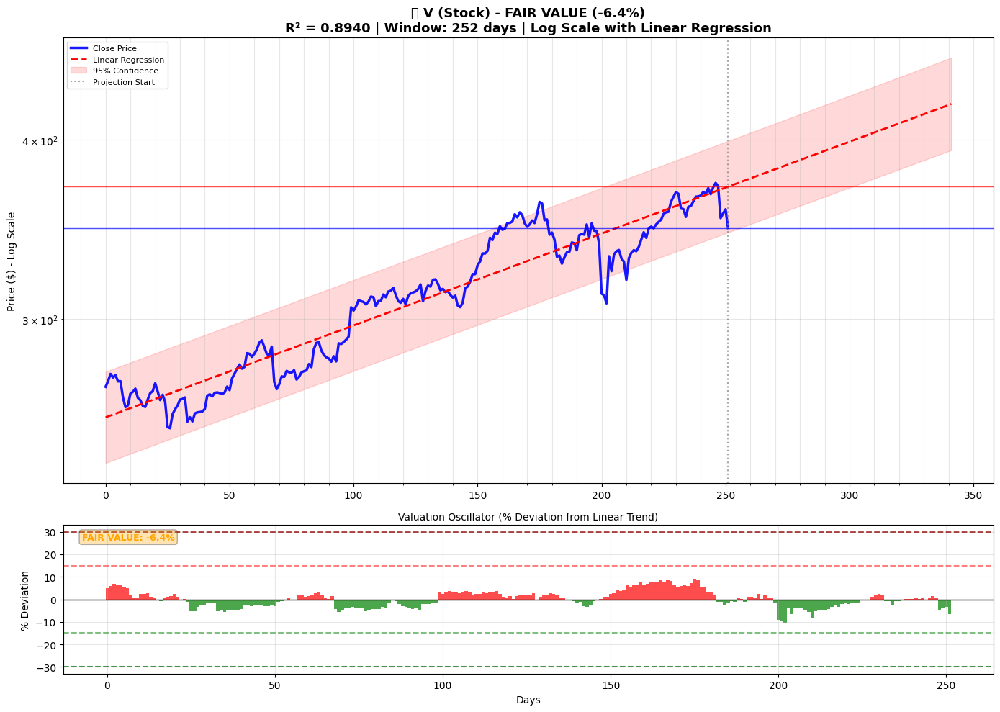


Chart 15: NVDA (R² = 0.8891)
Error plotting NVDA: index 131 is out of bounds for axis 0 with size 102

🟢 TOP 1 STOCK INSTRUMENTS - UNDERVALUED OPPORTUNITIES
Rank Symbol          Under%   R²         Growth%      Price           Upside%    Window  
------------------------------------------------------------------------------------------------------------------------
1    COST             12.7%  0.925064     47.3%   $981.34            14.6%  504 d

📊 DISPLAYING ALL 1 UNDERVALUED STOCK OPPORTUNITY CHARTS:
--------------------------------------------------------------------------------

Chart 1: COST (Undervalued by 12.7%)

📊 PRICE PROJECTIONS (Linear Regression - 504 days):
   Current: $981.34
   +30d (1m): $1.2K ($1.0K - $1.3K)
   +60d (2m): $1.2K ($1.1K - $1.4K)
   +90d (3m): $1.3K ($1.1K - $1.5K)
   90-day outlook: 📈 Bullish Trend (+31.6%)
   Confidence: 92.5% | Valuation: UNDERVALUED
------------------------------------------------------------


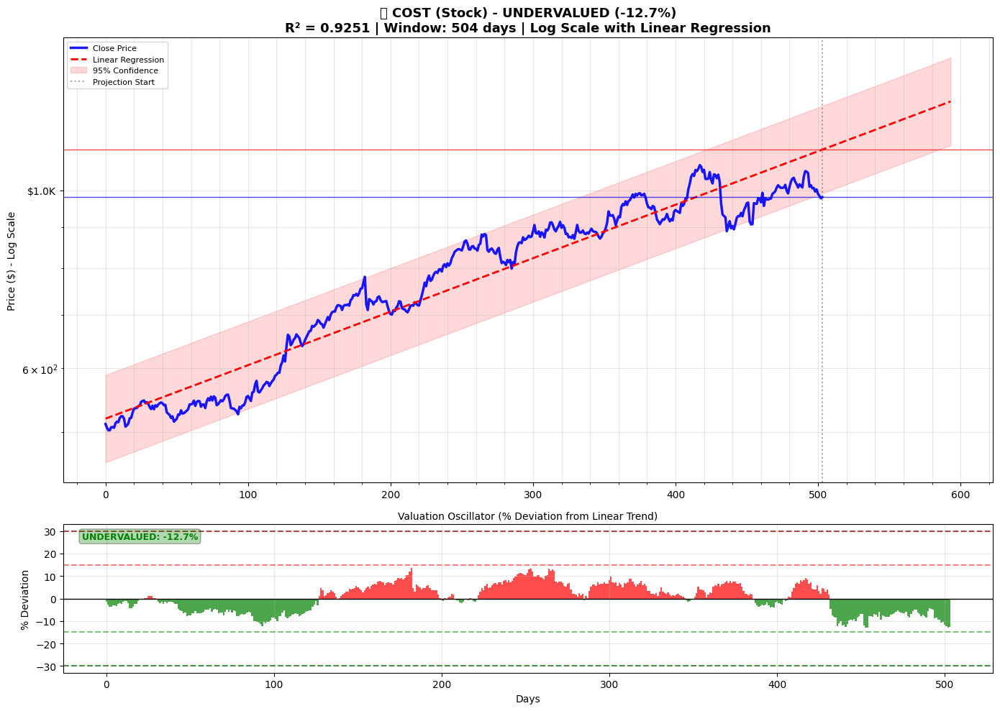


🔴 TOP 2 STOCK INSTRUMENTS - OVERVALUED WARNINGS
Rank Symbol          Over%    R²         Growth%      Price           Risk%      Window  
------------------------------------------------------------------------------------------------------------------------
1    INTC             24.4%  0.759318    -45.7%   $21.30             19.6%  378 d
2    UNH              15.9%  0.822203    -95.7%   $309.15            13.7%  63  d

📊 DISPLAYING ALL 2 OVERVALUED STOCK WARNING CHARTS:
--------------------------------------------------------------------------------

Chart 1: INTC (Overvalued by 24.4%)

📊 PRICE PROJECTIONS (Linear Regression - 378 days):
   Current: $21.30
   +30d (1m): $15.93 ($11.86 - $21.39)
   +60d (2m): $14.81 ($11.03 - $19.90)
   +90d (3m): $13.77 ($10.25 - $18.51)
   90-day outlook: 📉 Bearish Trend (-35.3%)
   Confidence: 75.9% | Valuation: OVERVALUED
------------------------------------------------------------


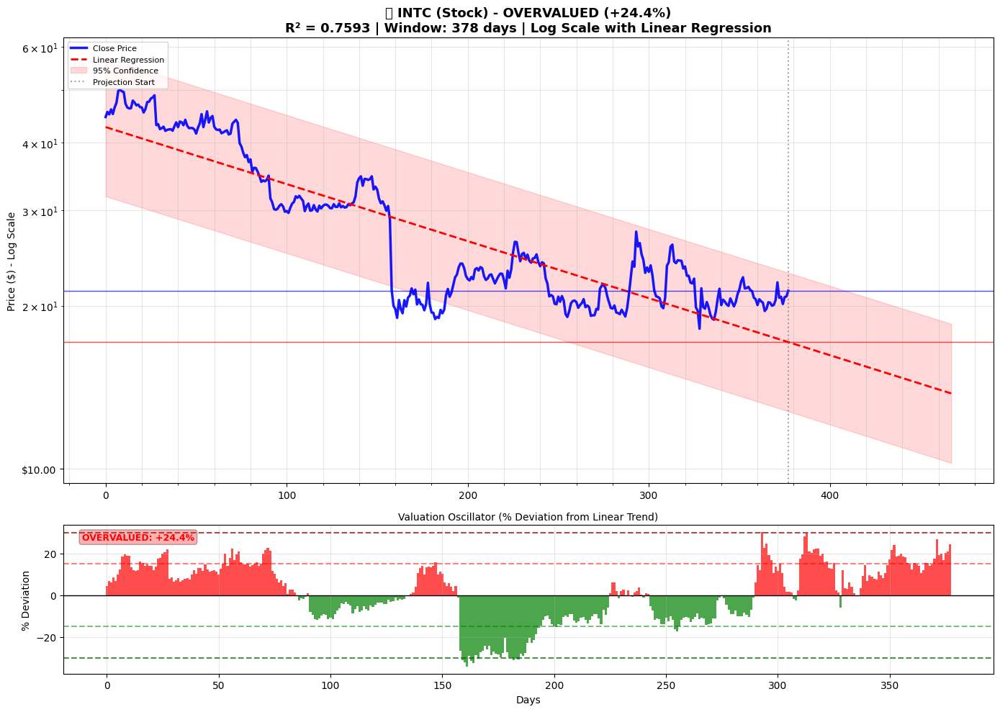


Chart 2: UNH (Overvalued by 15.9%)
Error plotting UNH: index 152 is out of bounds for axis 0 with size 123

STOCK STATISTICS:
------------------------------------------------------------
Total stock instruments analyzed: 50
Average R-squared: 0.8045
Best R-squared: 0.959297
Average annual growth: 132.1%

Valuation breakdown:
  🟡 FAIR_VALUE: 38 (76.0%) - Hold/Monitor
  🔴 OVERVALUED: 2 (4.0%) - Sell Warnings
  🟢 UNDERVALUED: 1 (2.0%) - Buy Opportunities

Optimal window distribution:
  21 days (~1m): 4 instruments (8.0%)
  42 days (~2m): 13 instruments (26.0%)
  63 days (~3m): 2 instruments (4.0%)
  84 days (~4m): 2 instruments (4.0%)
  126 days (~6m): 2 instruments (4.0%)

📊 STOCK TRADING SUMMARY:
  🟢 High-quality undervalued opportunities: 1
  🔴 High-quality overvalued warnings: 2
  📈 Top trend performers displayed: 15
  💡 Consider buying undervalued stocks with strong trends
  ⚠️  Consider reducing overvalued stock positions

🎯 BEST INVESTMENT OPPORTUNITIES BY ASSET CLASS

🟢 TOP 5 CRY

In [17]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

def infer_asset_type(symbol):
    """Infer asset type from symbol patterns"""
    if symbol.endswith('-USD'):
        return 'crypto'
    elif symbol.endswith('=F'):
        return 'futures'
    else:
        return 'stock'

def get_asset_specific_windows(asset_type):
    """Get appropriate analysis windows for different asset types"""
    if asset_type == 'crypto':
        # Crypto trades 24/7, use calendar days
        return [30, 60, 90, 120, 180, 365, 500, 750, 1000]
    elif asset_type == 'futures':
        # Futures trade extended hours, use calendar days but shorter range
        return [30, 60, 90, 120, 180, 250, 365, 500, 750]
    else:  # stocks
        # Stocks trade business days, use trading days equivalent
        return [21, 42, 63, 84, 126, 189, 252, 378, 504]  # ~1m, 2m, 3m, 4m, 6m, 9m, 1y, 1.5y, 2y

def format_price(price, asset_type):
    """Format prices appropriately based on asset type and value"""
    if asset_type == 'crypto':
        if price >= 1000000:
            return f'${price/1000000:.2f}M'
        elif price >= 1000:
            return f'${price/1000:.1f}K'
        elif price >= 1:
            return f'${price:.2f}'
        else:
            return f'${price:.6f}'
    else:  # futures and stocks
        if price >= 1000000:
            return f'${price/1000000:.2f}M'
        elif price >= 1000:
            return f'${price/1000:.1f}K'
        else:
            return f'${price:.2f}'

def calculate_undervaluation_metrics(df, asset_type, window_sizes=None):
    """Calculate undervaluation metrics for a single instrument"""
    if window_sizes is None:
        window_sizes = get_asset_specific_windows(asset_type)
    
    undervaluation_data = []
    
    for window in window_sizes:
        if window >= len(df):
            continue
            
        # Get recent data
        recent_data = df.tail(window).copy().reset_index(drop=True)
        
        if len(recent_data) < 10 or recent_data['close'].isna().any():
            continue
        
        # Fit regression on log scale
        X = np.arange(len(recent_data)).reshape(-1, 1)
        y_log = np.log(recent_data['close'].values)
        
        model = LinearRegression()
        model.fit(X, y_log)
        
        # Calculate current deviation
        y_log_pred = model.predict(X)
        fitted_prices = np.exp(y_log_pred)
        current_price = recent_data['close'].iloc[-1]
        trend_price = fitted_prices[-1]
        
        # Percentage deviation (negative = undervalued)
        deviation_pct = ((current_price - trend_price) / trend_price) * 100
        
        # R-squared for trend quality
        r2 = r2_score(y_log, y_log_pred)
        
        # Annual growth rate (adjust for asset type)
        slope = model.coef_[0]
        if asset_type == 'crypto':
            annual_growth = (np.exp(slope) ** 365 - 1) * 100  # 365 days
        else:
            annual_growth = (np.exp(slope) ** 252 - 1) * 100  # 252 trading days
        
        undervaluation_data.append({
            'window_days': window,
            'deviation_pct': deviation_pct,
            'r_squared': r2,
            'annual_growth': annual_growth,
            'current_price': current_price,
            'trend_price': trend_price,
            'window_start_price': recent_data['close'].iloc[0],
            'window_end_price': recent_data['close'].iloc[-1]
        })
    
    return undervaluation_data

def find_best_regression_channels(df, asset_type, top_n=3, window_sizes=None):
    """Find the top N best fitting linear regression channels"""
    if window_sizes is None:
        window_sizes = get_asset_specific_windows(asset_type)
    
    results = []
    
    for window in window_sizes:
        if window >= len(df):
            continue
            
        # Get the most recent 'window' days
        recent_data = df.tail(window).copy()
        recent_data = recent_data.reset_index(drop=True)
        
        # Check if we have enough valid data
        if len(recent_data) < 10 or recent_data['close'].isna().any():
            continue
        
        # Prepare data for regression (log scale)
        X = np.arange(len(recent_data)).reshape(-1, 1)
        y = np.log(recent_data['close'].values)
        
        # Fit linear regression
        model = LinearRegression()
        model.fit(X, y)
        
        # Make predictions
        y_pred = model.predict(X)
        
        # Calculate R-squared
        r2 = r2_score(y, y_pred)
        
        # Calculate other metrics (converting back from log scale)
        slope = model.coef_[0]  # This is now log slope
        intercept = model.intercept_  # This is now log intercept
        start_price = recent_data['close'].iloc[0]
        end_price = recent_data['close'].iloc[-1]
        
        # Annual growth rate based on asset type
        if asset_type == 'crypto':
            annual_growth_rate = (np.exp(slope) ** 365 - 1) * 100
        else:
            annual_growth_rate = (np.exp(slope) ** 252 - 1) * 100
        
        # Store results
        results.append({
            'window_size': window,
            'r_squared': r2,
            'log_slope': slope,
            'daily_growth_rate': np.exp(slope) - 1,
            'annual_growth_rate': annual_growth_rate,
            'log_intercept': intercept,
            'start_price': start_price,
            'end_price': end_price,
            'price_change': end_price - start_price,
            'price_change_pct': ((end_price - start_price) / start_price) * 100
        })
    
    # Sort by R-squared (best fit first)
    results_df = pd.DataFrame(results)
    if len(results_df) > 0:
        results_df = results_df.sort_values('r_squared', ascending=False)
        return results_df.head(top_n)
    else:
        return pd.DataFrame()

def analyze_single_instrument(df_data, symbol, asset_type, top_n=3, min_data_points=30):
    """Analyze a single instrument (crypto/futures/stock)"""
    instrument_data = df_data[df_data['symbol'] == symbol].copy()
    instrument_data = instrument_data.sort_values('time').reset_index(drop=True)
    
    if len(instrument_data) < min_data_points:
        return None
    
    # Find best regression channels
    top_channels = find_best_regression_channels(instrument_data, asset_type, top_n=top_n)
    
    if len(top_channels) == 0:
        return None
    
    # Calculate undervaluation metrics
    underval_metrics = calculate_undervaluation_metrics(instrument_data, asset_type)
    
    if not underval_metrics:
        return None
    
    # Find best reliable trend for undervaluation analysis
    valid_metrics = [m for m in underval_metrics if m['r_squared'] >= 0.7]
    
    if valid_metrics:
        best_underval = max(valid_metrics, key=lambda x: x['r_squared'])
        
        # Determine valuation status
        deviation = best_underval['deviation_pct']
        if deviation < -10:  # More than 10% below trend
            valuation_status = 'UNDERVALUED'
        elif deviation > 10:  # More than 10% above trend
            valuation_status = 'OVERVALUED'
        else:
            valuation_status = 'FAIR_VALUE'
        
        underval_info = {
            'deviation_pct': deviation,
            'valuation_status': valuation_status,
            'trend_r_squared': best_underval['r_squared'],
            'trend_window': best_underval['window_days'],
            'current_price': best_underval['current_price'],
            'trend_price': best_underval['trend_price'],
            'annual_trend_growth': best_underval['annual_growth']
        }
    else:
        underval_info = None
    
    # Add metadata to results
    for i, (idx, channel) in enumerate(top_channels.iterrows()):
        top_channels.loc[idx, 'symbol'] = symbol
        top_channels.loc[idx, 'asset_type'] = asset_type
        top_channels.loc[idx, 'rank'] = i + 1
        
        if underval_info:
            for key, value in underval_info.items():
                top_channels.loc[idx, key] = value
    
    return top_channels

def analyze_all_instruments_by_asset_type(df_data, top_n_per_symbol=1, min_data_points=30):
    """Analyze all instruments grouped by asset type"""
    
    # Add asset_type if not present
    if 'asset_type' not in df_data.columns:
        df_data['asset_type'] = df_data['symbol'].apply(infer_asset_type)
    
    # Get unique symbols by asset type
    asset_symbols = df_data.groupby('asset_type')['symbol'].unique()
    
    print(f"Analyzing instruments by asset type...")
    for asset_type, symbols in asset_symbols.items():
        print(f"  {asset_type}: {len(symbols)} instruments")
    
    all_results = []
    processed_count = 0
    successful_count = 0
    
    # Process each asset type
    for asset_type in ['crypto', 'futures', 'stock']:
        if asset_type not in asset_symbols:
            continue
            
        symbols = asset_symbols[asset_type]
        print(f"\nProcessing {len(symbols)} {asset_type} instruments...")
        
        for i, symbol in enumerate(symbols, 1):
            processed_count += 1
            
            try:
                result = analyze_single_instrument(df_data, symbol, asset_type, 
                                                 top_n=top_n_per_symbol, 
                                                 min_data_points=min_data_points)
                if result is not None and len(result) > 0:
                    all_results.append(result)
                    successful_count += 1
                    
            except Exception as e:
                continue  # Skip problematic symbols
            
            # Progress update
            if i % 25 == 0:
                print(f"  Progress: {i}/{len(symbols)} {asset_type} instruments processed")
    
    print(f"\nAnalysis complete: {successful_count}/{processed_count} instruments analyzed successfully")
    
    # Combine all results
    if all_results:
        combined_results = pd.concat(all_results, ignore_index=True)
        return combined_results
    else:
        return pd.DataFrame()

def calculate_vwma(prices, volumes, period=50):
    """Calculate Volume Weighted Moving Average (using only 50-period)"""
    if len(prices) != len(volumes) or len(prices) < period:
        return np.full(len(prices), np.nan)
    
    vwma = np.full(len(prices), np.nan)
    
    for i in range(period - 1, len(prices)):
        # Get the last 'period' prices and volumes
        price_window = prices[i - period + 1:i + 1]
        volume_window = volumes[i - period + 1:i + 1]
        
        # Handle missing or zero volumes
        valid_mask = (volume_window > 0) & ~np.isnan(volume_window) & ~np.isnan(price_window)
        
        if valid_mask.sum() > 0:
            valid_prices = price_window[valid_mask]
            valid_volumes = volume_window[valid_mask]
            
            # VWMA formula: Σ(Price × Volume) / Σ(Volume)
            vwma[i] = np.sum(valid_prices * valid_volumes) / np.sum(valid_volumes)
        else:
            # Fallback to simple moving average if no volume data
            vwma[i] = np.mean(price_window[~np.isnan(price_window)])
    
    return vwma

def plot_instrument_regression_chart(df_data, symbol, asset_type, window_size, r_squared):
    """Plot regression chart for a single instrument with price projections using straight line on log scale"""
    
    # Get instrument data
    instrument_data = df_data[df_data['symbol'] == symbol].copy()
    instrument_data = instrument_data.sort_values('time').reset_index(drop=True)
    
    # Get recent data for the specified window
    recent_data = instrument_data.tail(window_size).copy().reset_index(drop=True)
    
    if len(recent_data) < 10:
        return
    
    # Regression analysis in log space
    X = np.arange(len(recent_data)).reshape(-1, 1)
    y_log = np.log(recent_data['close'].values)
    
    model = LinearRegression()
    model.fit(X, y_log)
    
    # Predictions in log space (these will be straight lines on log chart)
    y_log_pred = model.predict(X)
    
    # Extended predictions for projection (in log space)
    projection_days = 60 if window_size <= 120 else 90
    X_extended = np.arange(len(recent_data) + projection_days).reshape(-1, 1)
    y_log_pred_extended = model.predict(X_extended)
    
    # Confidence intervals in log space
    residuals = y_log - y_log_pred
    mse = np.mean(residuals ** 2)
    n = len(recent_data)
    X_mean = np.mean(X)
    X_var = np.sum((X - X_mean) ** 2)
    se_pred = np.sqrt(mse * (1 + 1/n + (X_extended - X_mean)**2 / X_var))
    t_val = stats.t.ppf(0.975, n-2)
    
    # Confidence intervals in log space (will be straight on log chart)
    ci_lower_log = y_log_pred_extended - t_val * se_pred.flatten()
    ci_upper_log = y_log_pred_extended + t_val * se_pred.flatten()
    
    # Convert back to price space for calculations but keep log versions for display
    fitted_prices = np.exp(y_log_pred)
    ci_lower_prices = np.exp(ci_lower_log)
    ci_upper_prices = np.exp(ci_upper_log)
    y_pred_extended_prices = np.exp(y_log_pred_extended)
    
    # Calculate price projections
    def get_projection(days_ahead):
        if days_ahead >= len(y_pred_extended_prices):
            return None, None, None
        
        predicted_price = y_pred_extended_prices[len(recent_data) - 1 + days_ahead]
        lower_band = ci_lower_prices[len(recent_data) - 1 + days_ahead]
        upper_band = ci_upper_prices[len(recent_data) - 1 + days_ahead]
        
        return predicted_price, lower_band, upper_band
    
    # Calculate projections for 30, 60, 90 days
    proj_30d = get_projection(30)
    proj_60d = get_projection(60)
    proj_90d = get_projection(90)
    
    # Create the plot
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 10), gridspec_kw={'height_ratios': [3, 1]})
    
    # Format symbol name for display
    if asset_type == 'crypto':
        display_name = symbol.replace('-USD', '').upper()
        asset_emoji = '₿'
    elif asset_type == 'futures':
        display_name = symbol
        asset_emoji = '📈'
    else:  # stock
        display_name = symbol
        asset_emoji = '📊'
    
    # Main price chart - ALWAYS use log scale and plot log regression as STRAIGHT LINE
    actual_prices = recent_data['close'].values
    
    # Use log scale for all charts to show straight regression lines
    ax1.semilogy(range(len(actual_prices)), actual_prices, 'b-', linewidth=2.5, label='Close Price', alpha=0.9, base=10)
    
    # Plot straight regression line in log space (will appear straight on log chart)
    regression_prices_extended = np.exp(y_log_pred_extended)
    ax1.semilogy(range(len(regression_prices_extended)), regression_prices_extended, 'r--', linewidth=2, label='Linear Regression', base=10)
    
    # Confidence bands (will also appear as straight lines on log chart)
    ax1.fill_between(range(len(ci_lower_prices)), ci_lower_prices, ci_upper_prices, alpha=0.15, color='red', label='95% Confidence')
    ax1.axvline(x=len(actual_prices)-1, color='gray', linestyle=':', alpha=0.7, label='Projection Start')
    
    # Highlight current vs trend price
    current_price = actual_prices[-1]
    trend_price = fitted_prices[-1]
    
    ax1.axhline(y=current_price, color='blue', linestyle='-', alpha=0.7, linewidth=1)
    ax1.axhline(y=trend_price, color='red', linestyle='-', alpha=0.7, linewidth=1)
    
    # Calculate deviation
    deviation_pct = ((current_price - trend_price) / trend_price) * 100
    
    # Determine valuation status
    if deviation_pct < -10:
        valuation = "UNDERVALUED"
        val_color = "green"
    elif deviation_pct > 10:
        valuation = "OVERVALUED" 
        val_color = "red"
    else:
        valuation = "FAIR VALUE"
        val_color = "orange"
    
    # Simplified title without VWMA info
    ax1.set_title(f'{asset_emoji} {display_name} ({asset_type.title()}) - {valuation} ({deviation_pct:+.1f}%)\n'
                  f'R² = {r_squared:.4f} | Window: {window_size} days | Log Scale with Linear Regression', 
                  fontsize=13, fontweight='bold')
    ax1.set_ylabel('Price ($) - Log Scale')
    ax1.legend(fontsize=8, loc='upper left')
    ax1.grid(True, alpha=0.3, which='both')
    ax1.minorticks_on()
    
    # Format y-axis
    from matplotlib.ticker import FuncFormatter
    ax1.yaxis.set_major_formatter(FuncFormatter(lambda x, pos: format_price(x, asset_type)))
    
    # Enhanced oscillator
    oscillator = ((actual_prices - fitted_prices) / fitted_prices) * 100
    colors = ['green' if val < 0 else 'red' for val in oscillator]
    
    ax2.bar(range(len(oscillator)), oscillator, color=colors, alpha=0.7, width=1.0)
    ax2.axhline(y=0, color='black', linestyle='-', linewidth=1)
    
    # Add reference lines based on asset type
    if asset_type == 'crypto':
        thresholds = [-25, 25, -50, 50]
    else:
        thresholds = [-15, 15, -30, 30]
    
    ax2.axhline(y=thresholds[0], color='green', linestyle='--', alpha=0.5)
    ax2.axhline(y=thresholds[1], color='red', linestyle='--', alpha=0.5)
    ax2.axhline(y=thresholds[2], color='darkgreen', linestyle='--', alpha=0.7)
    ax2.axhline(y=thresholds[3], color='darkred', linestyle='--', alpha=0.7)
    
    current_deviation = oscillator[-1]
    
    # Simplified status box without VWMA info
    status_text = f'{valuation}: {current_deviation:+.1f}%'
    
    ax2.text(0.02, 0.95, status_text, 
            transform=ax2.transAxes, fontsize=9, fontweight='bold',
            verticalalignment='top', color=val_color,
            bbox=dict(boxstyle="round,pad=0.3", facecolor=val_color, alpha=0.3))
    
    ax2.set_title('Valuation Oscillator (% Deviation from Linear Trend)', fontsize=10)
    ax2.set_xlabel('Days')
    ax2.set_ylabel('% Deviation')
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    
    # Print price projections after showing the chart
    print(f"\n📊 PRICE PROJECTIONS (Linear Regression - {window_size} days):")
    print(f"   Current: {format_price(current_price, asset_type)}")
    
    if proj_30d[0] is not None:
        print(f"   +30d (1m): {format_price(proj_30d[0], asset_type)} "
              f"({format_price(proj_30d[1], asset_type)} - {format_price(proj_30d[2], asset_type)})")
    
    if proj_60d[0] is not None:
        print(f"   +60d (2m): {format_price(proj_60d[0], asset_type)} "
              f"({format_price(proj_60d[1], asset_type)} - {format_price(proj_60d[2], asset_type)})")
    
    if proj_90d[0] is not None:
        print(f"   +90d (3m): {format_price(proj_90d[0], asset_type)} "
              f"({format_price(proj_90d[1], asset_type)} - {format_price(proj_90d[2], asset_type)})")
    
    # Add summary analysis
    if proj_30d[0] and proj_90d[0]:
        trend_change = ((proj_90d[0] - current_price) / current_price) * 100
        if trend_change > 5:
            trend_direction = "📈 Bullish Trend"
        elif trend_change < -5:
            trend_direction = "📉 Bearish Trend"
        else:
            trend_direction = "➡️ Sideways Trend"
        
        print(f"   90-day outlook: {trend_direction} ({trend_change:+.1f}%)")
    
    print(f"   Confidence: {r_squared:.1%} | Valuation: {valuation}")
    print(f"{'-'*60}")

def display_results_with_charts(results_df, df_data, top_n=10, show_charts=True, charts_per_asset=5):
    """Display analysis results grouped by asset type with optional charts"""
    
    if results_df is None or len(results_df) == 0:
        print("No results to display")
        return
    
    # Get unique asset types
    asset_types = results_df['asset_type'].unique()
    
    for asset_type in sorted(asset_types):
        asset_data = results_df[results_df['asset_type'] == asset_type].copy()
        
        if len(asset_data) == 0:
            continue
        
        # === SECTION 1: TOP TREND ANALYSIS ===
        top_performers = asset_data.nlargest(top_n, 'r_squared')
        
        print(f"\n{'='*120}")
        print(f"🔥 TOP {len(top_performers)} {asset_type.upper()} INSTRUMENTS - BEST TREND ANALYSIS")
        print(f"{'='*120}")
        
        print(f"{'Rank':<4} {'Symbol':<15} {'R²':<10} {'Window':<8} {'Growth%':<12} {'Price':<15} {'Valuation':<12} {'Deviation%':<10}")
        print(f"{'-'*120}")
        
        for i, (_, row) in enumerate(top_performers.iterrows(), 1):
            valuation = row.get('valuation_status', 'N/A')
            deviation = row.get('deviation_pct', 0)
            
            # Color coding for valuation
            if valuation == 'UNDERVALUED':
                val_display = '🟢 UNDER'
            elif valuation == 'OVERVALUED':
                val_display = '🔴 OVER'
            else:
                val_display = '🟡 FAIR'
            
            print(f"{i:<4} {row['symbol']:<15} {row['r_squared']:.6f} "
                  f"{int(row['window_size']):<4}d    {row['annual_growth_rate']:>8.1f}%   "
                  f"{format_price(row['end_price'], asset_type):<15} {val_display:<12} "
                  f"{deviation:>7.1f}%")
        
        # Show charts for top performers
        if show_charts and len(top_performers) > 0:
            chart_count = min(charts_per_asset, len(top_performers))
            print(f"\n📊 DISPLAYING ALL {chart_count} {asset_type.upper()} TREND LEADER CHARTS:")
            print(f"{'-'*80}")
            
            for i, (_, row) in enumerate(top_performers.head(chart_count).iterrows(), 1):
                print(f"\nChart {i}: {row['symbol']} (R² = {row['r_squared']:.4f})")
                
                try:
                    plot_instrument_regression_chart(
                        df_data, 
                        row['symbol'], 
                        asset_type, 
                        int(row['window_size']), 
                        row['r_squared']
                    )
                    plt.show()
                except Exception as e:
                    print(f"Error plotting {row['symbol']}: {e}")
        
        # === SECTION 2: UNDERVALUED ANALYSIS ===
        undervalued_data = asset_data[
            (asset_data.get('valuation_status') == 'UNDERVALUED') & 
            (asset_data['r_squared'] >= 0.7)
        ].copy()
        
        if len(undervalued_data) > 0:
            # Sort by most undervalued (most negative deviation)
            undervalued_performers = undervalued_data.nsmallest(top_n, 'deviation_pct')
            
            print(f"\n{'='*120}")
            print(f"🟢 TOP {len(undervalued_performers)} {asset_type.upper()} INSTRUMENTS - UNDERVALUED OPPORTUNITIES")
            print(f"{'='*120}")
            
            print(f"{'Rank':<4} {'Symbol':<15} {'Under%':<8} {'R²':<10} {'Growth%':<12} {'Price':<15} {'Upside%':<10} {'Window':<8}")
            print(f"{'-'*120}")
            
            for i, (_, row) in enumerate(undervalued_performers.iterrows(), 1):
                undervalued_pct = abs(row.get('deviation_pct', 0))
                upside_potential = ((row.get('trend_price', row['end_price']) - row['end_price']) / row['end_price']) * 100
                
                print(f"{i:<4} {row['symbol']:<15} {undervalued_pct:>5.1f}%  "
                      f"{row['r_squared']:.6f} {row['annual_growth_rate']:>8.1f}%   "
                      f"{format_price(row['end_price'], asset_type):<15} {upside_potential:>7.1f}%  "
                      f"{int(row['window_size']):<4}d")
            
            # Show charts for undervalued instruments
            if show_charts and len(undervalued_performers) > 0:
                chart_count = min(charts_per_asset, len(undervalued_performers))
                print(f"\n📊 DISPLAYING ALL {chart_count} UNDERVALUED {asset_type.upper()} OPPORTUNITY CHARTS:")
                print(f"{'-'*80}")
                
                for i, (_, row) in enumerate(undervalued_performers.head(chart_count).iterrows(), 1):
                    undervalued_pct = abs(row.get('deviation_pct', 0))
                    print(f"\nChart {i}: {row['symbol']} (Undervalued by {undervalued_pct:.1f}%)")
                    
                    try:
                        plot_instrument_regression_chart(
                            df_data, 
                            row['symbol'], 
                            asset_type, 
                            int(row['window_size']), 
                            row['r_squared']
                        )
                        plt.show()
                    except Exception as e:
                        print(f"Error plotting {row['symbol']}: {e}")
        
        # === SECTION 3: OVERVALUED ANALYSIS ===
        overvalued_data = asset_data[
            (asset_data.get('valuation_status') == 'OVERVALUED') & 
            (asset_data['r_squared'] >= 0.7)
        ].copy()
        
        if len(overvalued_data) > 0:
            # Sort by most overvalued (most positive deviation)
            overvalued_performers = overvalued_data.nlargest(top_n, 'deviation_pct')
            
            print(f"\n{'='*120}")
            print(f"🔴 TOP {len(overvalued_performers)} {asset_type.upper()} INSTRUMENTS - OVERVALUED WARNINGS")
            print(f"{'='*120}")
            
            print(f"{'Rank':<4} {'Symbol':<15} {'Over%':<8} {'R²':<10} {'Growth%':<12} {'Price':<15} {'Risk%':<10} {'Window':<8}")
            print(f"{'-'*120}")
            
            for i, (_, row) in enumerate(overvalued_performers.iterrows(), 1):
                overvalued_pct = row.get('deviation_pct', 0)
                downside_risk = ((row['end_price'] - row.get('trend_price', row['end_price'])) / row['end_price']) * 100
                
                print(f"{i:<4} {row['symbol']:<15} {overvalued_pct:>5.1f}%  "
                      f"{row['r_squared']:.6f} {row['annual_growth_rate']:>8.1f}%   "
                      f"{format_price(row['end_price'], asset_type):<15} {downside_risk:>7.1f}%  "
                      f"{int(row['window_size']):<4}d")
            
            # Show charts for overvalued instruments
            if show_charts and len(overvalued_performers) > 0:
                chart_count = min(charts_per_asset, len(overvalued_performers))
                print(f"\n📊 DISPLAYING ALL {chart_count} OVERVALUED {asset_type.upper()} WARNING CHARTS:")
                print(f"{'-'*80}")
                
                for i, (_, row) in enumerate(overvalued_performers.head(chart_count).iterrows(), 1):
                    overvalued_pct = row.get('deviation_pct', 0)
                    print(f"\nChart {i}: {row['symbol']} (Overvalued by {overvalued_pct:.1f}%)")
                    
                    try:
                        plot_instrument_regression_chart(
                            df_data, 
                            row['symbol'], 
                            asset_type, 
                            int(row['window_size']), 
                            row['r_squared']
                        )
                        plt.show()
                    except Exception as e:
                        print(f"Error plotting {row['symbol']}: {e}")
        
        # === SECTION 4: ASSET-SPECIFIC STATISTICS ===
        print(f"\n{asset_type.upper()} STATISTICS:")
        print(f"{'-'*60}")
        print(f"Total {asset_type} instruments analyzed: {len(asset_data)}")
        print(f"Average R-squared: {asset_data['r_squared'].mean():.4f}")
        print(f"Best R-squared: {asset_data['r_squared'].max():.6f}")
        print(f"Average annual growth: {asset_data['annual_growth_rate'].mean():.1f}%")
        
        # Valuation breakdown
        if 'valuation_status' in asset_data.columns:
            val_counts = asset_data['valuation_status'].value_counts()
            print(f"\nValuation breakdown:")
            for status, count in val_counts.items():
                pct = (count / len(asset_data)) * 100
                if status == 'UNDERVALUED':
                    print(f"  🟢 {status}: {count} ({pct:.1f}%) - Buy Opportunities")
                elif status == 'OVERVALUED':
                    print(f"  🔴 {status}: {count} ({pct:.1f}%) - Sell Warnings")
                else:
                    print(f"  🟡 {status}: {count} ({pct:.1f}%) - Hold/Monitor")
        
        # Window size distribution
        window_dist = asset_data['window_size'].value_counts().sort_index()
        print(f"\nOptimal window distribution:")
        for window, count in window_dist.head(5).items():
            pct = (count / len(asset_data)) * 100
            if asset_type == 'crypto':
                period_desc = f"{window} days"
            elif asset_type == 'stock':
                period_desc = f"{window} days (~{window//21:.0f}m)"
            else:
                period_desc = f"{window} days"
            print(f"  {period_desc}: {count} instruments ({pct:.1f}%)")
        
        # Summary for this asset class
        undervalued_count = len(undervalued_data) if len(undervalued_data) > 0 else 0
        overvalued_count = len(overvalued_data) if len(overvalued_data) > 0 else 0
        
        print(f"\n📊 {asset_type.upper()} TRADING SUMMARY:")
        print(f"  🟢 High-quality undervalued opportunities: {undervalued_count}")
        print(f"  🔴 High-quality overvalued warnings: {overvalued_count}")
        print(f"  📈 Top trend performers displayed: {min(charts_per_asset, len(top_performers))}")
        
        if undervalued_count > 0:
            print(f"  💡 Consider buying undervalued {asset_type}s with strong trends")
        if overvalued_count > 0:
            print(f"  ⚠️  Consider reducing overvalued {asset_type} positions")

def find_best_opportunities_by_asset_type(results_df, top_n=5):
    """Find the best opportunities (undervalued with high R-squared) by asset type"""
    
    if results_df is None or len(results_df) == 0:
        print("No results to analyze")
        return
    
    print(f"\n{'='*120}")
    print(f"🎯 BEST INVESTMENT OPPORTUNITIES BY ASSET CLASS")
    print(f"{'='*120}")
    
    asset_types = results_df['asset_type'].unique()
    
    for asset_type in sorted(asset_types):
        asset_data = results_df[results_df['asset_type'] == asset_type].copy()
        
        # Filter for undervalued instruments with good trend reliability
        undervalued = asset_data[
            (asset_data.get('valuation_status') == 'UNDERVALUED') & 
            (asset_data['r_squared'] >= 0.8)
        ].copy()
        
        if len(undervalued) == 0:
            print(f"\n🔍 {asset_type.upper()}: No high-quality undervalued opportunities found")
            continue
        
        # Sort by combination of undervaluation and trend quality
        undervalued['opportunity_score'] = (
            abs(undervalued.get('deviation_pct', 0)) * 0.6 +  # 60% weight on undervaluation
            (undervalued['r_squared'] * 100) * 0.4  # 40% weight on trend reliability
        )
        
        top_opportunities = undervalued.nlargest(top_n, 'opportunity_score')
        
        print(f"\n🟢 TOP {len(top_opportunities)} {asset_type.upper()} OPPORTUNITIES")
        print(f"{'-'*100}")
        print(f"{'Rank':<4} {'Symbol':<15} {'Under%':<8} {'R²':<10} {'Growth%':<12} {'Score':<8} {'Price':<15}")
        print(f"{'-'*100}")
        
        for i, (_, row) in enumerate(top_opportunities.iterrows(), 1):
            print(f"{i:<4} {row['symbol']:<15} {abs(row.get('deviation_pct', 0)):>5.1f}%  "
                  f"{row['r_squared']:.6f} {row['annual_growth_rate']:>8.1f}%   "
                  f"{row['opportunity_score']:>6.1f}  {format_price(row['end_price'], asset_type):<15}")

def analyze_all_assets_comprehensive(df_data, top_n_display=15, top_opportunities=5, show_charts=True, charts_per_section=15):
    """Comprehensive analysis of all assets grouped by type with charts"""
    
    print("🔬 COMPREHENSIVE MULTI-ASSET REGRESSION ANALYSIS")
    print("="*80)
    print("Analyzing trend quality, growth rates, and valuation for all instruments...")
    
    # Analyze all instruments
    results = analyze_all_instruments_by_asset_type(df_data, top_n_per_symbol=1, min_data_points=30)
    
    if results is None or len(results) == 0:
        print("❌ No results found")
        return None
    
    # Display results by asset type WITH CHARTS (now includes undervalued/overvalued sections)
    display_results_with_charts(results, df_data, top_n=top_n_display, 
                               show_charts=show_charts, charts_per_asset=charts_per_section)
    
    # Find best opportunities
    find_best_opportunities_by_asset_type(results, top_n=top_opportunities)
    
    # Overall summary
    print(f"\n{'='*120}")
    print(f"📊 OVERALL PORTFOLIO SUMMARY")
    print(f"{'='*120}")
    
    total_instruments = len(results)
    avg_r_squared = results['r_squared'].mean()
    best_r_squared = results['r_squared'].max()
    
    print(f"Total instruments analyzed: {total_instruments}")
    print(f"Average trend reliability (R²): {avg_r_squared:.4f}")
    print(f"Best trend reliability: {best_r_squared:.6f}")
    
    # Asset type breakdown
    asset_breakdown = results['asset_type'].value_counts()
    print(f"\nAsset distribution:")
    for asset_type, count in asset_breakdown.items():
        pct = (count / total_instruments) * 100
        avg_growth = results[results['asset_type'] == asset_type]['annual_growth_rate'].mean()
        print(f"  {asset_type.title()}: {count} instruments ({pct:.1f}%) - Avg Growth: {avg_growth:.1f}%")
    
    # Valuation summary
    if 'valuation_status' in results.columns:
        print(f"\nOverall valuation summary:")
        val_summary = results['valuation_status'].value_counts()
        for status, count in val_summary.items():
            pct = (count / total_instruments) * 100
            if status == 'UNDERVALUED':
                print(f"  🟢 {status.replace('_', ' ').title()}: {count} ({pct:.1f}%) - Buy Opportunities")
            elif status == 'OVERVALUED':
                print(f"  🔴 {status.replace('_', ' ').title()}: {count} ({pct:.1f}%) - Sell Warnings")
            else:
                print(f"  🟡 {status.replace('_', ' ').title()}: {count} ({pct:.1f}%) - Hold/Monitor")
    
    if show_charts:
        total_charts = charts_per_section * 3 * len(asset_breakdown)  # 3 sections per asset class
        print(f"\n📊 Total charts displayed: UP TO {total_charts} (ALL available per section per asset class)")
        print(f"💡 Sections: Best Trends | Undervalued Opportunities | Overvalued Warnings")
        print(f"📈 Chart type: Linear Regression on Log Scale (straight trend lines)")
    
    print(f"\n{'='*120}")
    print(f"✅ COMPREHENSIVE ANALYSIS COMPLETE")
    print(f"{'='*120}")
    
    return results

# Example usage function
def run_multi_asset_analysis(master_data_df, show_charts=True, charts_per_section=15):
    """
    Run the complete multi-asset analysis on your master dataset with charts
    
    Parameters:
    master_data_df: Your master dataframe with columns: time, symbol, open, high, low, close, asset_type
    show_charts: Whether to display regression charts (default True)
    charts_per_section: Number of charts to show per section per asset class (default 15)
                       Total charts = charts_per_section × 3 sections × asset_classes
    """
    
    # Ensure time column is datetime
    if 'time' in master_data_df.columns:
        master_data_df['time'] = pd.to_datetime(master_data_df['time'])
    
    # Run comprehensive analysis with charts
    results = analyze_all_assets_comprehensive(
        master_data_df, 
        top_n_display=15,  # Show top 15 per asset class
        top_opportunities=10,  # Show top 10 opportunities per asset class
        show_charts=show_charts,
        charts_per_section=charts_per_section
    )
    
    return results

# Main execution
if __name__ == "__main__":
    print("Multi-Asset Regression Analysis Module Loaded")
    print("="*60)
    
    # Check if 'df' exists (your master dataset)
    try:
        if 'df' in globals() and df is not None and len(df) > 0:
            print(f"Found master dataset with {len(df):,} rows and {df['symbol'].nunique()} symbols")
            print("Starting automatic analysis with charts...")
            print("📊 Will display ALL available charts per section per asset class (up to 15)")
            print("💡 Sections: Best Trends | Undervalued Opportunities | Overvalued Warnings")
            print("📈 Chart type: Linear Regression on Log Scale (straight trend lines)")
            print("="*60)
            
            # Run the analysis automatically with charts
            results = run_multi_asset_analysis(df, show_charts=True, charts_per_section=15)
            
            if results is not None:
                print(f"\n🎉 Analysis completed successfully!")
                print(f"Results stored in 'results' variable with {len(results)} instrument analyses")
                print(f"📊 Charts displayed for ALL available instruments per section per asset class")
                print(f"💡 Total sections analyzed: Best Trends + Undervalued + Overvalued")
                print(f"📈 Chart type: Linear Regression on Log Scale with straight trend lines")
                
                # Store results globally for user access
                globals()['multi_asset_results'] = results
                
            else:
                print("❌ Analysis failed - no results generated")
                
        else:
            print("❌ Master dataset 'df' not found or empty")
            print("Please ensure you have loaded your master dataset into variable 'df'")
            print("Then run: results = run_multi_asset_analysis(df, show_charts=True, charts_per_section=15)")
            
    except Exception as e:
        print(f"❌ Error during analysis: {e}")
        print("Manual execution available:")
        print("results = run_multi_asset_analysis(df, show_charts=True, charts_per_section=15)")
    
    print("="*60)